In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

bangladesh = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Bangladesh.csv")
china = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/China.csv")
egypt = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Egypt.csv")
guatemala = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Guatemala.csv")
india = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/India.csv")
mexico = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Mexico.csv")
nigeria = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Nigeria.csv")
pakistan = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Pakistan.csv")
philippines = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Philippines.csv")
uzbekistan = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Uzbekistan.csv")

In [ ]:
#Removing NANs from dataset
#to_dropcount = [egypt,guatemala,pakistan,uzbekistan]
to_dropcount = [bangladesh,china,egypt,guatemala,india,mexico,nigeria,pakistan,philippines,uzbekistan]
for country in to_dropcount:
  idx = country.iloc[236:].index
  to_drop = list(idx)
  country = country.drop(to_drop,inplace=True)

In [ ]:
china.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Year          236 non-null    int64 
 1   Country       236 non-null    object
 2   Country Code  236 non-null    object
 3   Region        236 non-null    object
 4   Element       236 non-null    object
 5   Unit          236 non-null    object
 6   Scale         236 non-null    object
 7   Value         196 non-null    object
dtypes: int64(1), object(7)
memory usage: 14.9+ KB


In [ ]:
#changing year datatypes to float
countries = [bangladesh,china,egypt,guatemala,india,mexico,nigeria,pakistan,philippines,uzbekistan]

for country2 in countries:
  #country2['Year'] = pd.to_datetime(country2['Year'])
  country2['Year'] = country2['Year'].astype('int64')
  country2['Value'] = country2['Value'].str.replace(',', '').astype(float)
  country2['Value'] = country2['Value'].fillna(0)



In [ ]:
china.isna().sum()

Year            0
Country         0
Country Code    0
Region          0
Element         0
Unit            0
Scale           0
Value           0
dtype: int64

In [ ]:
unique_elements = china['Element'].unique()
print(unique_elements)

['Remittance inflow' 'Gross domestic product, current prices'
 'Percent of GDP' 'Inflation, average consumer prices'
 'Human Development Index'
 'Households and NPISHs Final consumption expenditure'
 'Multidimensional poverty headcount ratio (World Bank)'
 'Unemployment rate']


In [ ]:
grouped_data_bangladesh = bangladesh.groupby('Element')
grouped_data_china = china.groupby('Element')
grouped_data_egypt = egypt.groupby('Element')
grouped_data_guatemala = guatemala.groupby('Element')
grouped_data_india = india.groupby('Element')
grouped_data_mexico = mexico.groupby('Element')
grouped_data_nigeria = nigeria.groupby('Element')
grouped_data_pakistan = pakistan.groupby('Element')
grouped_data_philippines = philippines.groupby('Element')
grouped_data_uzbekistan = uzbekistan.groupby('Element')

##**Remittance inflow**

In [ ]:
remittance_inflow_bangladesh = grouped_data_bangladesh.get_group('Remittance inflow')
remittance_inflow_china = grouped_data_china.get_group('Remittance inflow')
remittance_inflow_egypt = grouped_data_egypt.get_group('Remittance inflow')
remittance_inflow_guatemala = grouped_data_guatemala.get_group('Remittance inflow')
remittance_inflow_india = grouped_data_india.get_group('Remittance inflow')
remittance_inflow_mexico = grouped_data_mexico.get_group('Remittance inflow')
remittance_inflow_nigeria = grouped_data_nigeria.get_group('Remittance inflow')
remittance_inflow_pakistan = grouped_data_pakistan.get_group('Remittance inflow')
remittance_inflow_philippines = grouped_data_philippines.get_group('Remittance inflow')
remittance_inflow_uzbekistan = grouped_data_uzbekistan.get_group('Remittance inflow')

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from datetime import datetime

def predict_remittance_inflow(df, country_name, start_train='2000', end_train='2020', start_pred='2017-01-01', end_pred='2023-01-01'):
    # Convert 'Year' to datetime if not already
    if not pd.api.types.is_datetime64_any_dtype(df['Year']):
        df['Year'] = pd.to_datetime(df['Year'], format='%Y')

    df.set_index('Year', inplace=True)

    # Split the data into training and test sets
    train_data = df[:end_train]
    test_data = df[end_train:]

    # Fit a SARIMA model to the training data
    model = SARIMAX(train_data['Value'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12))
    results = model.fit()

    # Make predictions for the specified period
    forecast = results.predict(start=start_pred, end=end_pred)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(train_data['Value'], label='Training Data')
    plt.plot(test_data['Value'], label='Test Data')
    plt.plot(forecast, label='Predictions')
    plt.xlabel('Year')
    plt.ylabel('Remittance Inflow (USD)')
    plt.title(f'SARIMA Model for {country_name} Remittance Inflow')
    plt.legend()
    plt.show()


<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

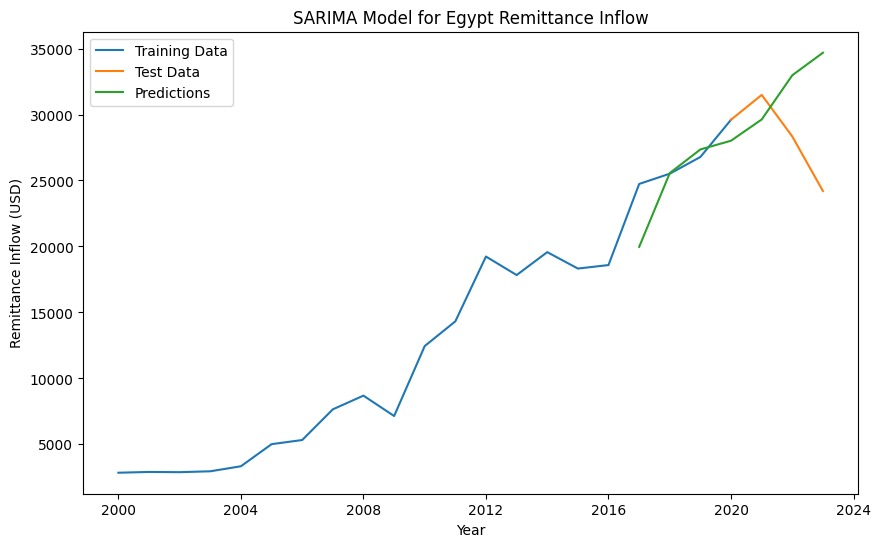

<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

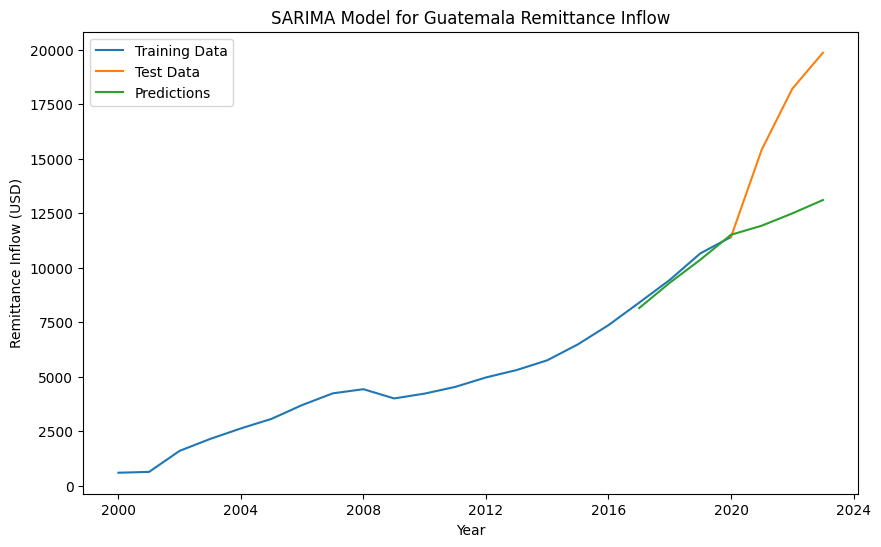

<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

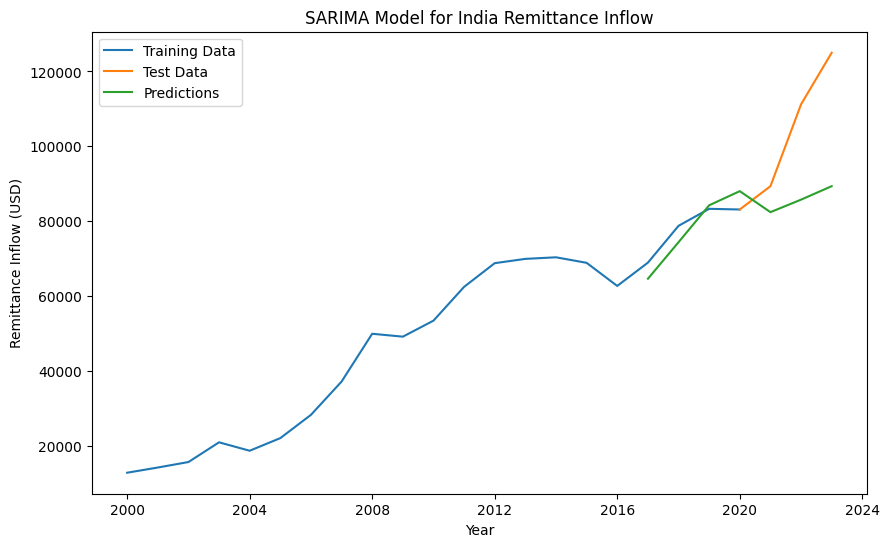

<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

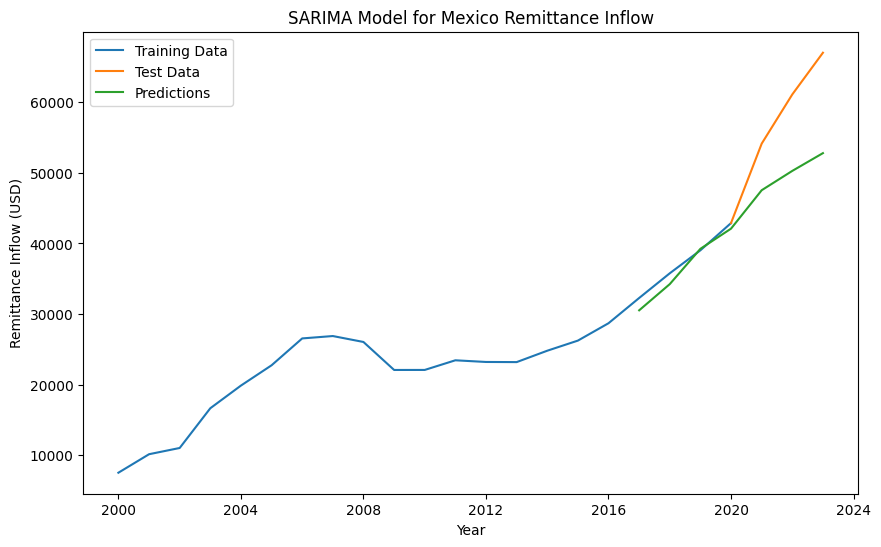

<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

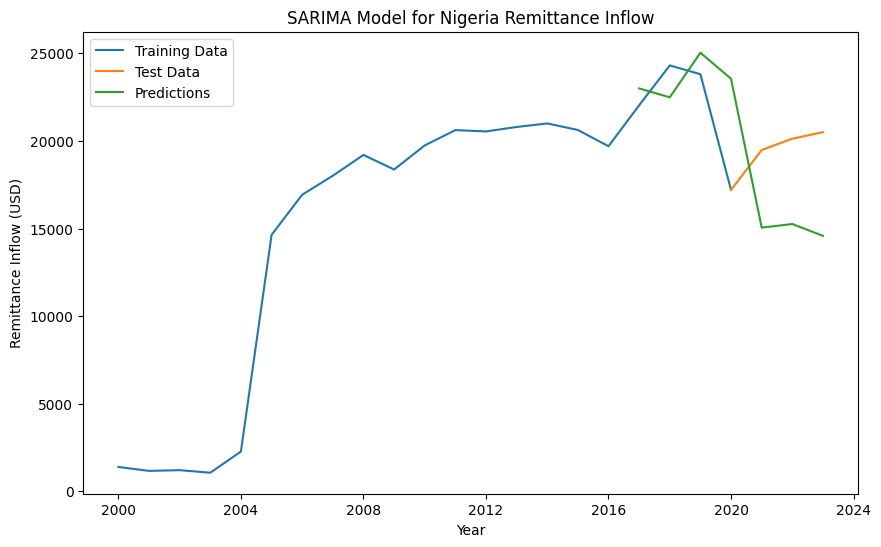

<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

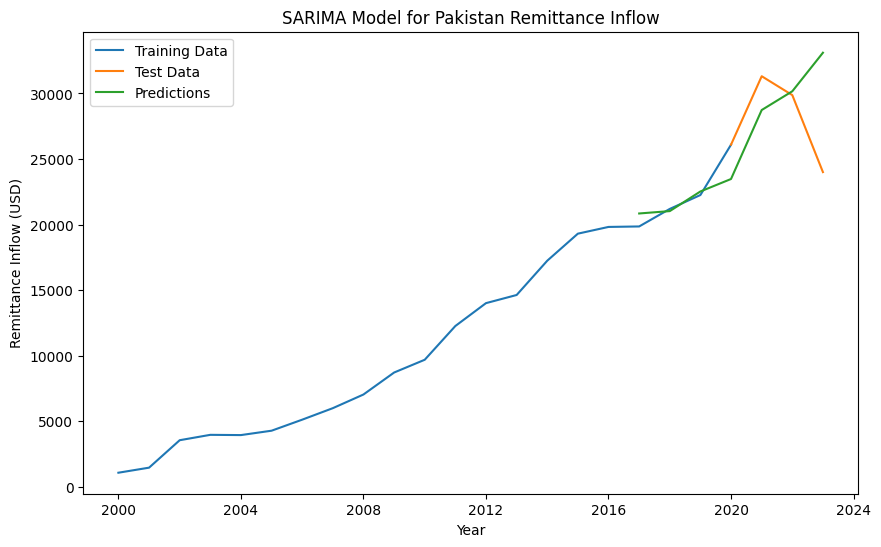

<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

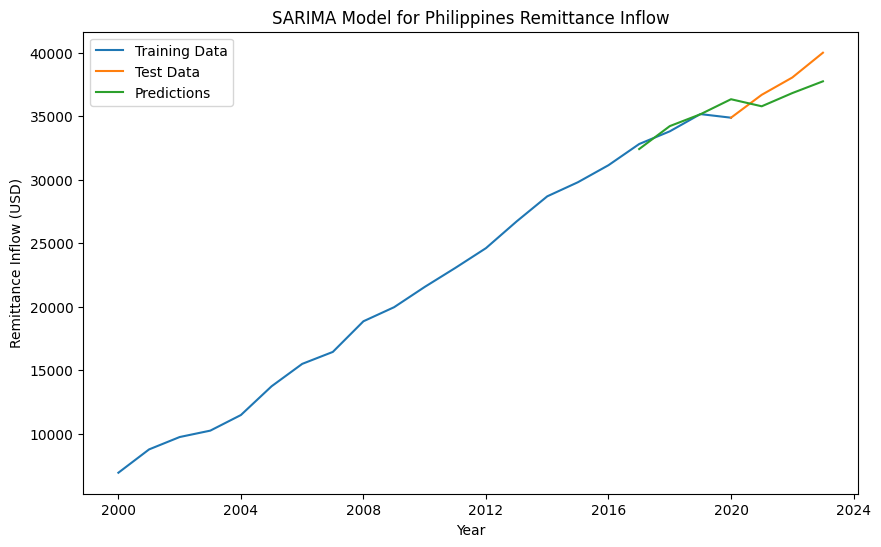

<ipython-input-168-1282dc6b991a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

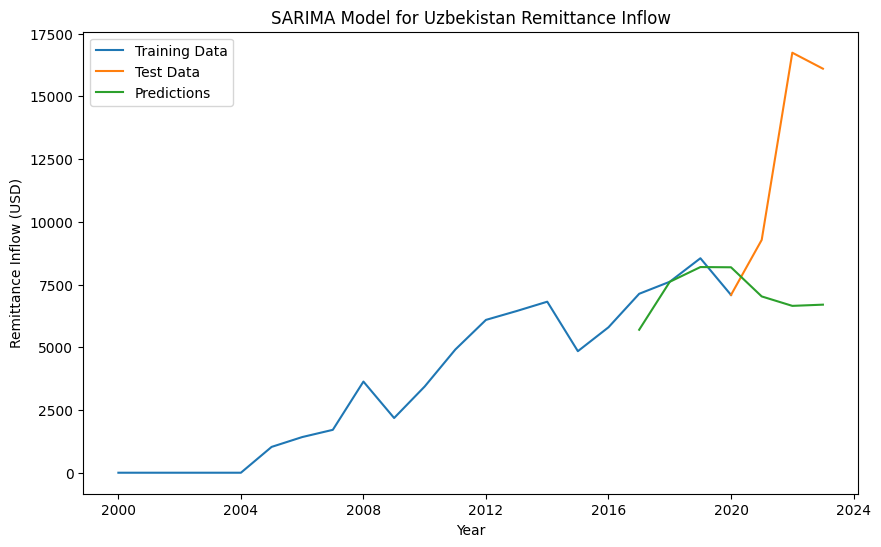

In [ ]:
predict_remittance_inflow(remittance_inflow_egypt, 'Egypt')
predict_remittance_inflow(remittance_inflow_guatemala, 'Guatemala')
predict_remittance_inflow(remittance_inflow_india, 'India')
predict_remittance_inflow(remittance_inflow_mexico, 'Mexico')
predict_remittance_inflow(remittance_inflow_nigeria, 'Nigeria')
predict_remittance_inflow(remittance_inflow_pakistan, 'Pakistan')
predict_remittance_inflow(remittance_inflow_philippines, 'Philippines')
predict_remittance_inflow(remittance_inflow_uzbekistan, 'Uzbekistan')

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


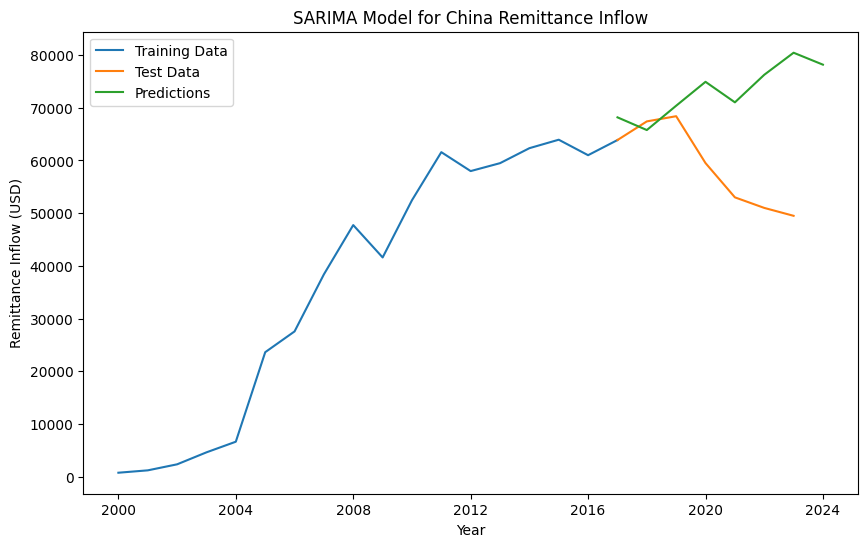

In [ ]:
# prompt: convert remittance_inflow_china['Year'] to date time, then predict for the remittance_inflow_china['Value'] for the last 5 years and plot it on the graph to show results. Predict using SARIMA

import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.tsa.statespace.sarimax as pf
from datetime import datetime


# Split the data into training and test sets
train_data = remittance_inflow_china[:'2017']
test_data = remittance_inflow_china['2017':]

# Fit a SARIMA model to the training data
model = pf.SARIMAX(train_data['Value'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12))
results = model.fit()

# Make predictions for the last 5 years
forecast = results.predict(start='2017-01-01', end='2023-12-31')

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(train_data['Value'], label='Training Data')
plt.plot(test_data['Value'], label='Test Data')
plt.plot(forecast, label='Predictions')
plt.xlabel('Year')
plt.ylabel('Remittance Inflow (USD)')
plt.title('SARIMA Model for China Remittance Inflow')
plt.legend()
plt.show()


In [ ]:
def predict_gdp_cp(df, country_name, start_train='2000', end_train='2020', start_pred='2017-01-01', end_pred='2023-01-01'):
    # Convert 'Year' to datetime if not already
    if not pd.api.types.is_datetime64_any_dtype(df['Year']):
        df['Year'] = pd.to_datetime(df['Year'], format='%Y')

    # Split the data into training and test sets
    train_data = df[:end_train]
    test_data = df[end_train:]

    # Fit a SARIMA model to the training data
    model = SARIMAX(train_data['Value'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12))
    results = model.fit()

    # Make predictions for the specified period
    forecast = results.predict(start=start_pred, end=end_pred)

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(train_data['Value'], label='Training Data')
    plt.plot(test_data['Value'], label='Test Data')
    plt.plot(forecast, label='Predictions')
    plt.xlabel('Year')
    plt.ylabel('Remittance Inflow (USD)')
    plt.title(f'SARIMA Model for {country_name} Remittance Inflow')
    plt.legend()
    plt.show()


In [ ]:
gdp_cp_china = grouped_data_china.get_group('Gross domestic product, current prices')
gdp_cp_egypt = grouped_data_egypt.get_group('Gross domestic product, current prices')
gdp_cp_guatemala = grouped_data_guatemala.get_group('Gross domestic product, current prices')
gdp_cp_india = grouped_data_india.get_group('Gross domestic product, current prices')
gdp_cp_mexico = grouped_data_mexico.get_group('Gross domestic product, current prices')
gdp_cp_nigeria = grouped_data_nigeria.get_group('Gross domestic product, current prices')
gdp_cp_pakistan = grouped_data_pakistan.get_group('Gross domestic product, current prices')
gdp_cp_philippines = grouped_data_philippines.get_group('Gross domestic product, current prices')
gdp_cp_uzbekistan = grouped_data_uzbekistan.get_group('Gross domestic product, current prices')

In [ ]:
remittance_inflow_egypt.head(2)

,Country,Country Code,Region,Element,Unit,Scale,Value
Year,,,,,,,
2000-01-01,"Egypt, Arab Rep.",EGY,Middle East and Central Asia,Remittance inflow,US Dollar,Million,2852.0
2001-01-01,"Egypt, Arab Rep.",EGY,Middle East and Central Asia,Remittance inflow,US Dollar,Million,2911.0


In [ ]:
remittance_inflow_china.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 24 entries, 2000-01-01 to 2023-01-01
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country       24 non-null     object 
 1   Country Code  24 non-null     object 
 2   Region        24 non-null     object 
 3   Element       24 non-null     object 
 4   Unit          24 non-null     object 
 5   Scale         24 non-null     object 
 6   Value         24 non-null     float64
dtypes: float64(1), object(6)
memory usage: 2.0+ KB


In [ ]:
#remittance_inflow_china['Value'] = remittance_inflow_china['Value'].str.replace(',', '').astype(int)

MAE: 5572.347506461963
MSE: 45007795.04106949


#**China Case Study**

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


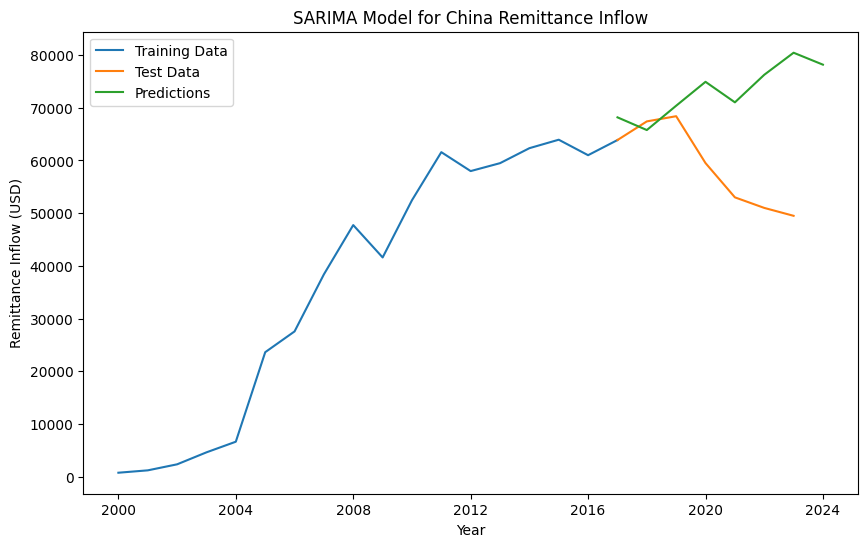

In [ ]:
# prompt: convert remittance_inflow_china['Year'] to date time, then predict for the remittance_inflow_china['Value'] for the last 5 years and plot it on the graph to show results. Predict using SARIMA

import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.tsa.statespace.sarimax as pf
from datetime import datetime


# Split the data into training and test sets
train_data = remittance_inflow_china[:'2017']
test_data = remittance_inflow_china['2017':]

# Fit a SARIMA model to the training data
model = pf.SARIMAX(train_data['Value'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12))
results = model.fit()

# Make predictions for the last 5 years
forecast = results.predict(start='2017-01-01', end='2023-12-31')

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(train_data['Value'], label='Training Data')
plt.plot(test_data['Value'], label='Test Data')
plt.plot(forecast, label='Predictions')
plt.xlabel('Year')
plt.ylabel('Remittance Inflow (USD)')
plt.title('SARIMA Model for China Remittance Inflow')
plt.legend()
plt.show()


#**Modelling Elements**

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from datetime import datetime

In [ ]:
def predict_elements(df, country_name, element, start_train='2000-01-01', end_train='2019-01-01'):
    # Convert 'Year' to datetime if not already
    if not pd.api.types.is_datetime64_any_dtype(df['Year']):
        df['Year'] = pd.to_datetime(df['Year'], format='%Y')
        #df.index = pd.to_datetime(df.index, format='%Y')

    df.set_index('Year', inplace=True)

    # Split the data into training and test sets
    train_data = df[:end_train]
    test_data = df[end_train:]

    # Fit a SARIMA model to the training data
    model = SARIMAX(train_data['Value'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12))
    results = model.fit()

    # Make predictions for the specified period
    forecast = results.predict(start=test_data.index[0], end=test_data.index[-1])

    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(train_data['Value'], label='Training Data')
    plt.plot(test_data['Value'], label='Test Data')
    plt.plot(forecast, label='Predictions')
    plt.xlabel('Year')
    plt.ylabel('Remittance Inflow (USD)')
    plt.title(f'SARIMA Model for {country_name} {element}')
    plt.legend()
    plt.show()

    return forecast, test_data['Value']


In [ ]:
unique_elements

array(['Remittance inflow', 'Gross domestic product, current prices',
       'Percent of GDP', 'Inflation, average consumer prices',
       'Human Development Index',
       'Households and NPISHs Final consumption expenditure',
       'Multidimensional poverty headcount ratio (World Bank)',
       'Unemployment rate'], dtype=object)

##**Remittance inflow**

In [ ]:
element = 'Remittance inflow'

In [ ]:
rem_bangladesh = grouped_data_bangladesh.get_group(element)
rem_china = grouped_data_china.get_group(element)
rem_egypt = grouped_data_egypt.get_group(element)
rem_guatemala = grouped_data_guatemala.get_group(element)
rem_india = grouped_data_india.get_group(element)
rem_mexico = grouped_data_mexico.get_group(element)
rem_nigeria = grouped_data_nigeria.get_group(element)
rem_pakistan = grouped_data_pakistan.get_group(element)
rem_philippines = grouped_data_philippines.get_group(element)
rem_uzbekistan = grouped_data_uzbekistan.get_group(element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

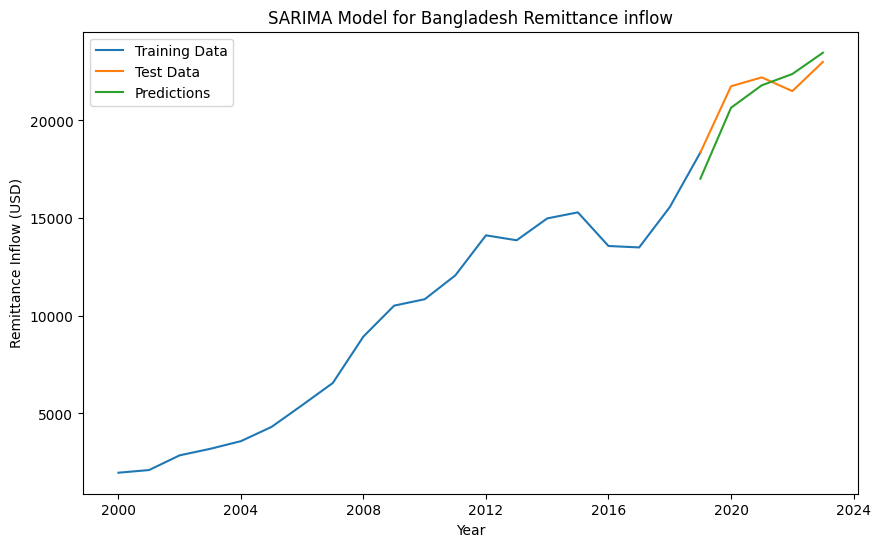

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

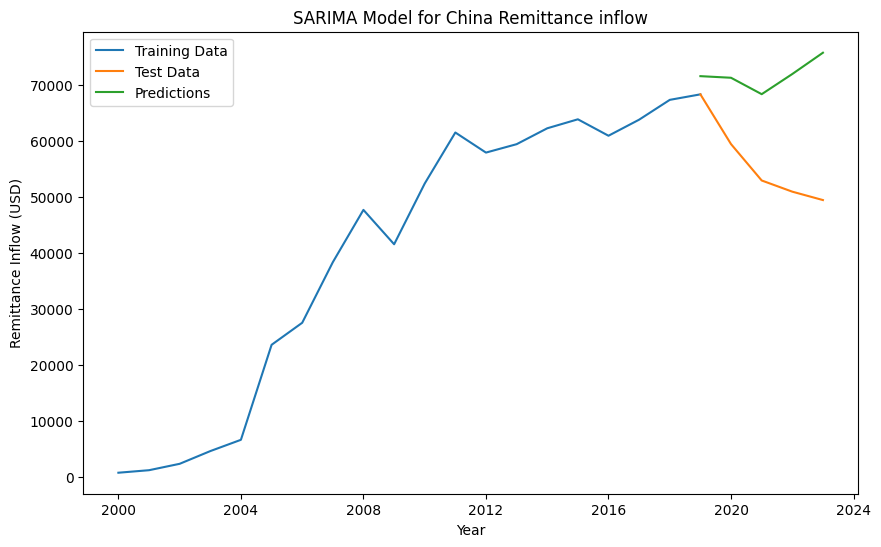

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

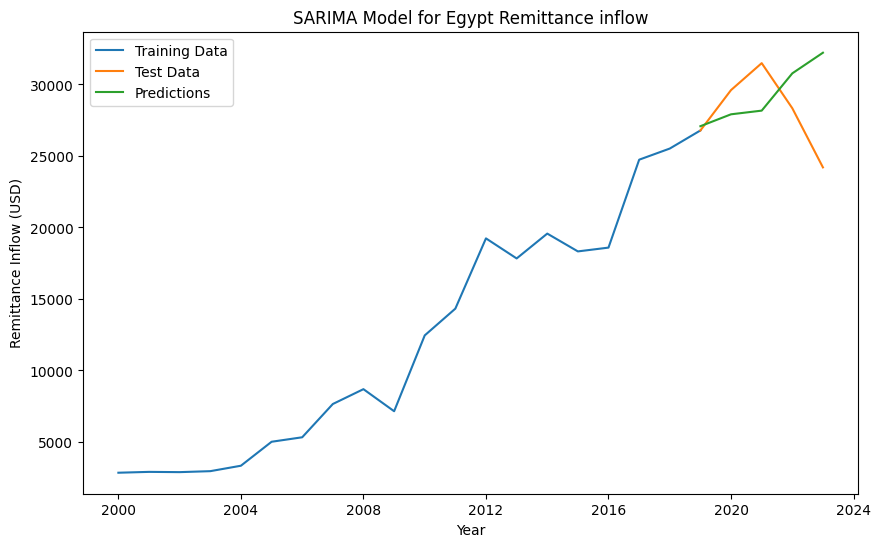

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

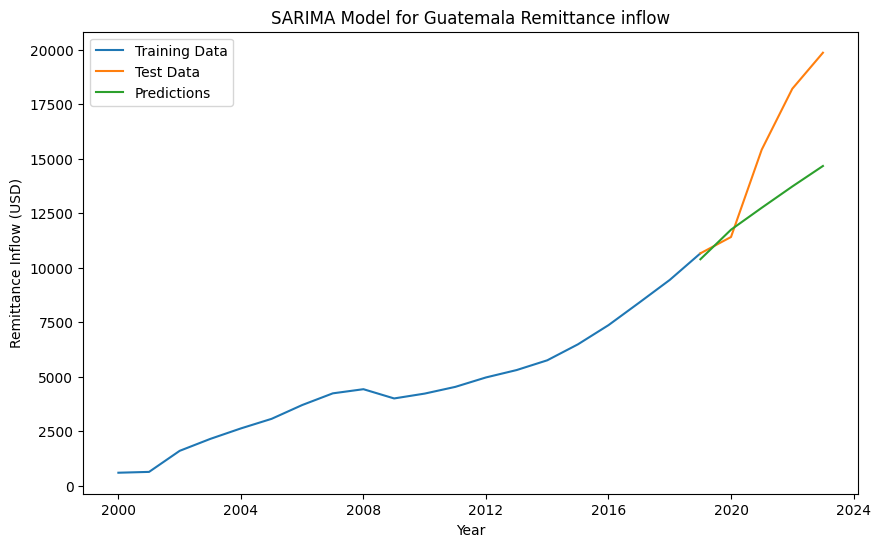

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

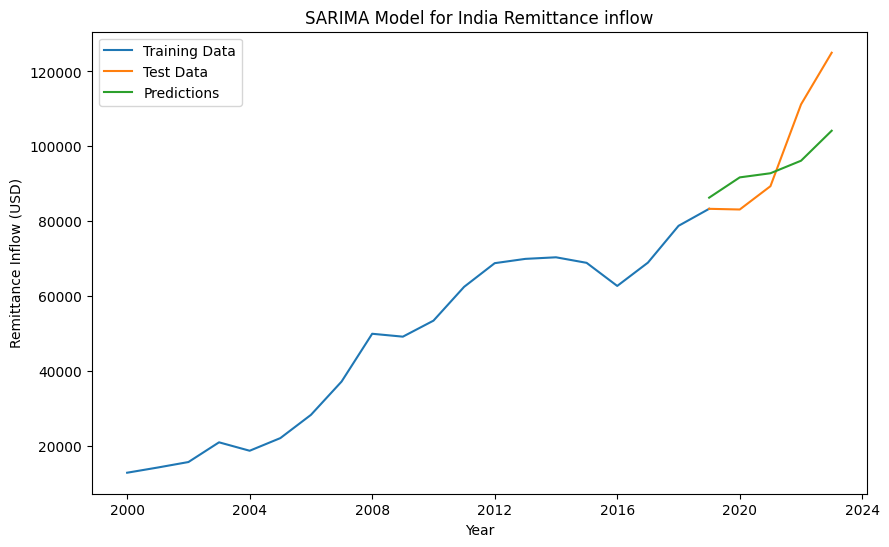

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

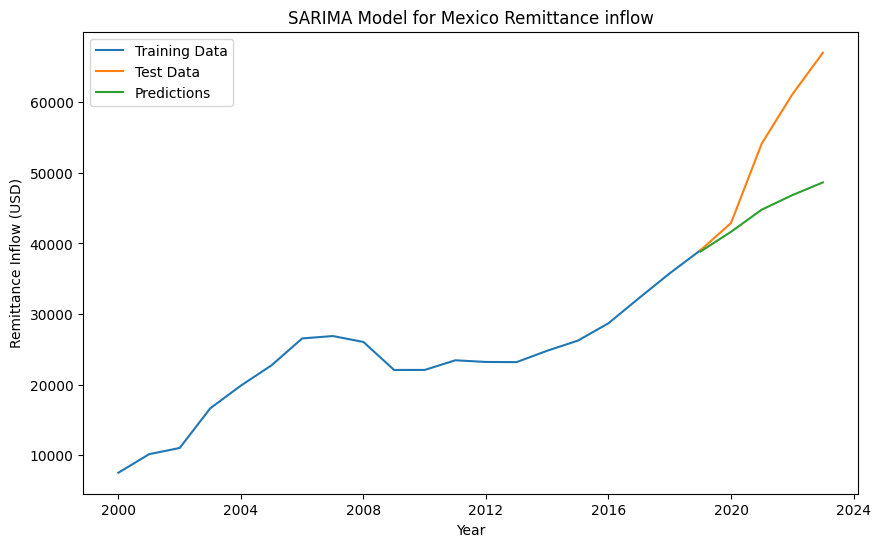

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

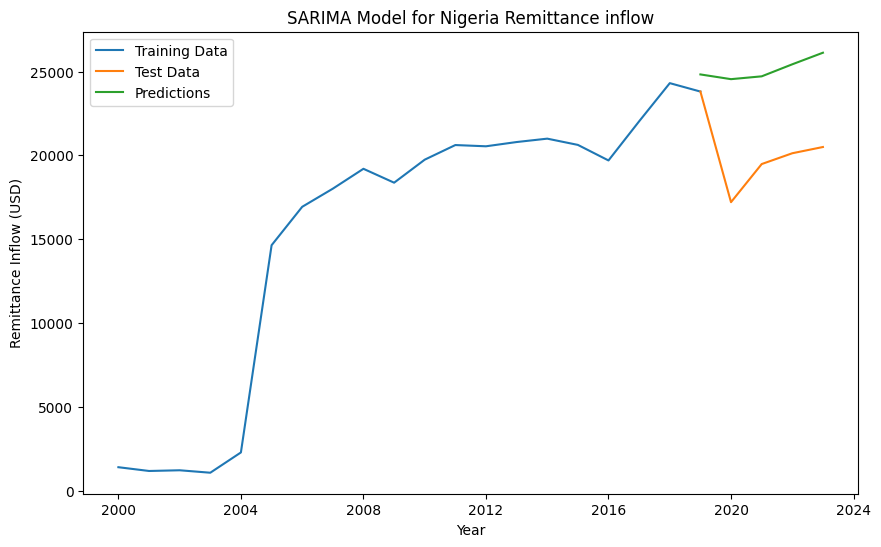

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

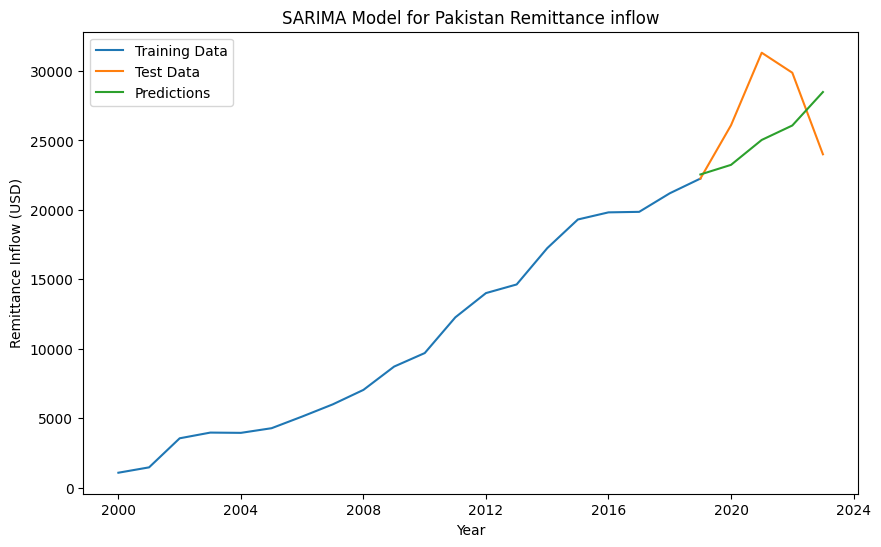

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

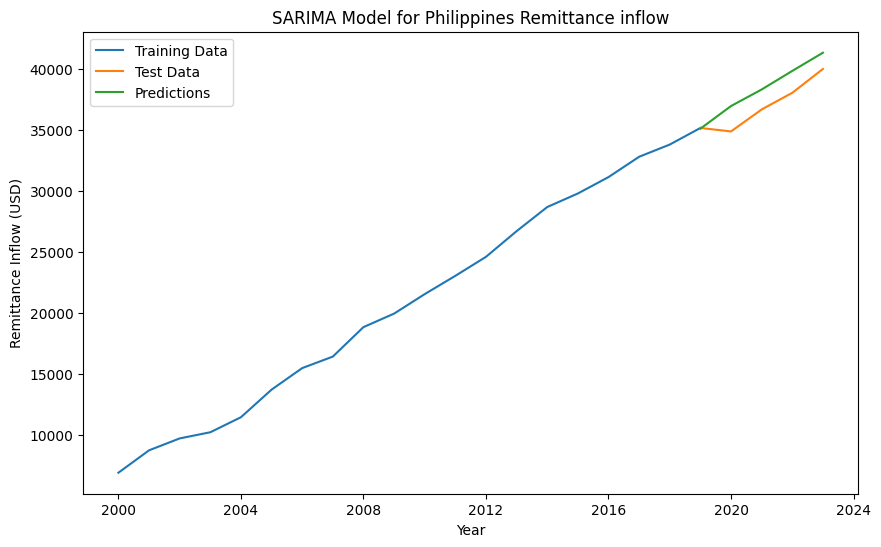

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

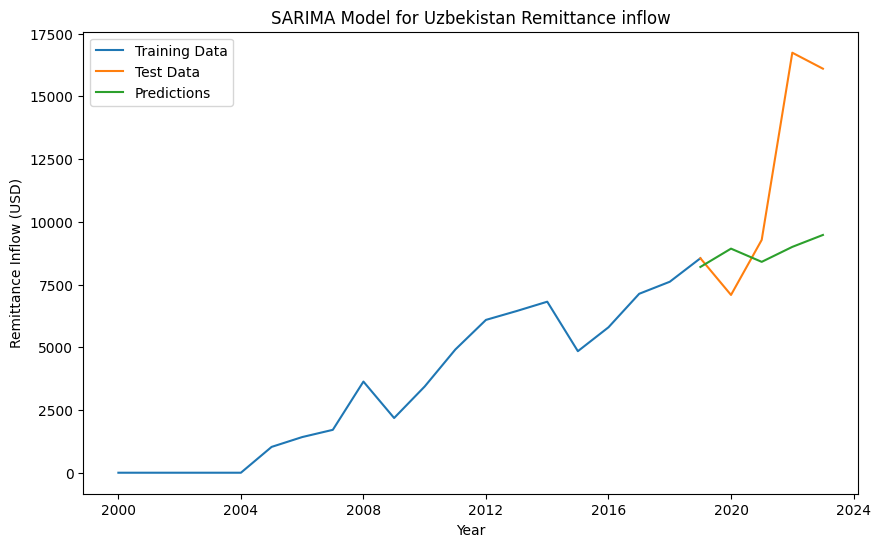

In [ ]:
pred_rem_bangladesh, true_rem_bangladesh = predict_elements(rem_bangladesh, 'Bangladesh', element)
pred_rem_china, true_rem_china = predict_elements(rem_china, 'China', element)
pred_rem_egypt, true_rem_egypt = predict_elements(rem_egypt, 'Egypt', element)
pred_rem_guatemala, true_rem_guatemala = predict_elements(rem_guatemala, 'Guatemala', element)
pred_rem_india, true_rem_india = predict_elements(rem_india, 'India', element)
pred_rem_mexico, true_rem_mexico = predict_elements(rem_mexico, 'Mexico', element)
pred_rem_nigeria, true_rem_nigeria = predict_elements(rem_nigeria, 'Nigeria', element)
pred_rem_pakistan, true_rem_pakistan = predict_elements(rem_pakistan, 'Pakistan', element)
pred_rem_philippines, true_rem_philippines = predict_elements(rem_philippines, 'Philippines', element)
pred_rem_uzbekistan, true_rem_uzbekistan = predict_elements(rem_uzbekistan, 'Uzbekistan', element)

##**Gross domestic product, current prices**

In [ ]:
element = 'Gross domestic product, current prices'

In [ ]:
#['US Dollar' 'Purchasing power parity; international dollars']

In [ ]:
gdp_cp_bangladesh = grouped_data_bangladesh.get_group(element).groupby('Unit')
gdp_cp_china = grouped_data_china.get_group(element).groupby('Unit')
gdp_cp_egypt = grouped_data_egypt.get_group(element).groupby('Unit')
gdp_cp_guatemala = grouped_data_guatemala.get_group(element).groupby('Unit')
gdp_cp_india = grouped_data_india.get_group(element).groupby('Unit')
gdp_cp_mexico = grouped_data_mexico.get_group(element).groupby('Unit')
gdp_cp_nigeria = grouped_data_nigeria.get_group(element).groupby('Unit')
gdp_cp_pakistan = grouped_data_pakistan.get_group(element).groupby('Unit')
gdp_cp_philippines = grouped_data_philippines.get_group(element).groupby('Unit')
gdp_cp_uzbekistan = grouped_data_uzbekistan.get_group(element).groupby('Unit')

###**US Dollar**

In [ ]:
sub_element = 'US Dollar'

In [ ]:
gdp_cp_bangladesh_us = gdp_cp_bangladesh.get_group(sub_element)
gdp_cp_china_us = gdp_cp_china.get_group(sub_element)
gdp_cp_egypt_us = gdp_cp_egypt.get_group(sub_element)
gdp_cp_guatemala_us = gdp_cp_guatemala.get_group(sub_element)
gdp_cp_india_us = gdp_cp_india.get_group(sub_element)
gdp_cp_mexico_us = gdp_cp_mexico.get_group(sub_element)
gdp_cp_nigeria_us = gdp_cp_nigeria.get_group(sub_element)
gdp_cp_pakistan_us = gdp_cp_pakistan.get_group(sub_element)
gdp_cp_philippines_us = gdp_cp_philippines.get_group(sub_element)
gdp_cp_uzbekistan_us = gdp_cp_uzbekistan.get_group(sub_element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

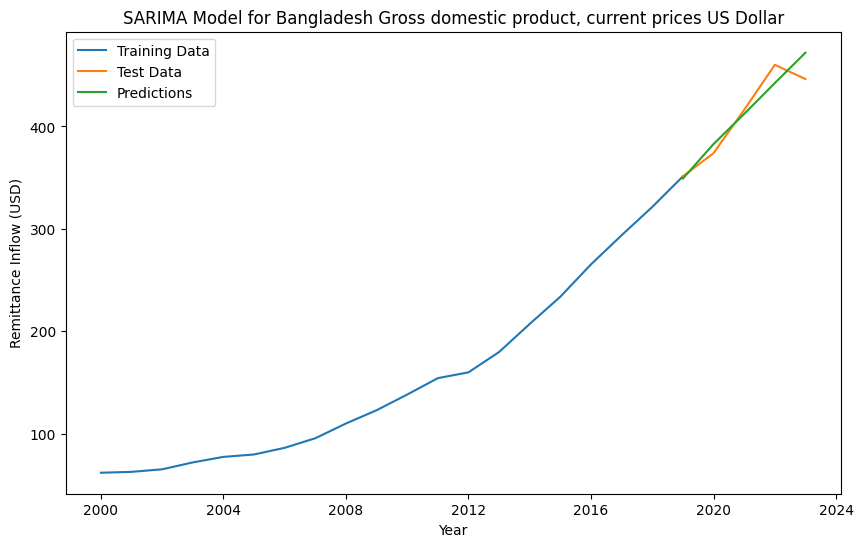

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

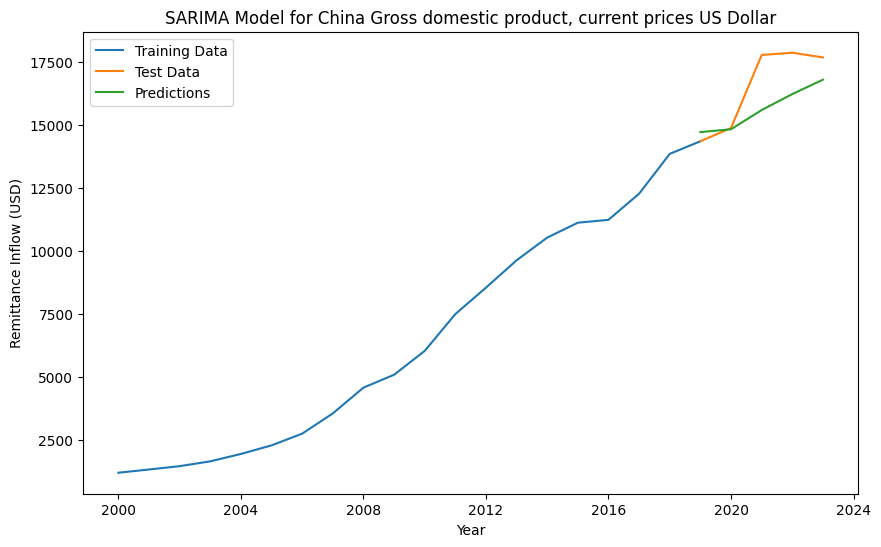

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

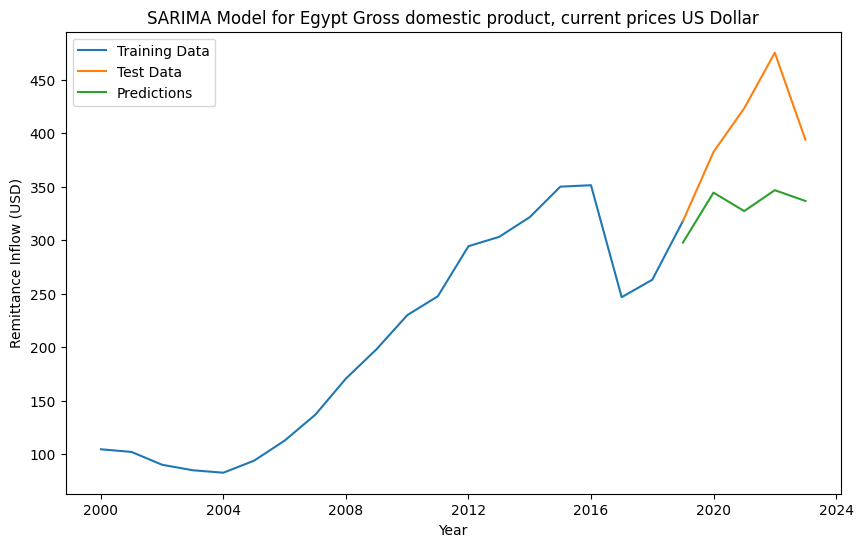

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

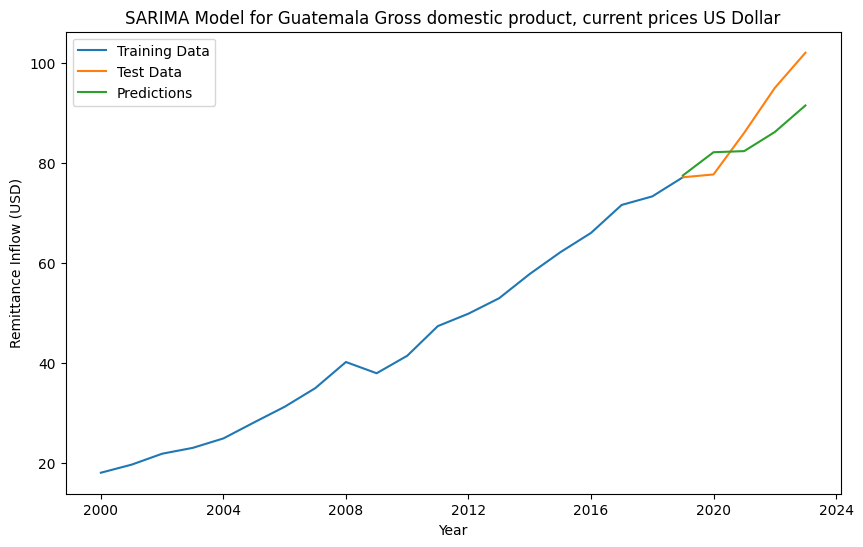

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

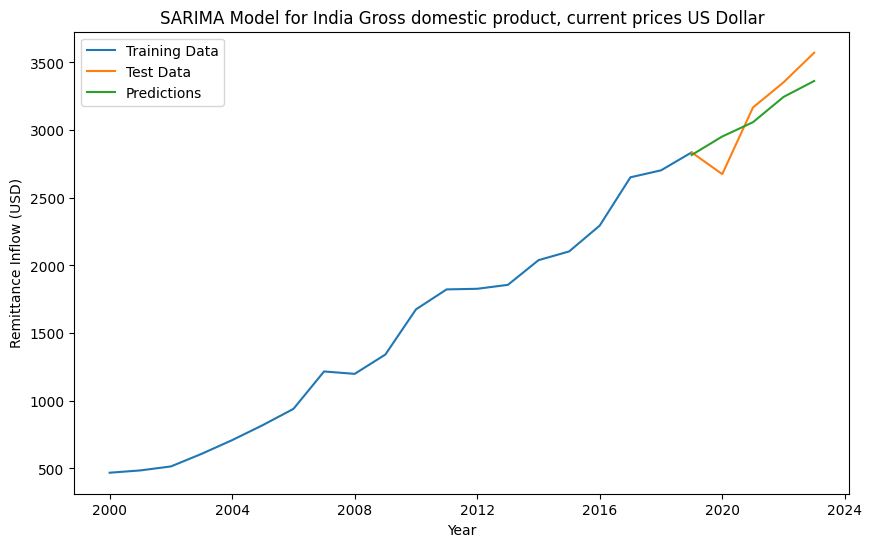

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

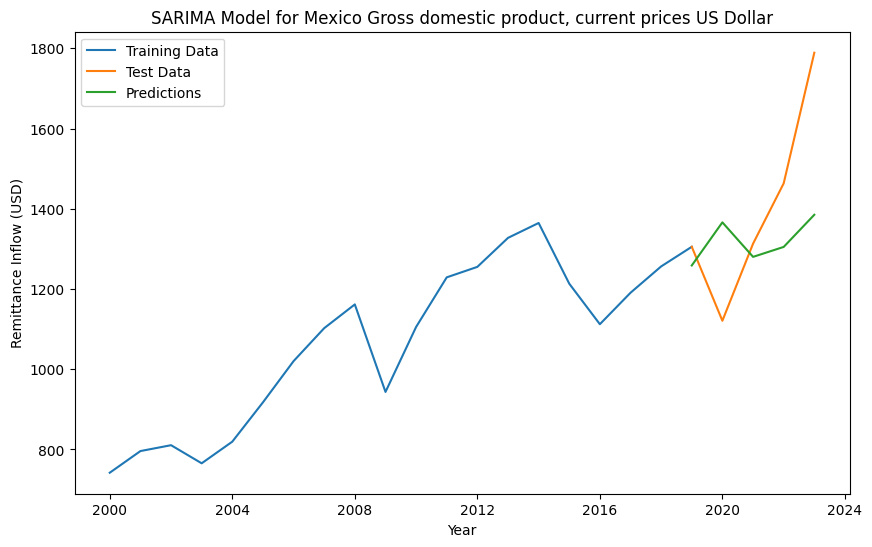

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

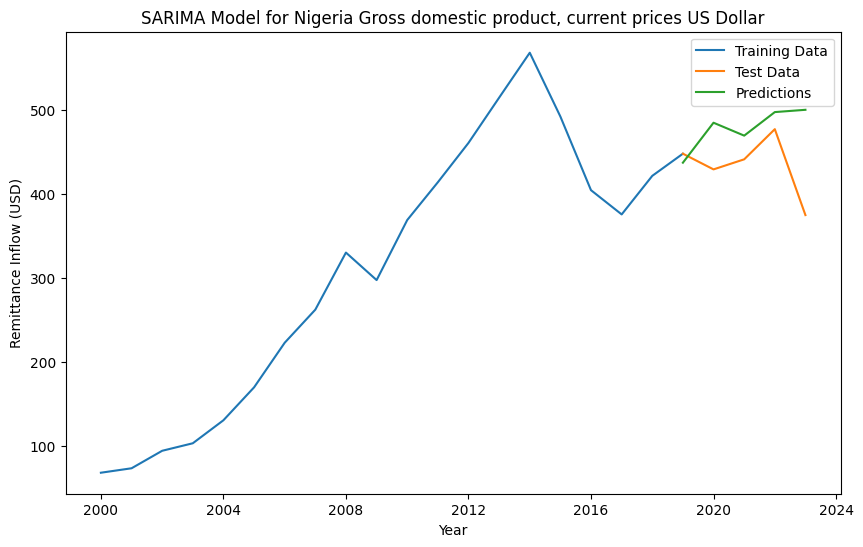

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

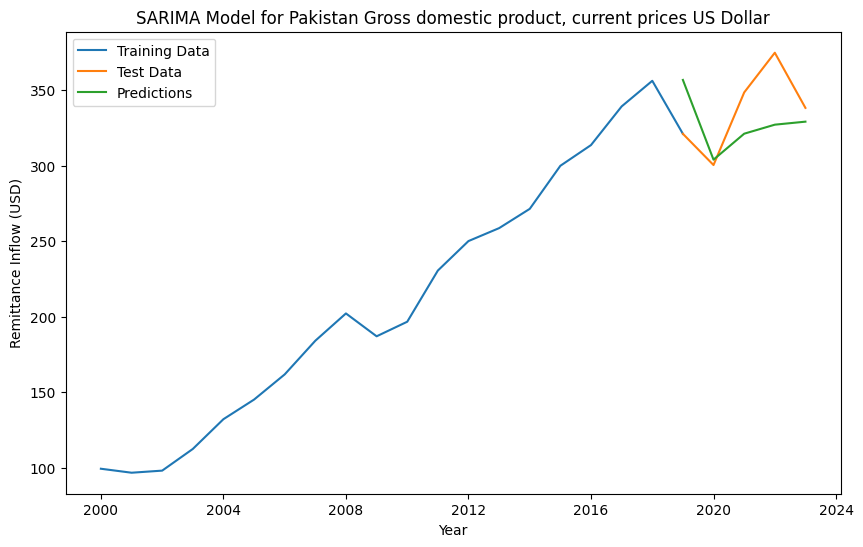

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

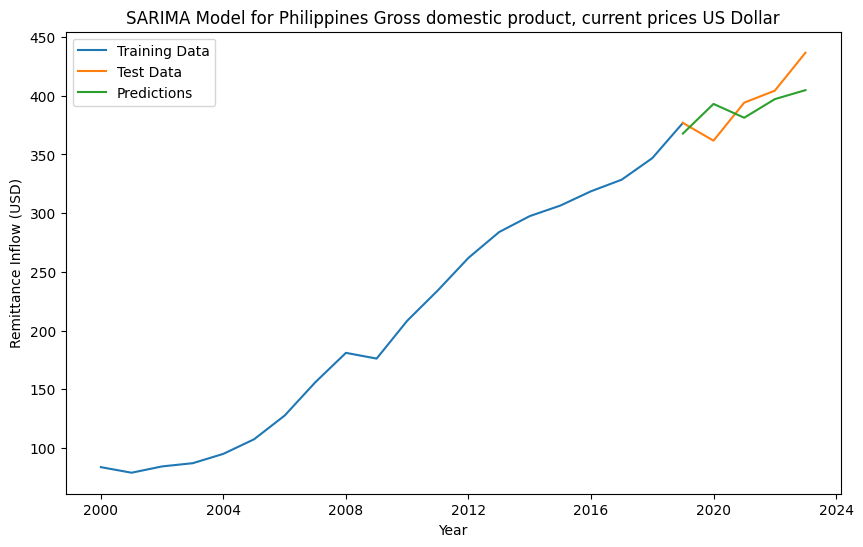

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

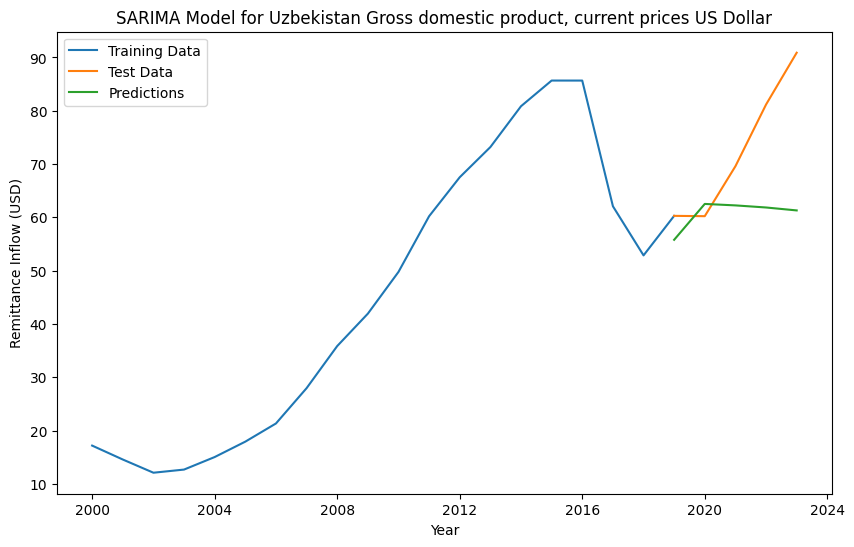

In [ ]:
pred_gdp_cp_bangladesh_us, true_gdp_cp_bangladesh_us = predict_elements(gdp_cp_bangladesh_us, 'Bangladesh', element+' '+sub_element)
pred_gdp_cp_china_us, true_gdp_cp_china_us = predict_elements(gdp_cp_china_us, 'China', element+' '+sub_element)
pred_gdp_cp_egypt_us, true_gdp_cp_egypt_us = predict_elements(gdp_cp_egypt_us, 'Egypt', element+' '+sub_element)
pred_gdp_cp_guatemala_us, true_gdp_cp_guatemala_us = predict_elements(gdp_cp_guatemala_us, 'Guatemala', element+' '+sub_element)
pred_gdp_cp_india_us, true_gdp_cp_india_us = predict_elements(gdp_cp_india_us, 'India', element+' '+sub_element)
pred_gdp_cp_mexico_us, true_gdp_cp_mexico_us = predict_elements(gdp_cp_mexico_us, 'Mexico', element+' '+sub_element)
pred_gdp_cp_nigeria_us, true_gdp_cp_nigeria_us = predict_elements(gdp_cp_nigeria_us, 'Nigeria', element+' '+sub_element)
pred_gdp_cp_pakistan_us, true_gdp_cp_pakistan_us = predict_elements(gdp_cp_pakistan_us, 'Pakistan', element+' '+sub_element)
pred_gdp_cp_philippines_us, true_gdp_cp_philippines_us = predict_elements(gdp_cp_philippines_us, 'Philippines', element+' '+sub_element)
pred_gdp_cp_uzbekistan_us, true_gdp_cp_uzbekistan_us = predict_elements(gdp_cp_uzbekistan_us, 'Uzbekistan', element+' '+sub_element)

###**Purchasing power parity; international dollars**

In [ ]:
sub_element = 'Purchasing power parity; international dollars'

In [ ]:
gdp_cp_bangladesh_id = gdp_cp_bangladesh.get_group(sub_element)
gdp_cp_china_id = gdp_cp_china.get_group(sub_element)
gdp_cp_egypt_id = gdp_cp_egypt.get_group(sub_element)
gdp_cp_guatemala_id = gdp_cp_guatemala.get_group(sub_element)
gdp_cp_india_id = gdp_cp_india.get_group(sub_element)
gdp_cp_mexico_id = gdp_cp_mexico.get_group(sub_element)
gdp_cp_nigeria_id = gdp_cp_nigeria.get_group(sub_element)
gdp_cp_pakistan_id = gdp_cp_pakistan.get_group(sub_element)
gdp_cp_philippines_id = gdp_cp_philippines.get_group(sub_element)
gdp_cp_uzbekistan_id = gdp_cp_uzbekistan.get_group(sub_element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

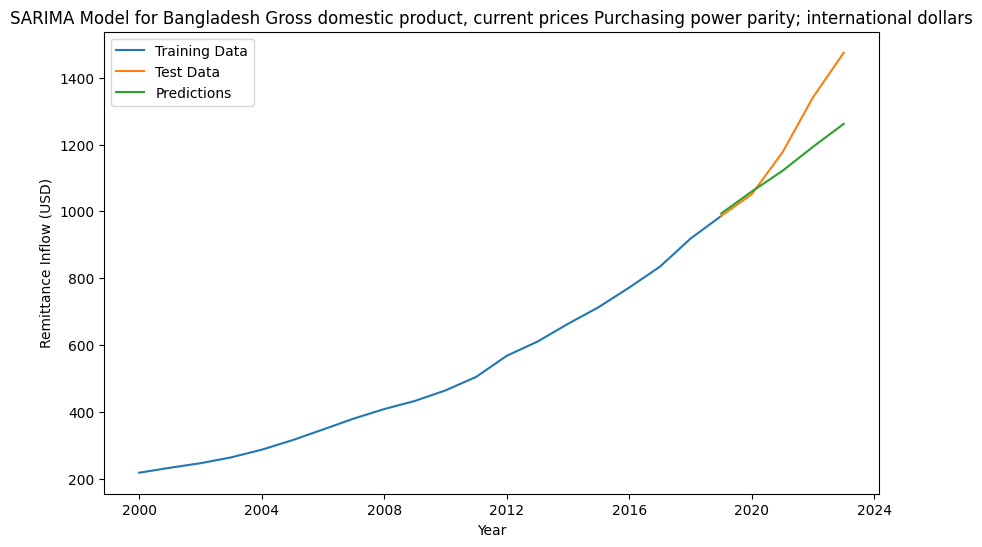

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

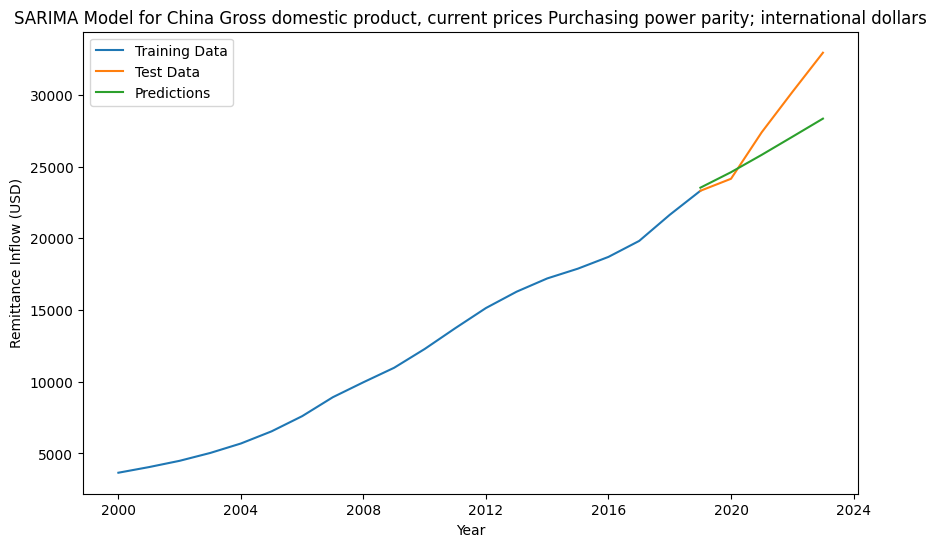

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

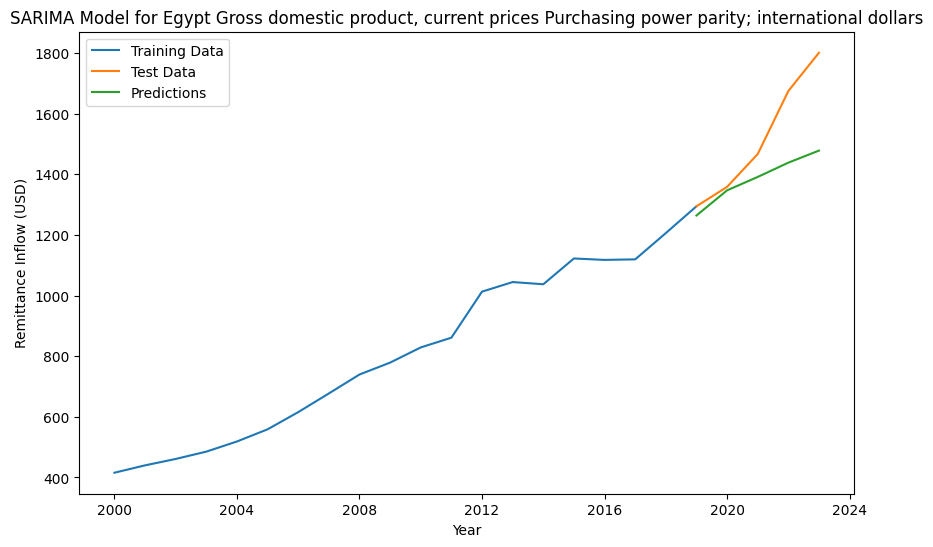

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

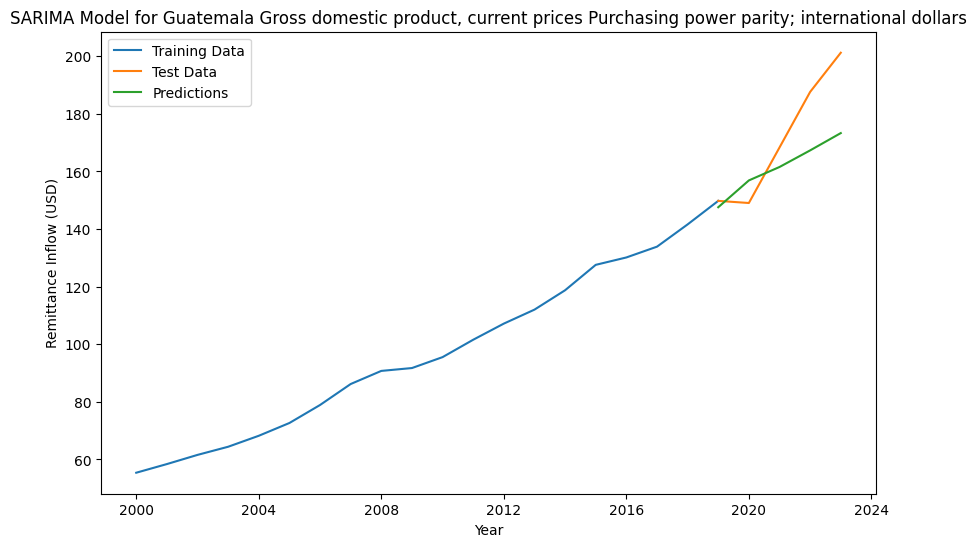

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

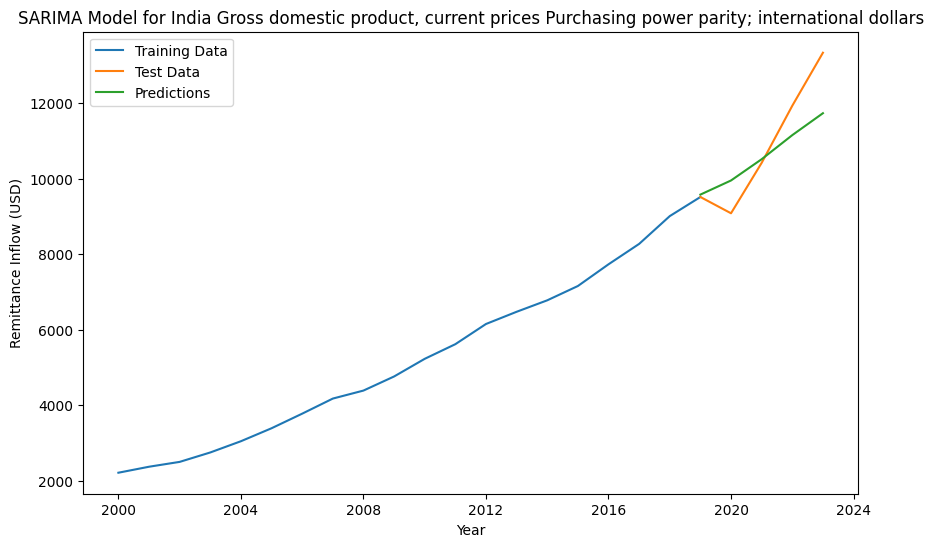

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

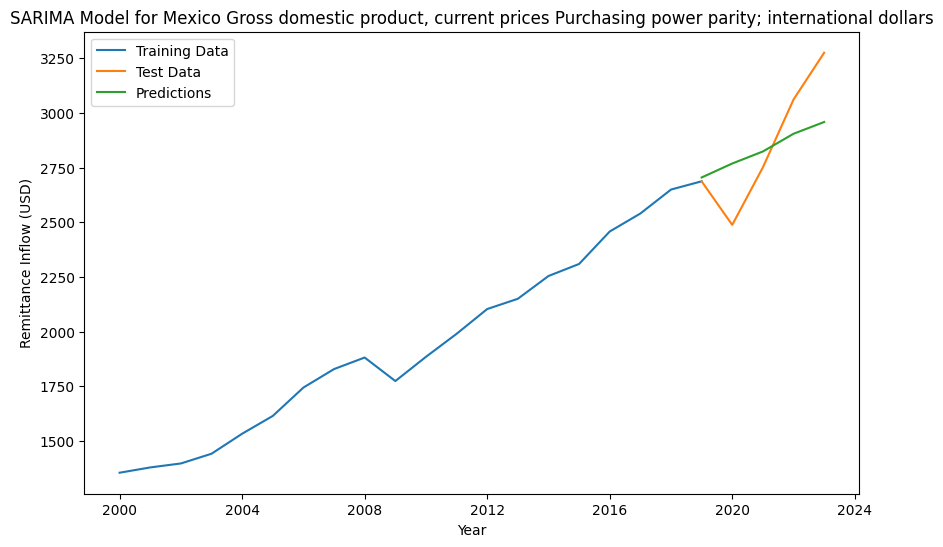

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

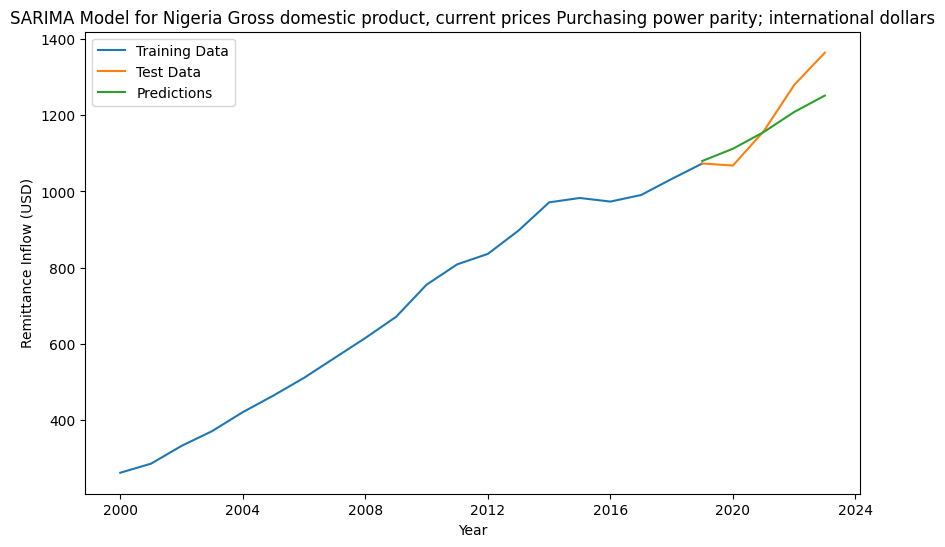

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

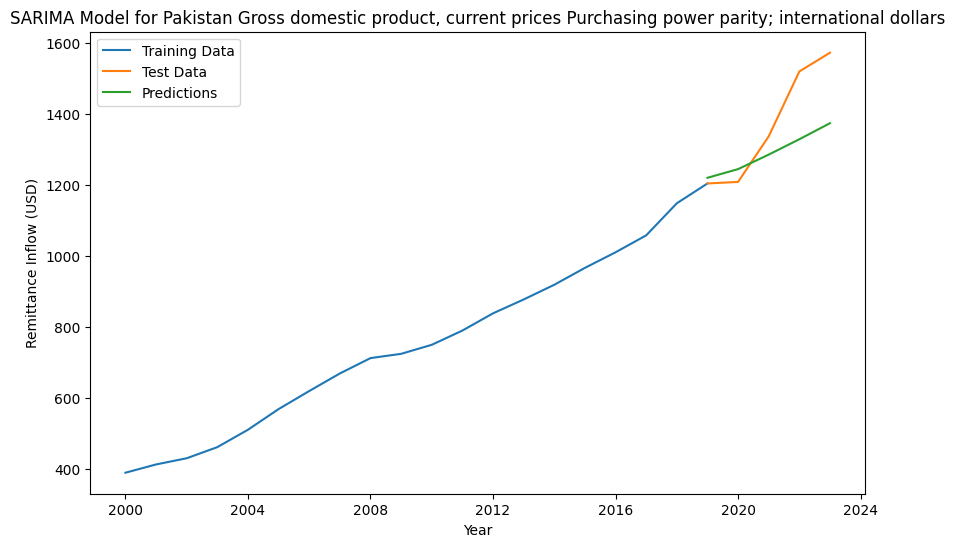

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

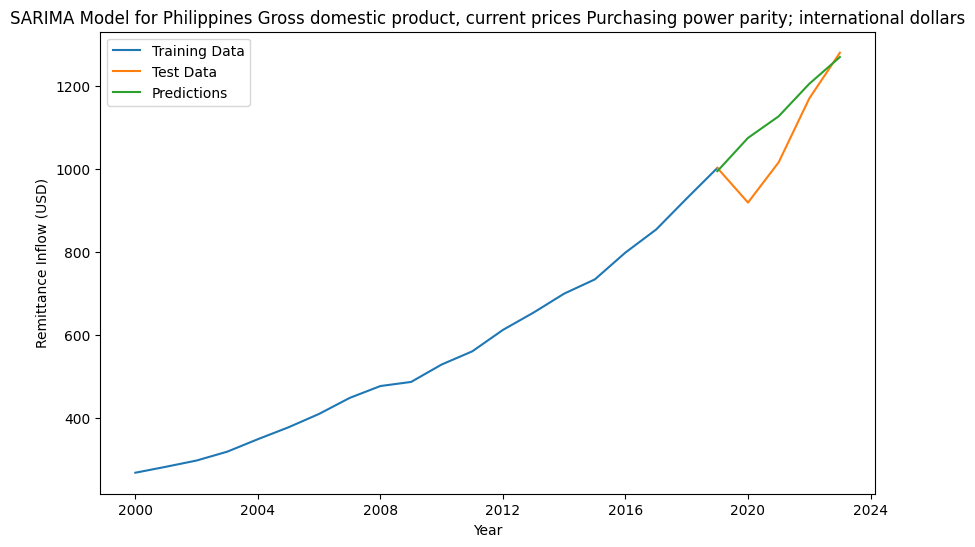

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

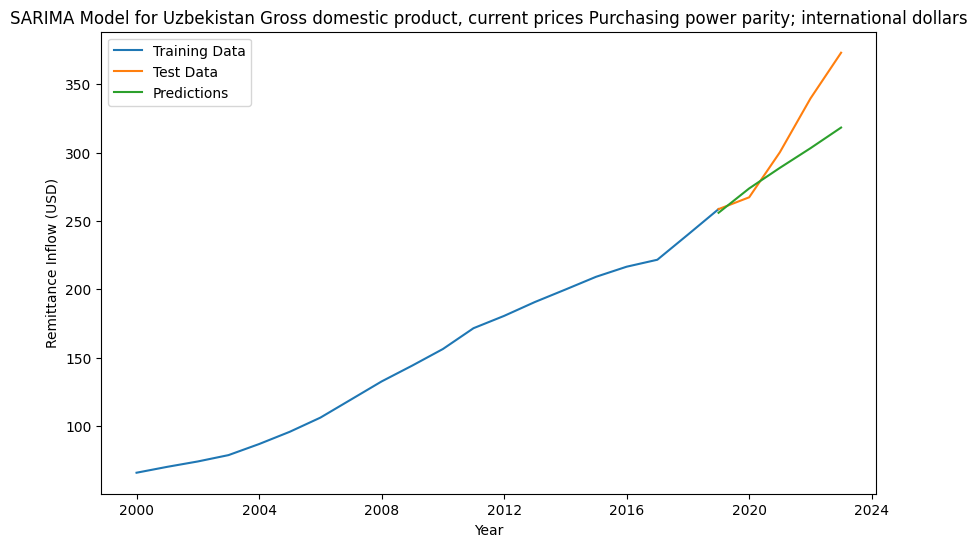

In [ ]:
pred_gdp_cp_bangladesh_id, true_gdp_cp_bangladesh_id = predict_elements(gdp_cp_bangladesh_id, 'Bangladesh', element+' '+sub_element)
pred_gdp_cp_china_id, true_gdp_cp_china_id = predict_elements(gdp_cp_china_id, 'China', element+' '+sub_element)
pred_gdp_cp_egypt_id, true_gdp_cp_egypt_id = predict_elements(gdp_cp_egypt_id, 'Egypt', element+' '+sub_element)
pred_gdp_cp_guatemala_id, true_gdp_cp_guatemala_id = predict_elements(gdp_cp_guatemala_id, 'Guatemala', element+' '+sub_element)
pred_gdp_cp_india_id, true_gdp_cp_india_id = predict_elements(gdp_cp_india_id, 'India', element+' '+sub_element)
pred_gdp_cp_mexico_id, true_gdp_cp_mexico_id = predict_elements(gdp_cp_mexico_id, 'Mexico', element+' '+sub_element)
pred_gdp_cp_nigeria_id, true_gdp_cp_nigeria_id = predict_elements(gdp_cp_nigeria_id, 'Nigeria', element+' '+sub_element)
pred_gdp_cp_pakistan_id, true_gdp_cp_pakistan_id = predict_elements(gdp_cp_pakistan_id, 'Pakistan', element+' '+sub_element)
pred_gdp_cp_philippines_id, true_gdp_cp_philippines_id = predict_elements(gdp_cp_philippines_id, 'Philippines', element+' '+sub_element)
pred_gdp_cp_uzbekistan_id, true_gdp_cp_uzbekistan_id = predict_elements(gdp_cp_uzbekistan_id, 'Uzbekistan', element+' '+sub_element)

##**Percent of GDP**

In [ ]:
element = 'Percent of GDP'

In [ ]:
per_gdp_bangladesh = grouped_data_bangladesh.get_group(element)
per_gdp_china = grouped_data_china.get_group(element)
per_gdp_egypt = grouped_data_egypt.get_group(element)
per_gdp_guatemala = grouped_data_guatemala.get_group(element)
per_gdp_india = grouped_data_india.get_group(element)
per_gdp_mexico = grouped_data_mexico.get_group(element)
per_gdp_nigeria = grouped_data_nigeria.get_group(element)
per_gdp_pakistan = grouped_data_pakistan.get_group(element)
per_gdp_philippines = grouped_data_philippines.get_group(element)
per_gdp_uzbekistan = grouped_data_uzbekistan.get_group(element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

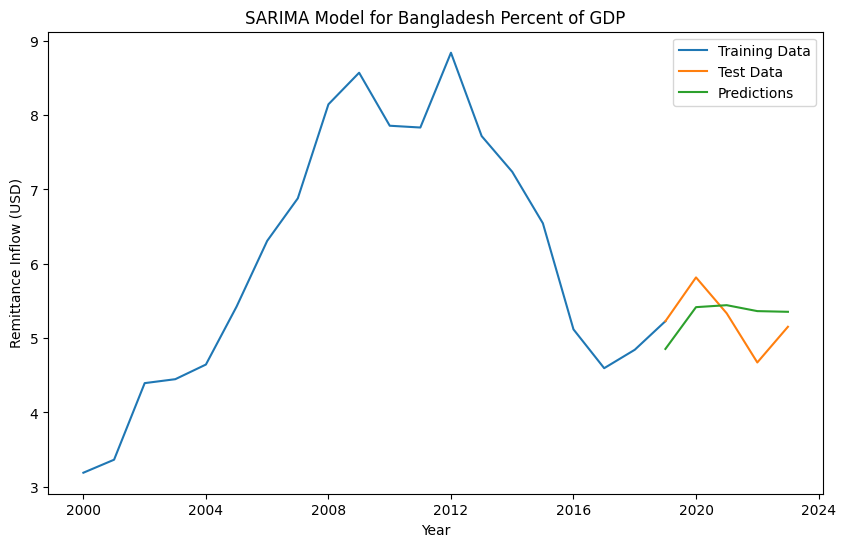

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

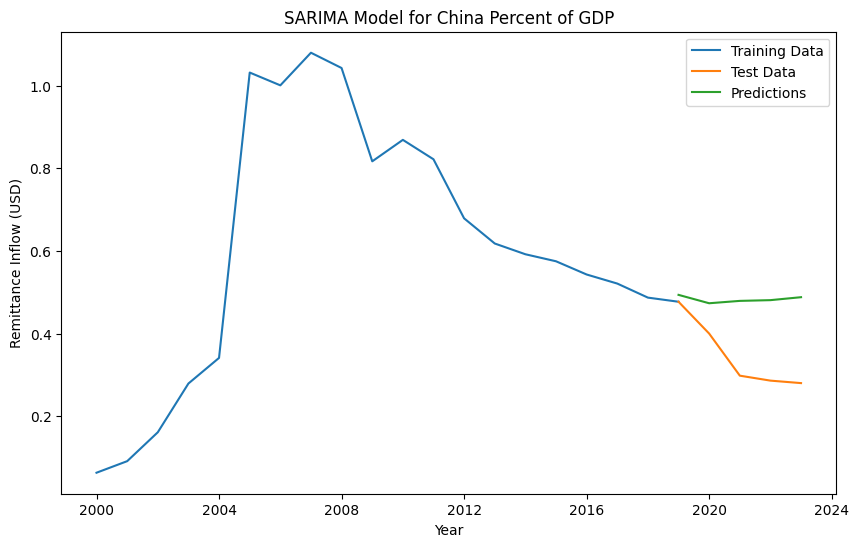

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

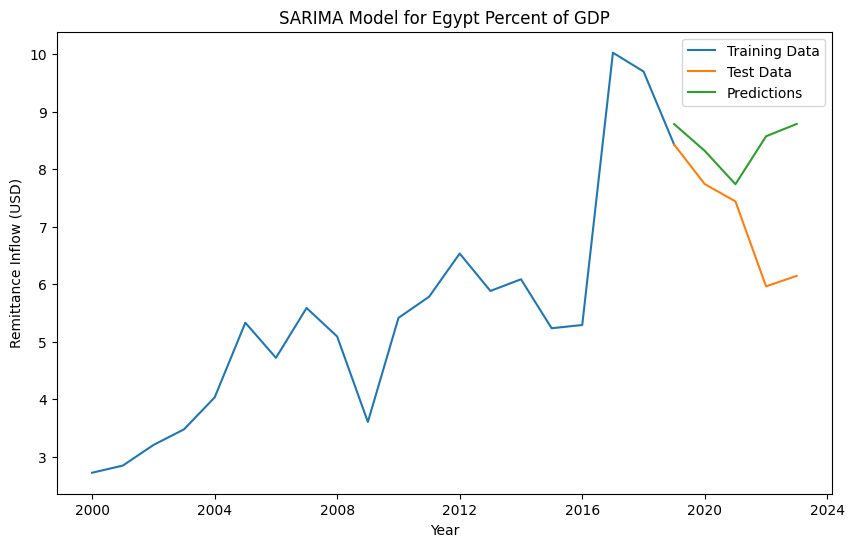

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

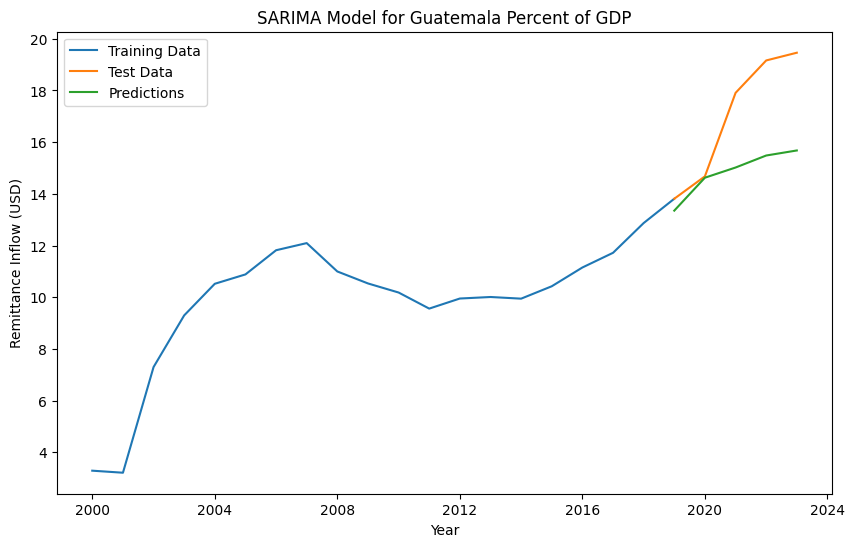

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

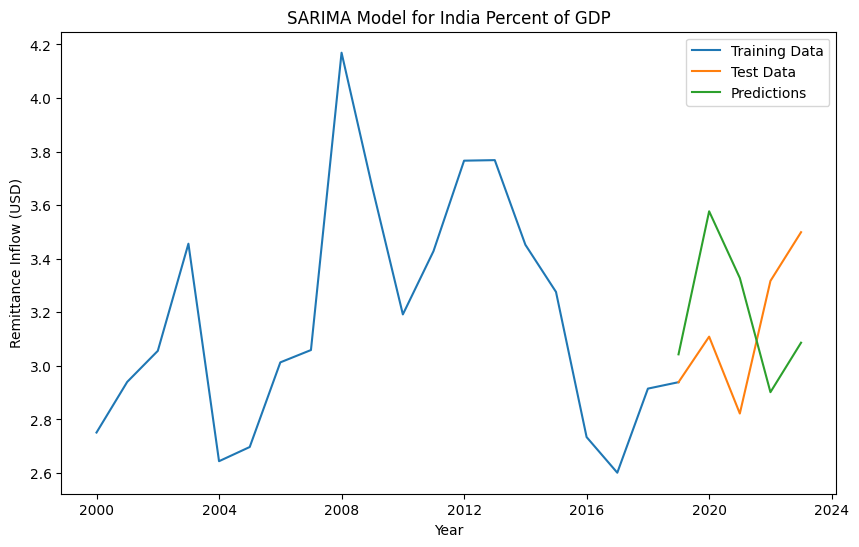

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

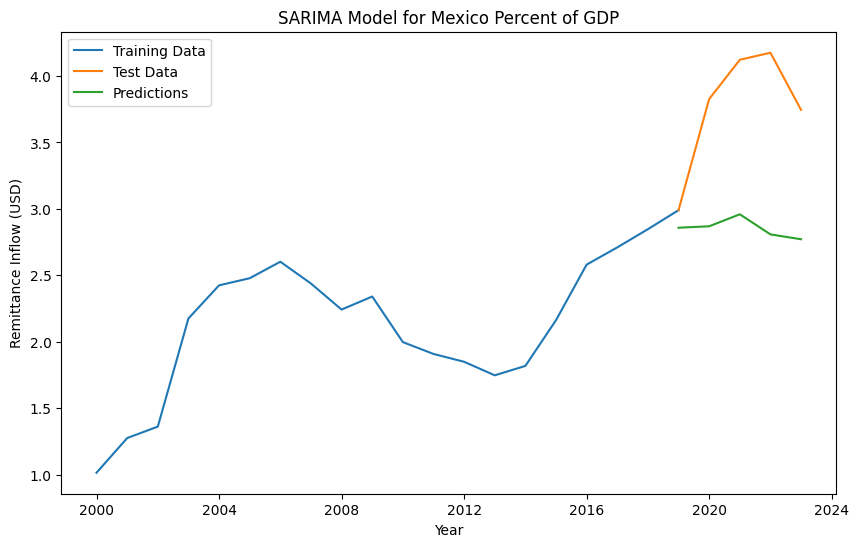

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

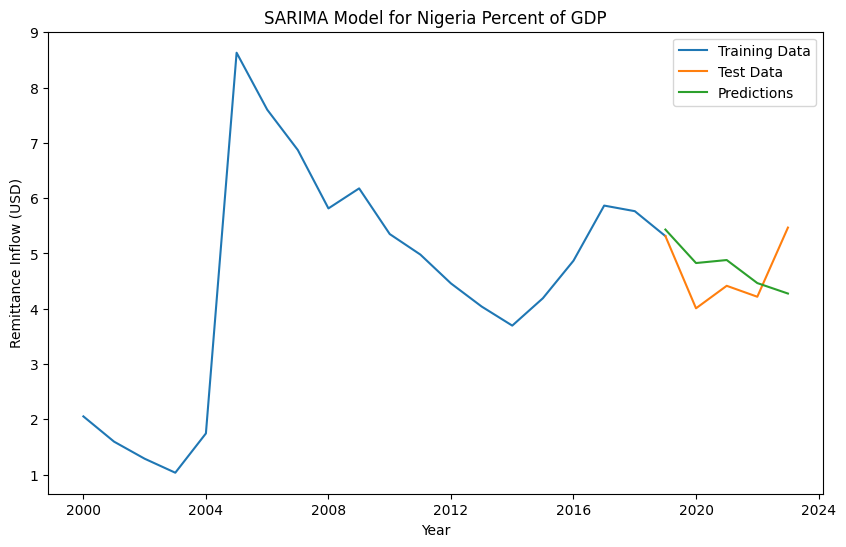

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

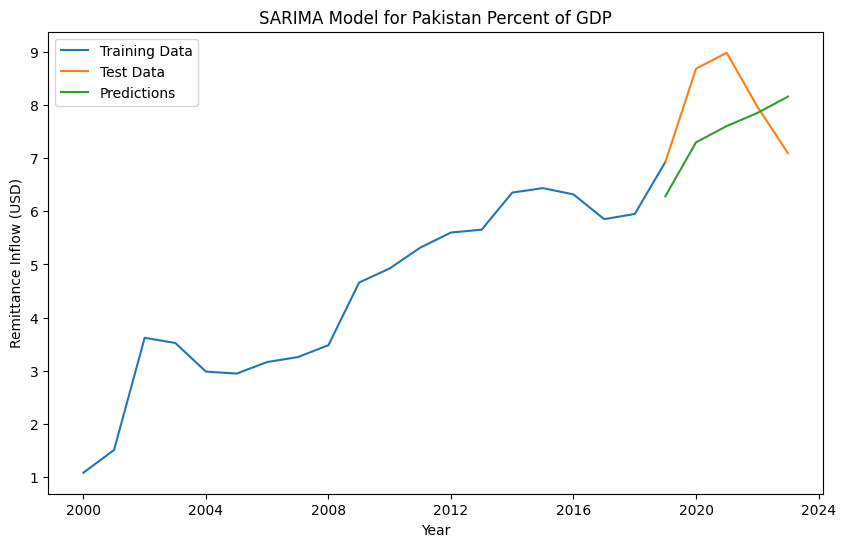

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

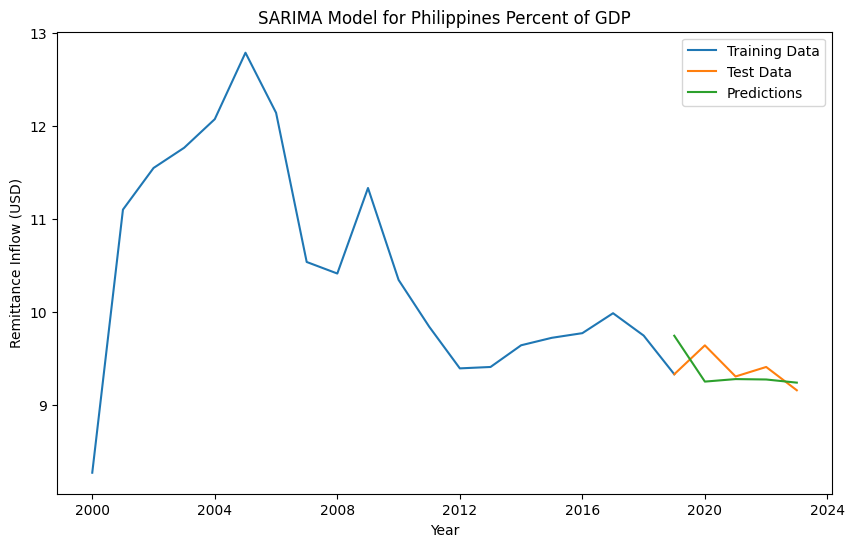

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

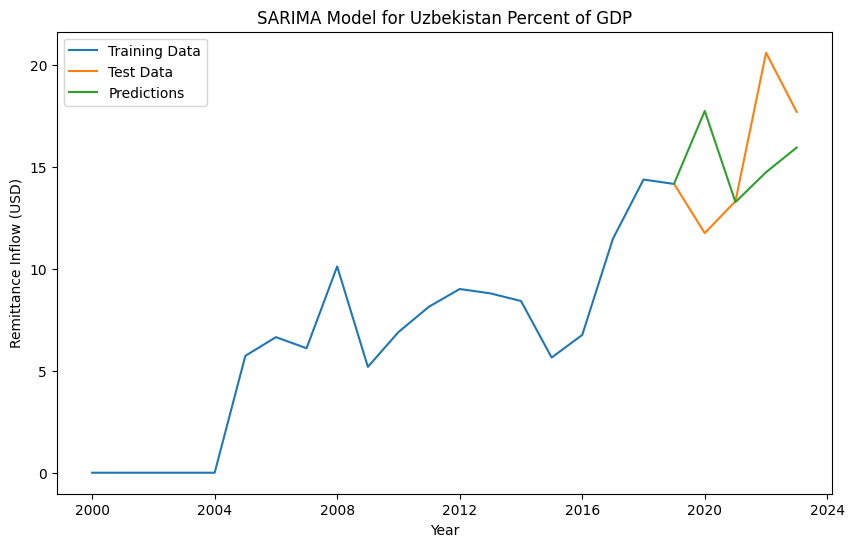

In [ ]:
pred_per_gdp_bangladesh, true_per_gdp_bangladesh = predict_elements(per_gdp_bangladesh, 'Bangladesh', element)
pred_per_gdp_china, true_per_gdp_china = predict_elements(per_gdp_china, 'China', element)
pred_per_gdp_egypt, true_per_gdp_egypt = predict_elements(per_gdp_egypt, 'Egypt', element)
pred_per_gdp_guatemala, true_per_gdp_guatemala = predict_elements(per_gdp_guatemala, 'Guatemala', element)
pred_per_gdp_india, true_per_gdp_india = predict_elements(per_gdp_india, 'India', element)
pred_per_gdp_mexico, true_per_gdp_mexico = predict_elements(per_gdp_mexico, 'Mexico', element)
pred_per_gdp_nigeria, true_per_gdp_nigeria = predict_elements(per_gdp_nigeria, 'Nigeria', element)
pred_per_gdp_pakistan, true_per_gdp_pakistan = predict_elements(per_gdp_pakistan, 'Pakistan', element)
pred_per_gdp_philippines, true_per_gdp_philippines = predict_elements(per_gdp_philippines, 'Philippines', element)
pred_per_gdp_uzbekistan, true_per_gdp_uzbekistan = predict_elements(per_gdp_uzbekistan, 'Uzbekistan', element)

##**Inflation, average consumer prices**

In [ ]:
element = 'Inflation, average consumer prices'

In [ ]:
inf_bangladesh = grouped_data_bangladesh.get_group(element).groupby('Unit')
inf_china = grouped_data_china.get_group(element).groupby('Unit')
inf_egypt = grouped_data_egypt.get_group(element).groupby('Unit')
inf_guatemala = grouped_data_guatemala.get_group(element).groupby('Unit')
inf_india = grouped_data_india.get_group(element).groupby('Unit')
inf_mexico = grouped_data_mexico.get_group(element).groupby('Unit')
inf_nigeria = grouped_data_nigeria.get_group(element).groupby('Unit')
inf_pakistan = grouped_data_pakistan.get_group(element).groupby('Unit')
inf_philippines = grouped_data_philippines.get_group(element).groupby('Unit')
inf_uzbekistan = grouped_data_uzbekistan.get_group(element).groupby('Unit')

In [ ]:
#['Index' 'Percent change']

###**Index**

In [ ]:
sub_element = 'Index'

In [ ]:
inf_bangladesh_idx = inf_bangladesh.get_group(sub_element)
inf_china_idx = inf_china.get_group(sub_element)
inf_egypt_idx = inf_egypt.get_group(sub_element)
inf_guatemala_idx = inf_guatemala.get_group(sub_element)
inf_india_idx = inf_india.get_group(sub_element)
inf_mexico_idx = inf_mexico.get_group(sub_element)
inf_nigeria_idx = inf_nigeria.get_group(sub_element)
inf_pakistan_idx = inf_pakistan.get_group(sub_element)
inf_philippines_idx = inf_philippines.get_group(sub_element)
inf_uzbekistan_idx = inf_uzbekistan.get_group(sub_element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

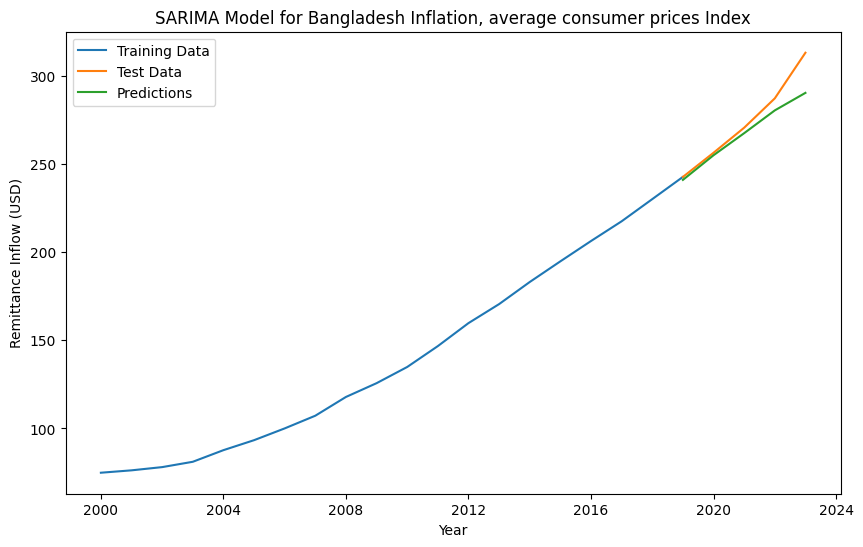

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

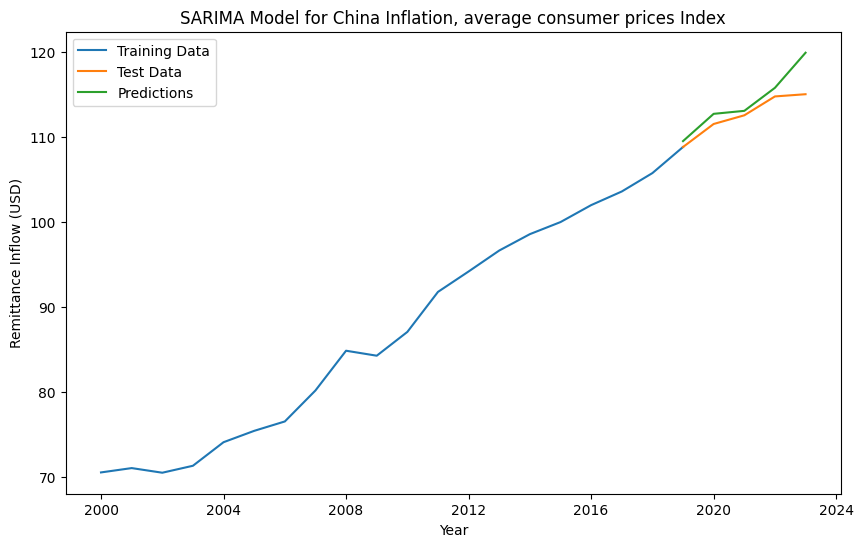

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

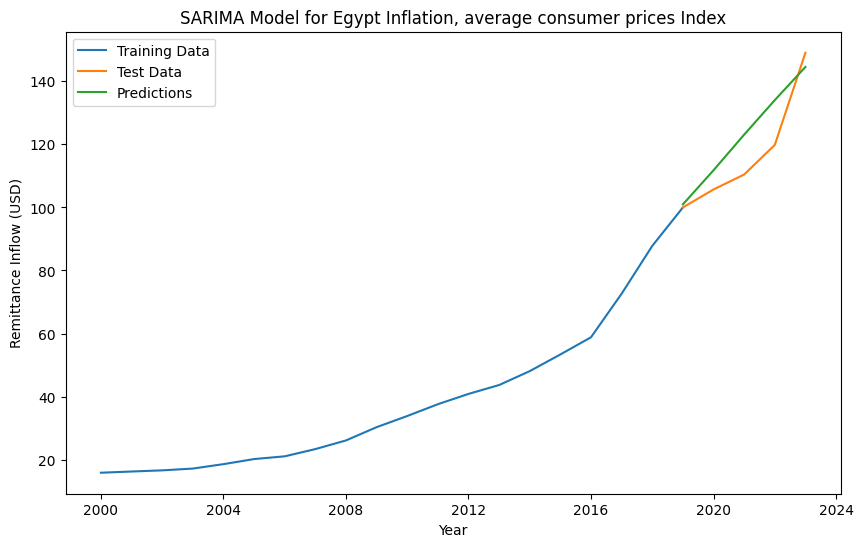

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

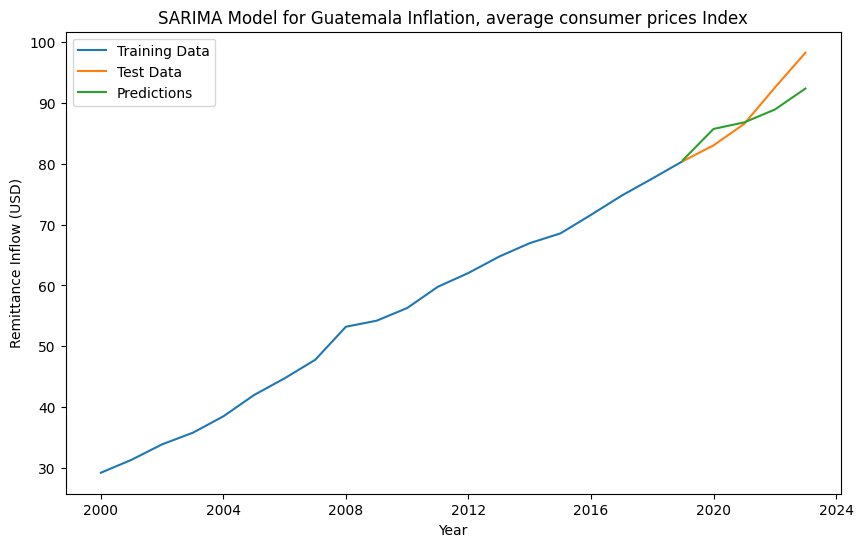

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

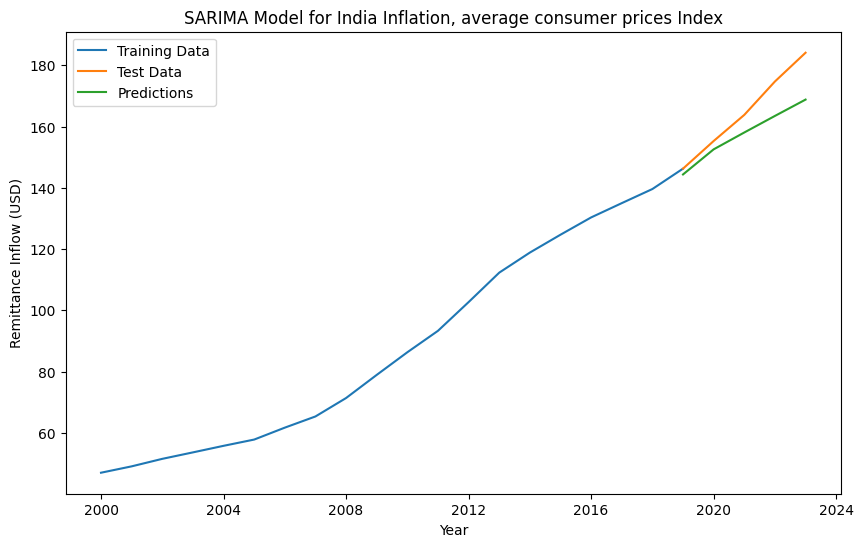

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

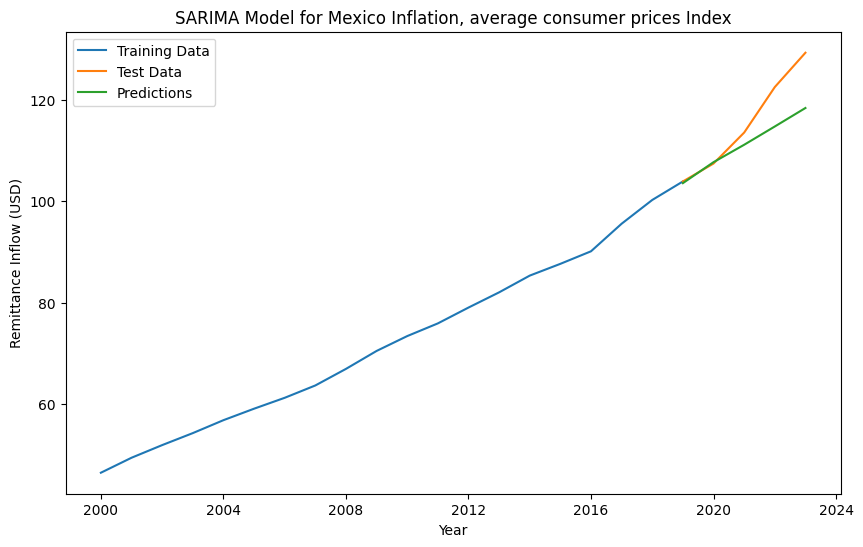

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

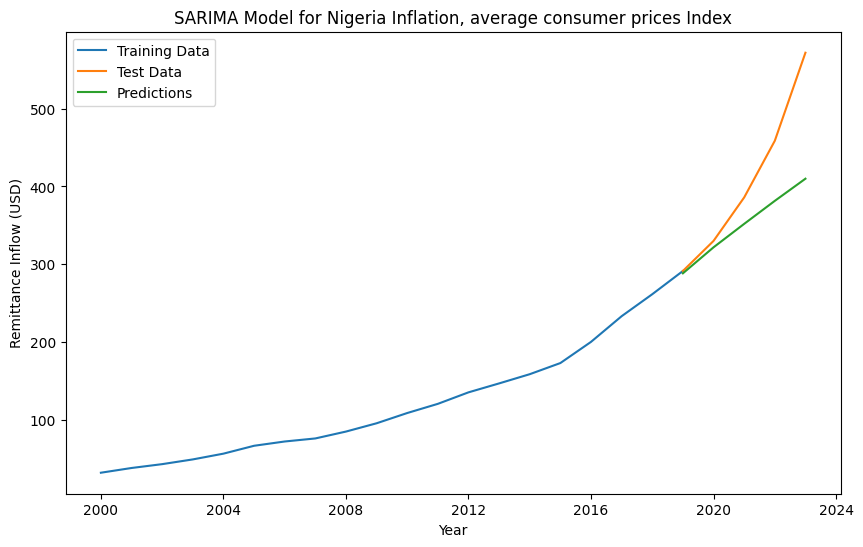

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

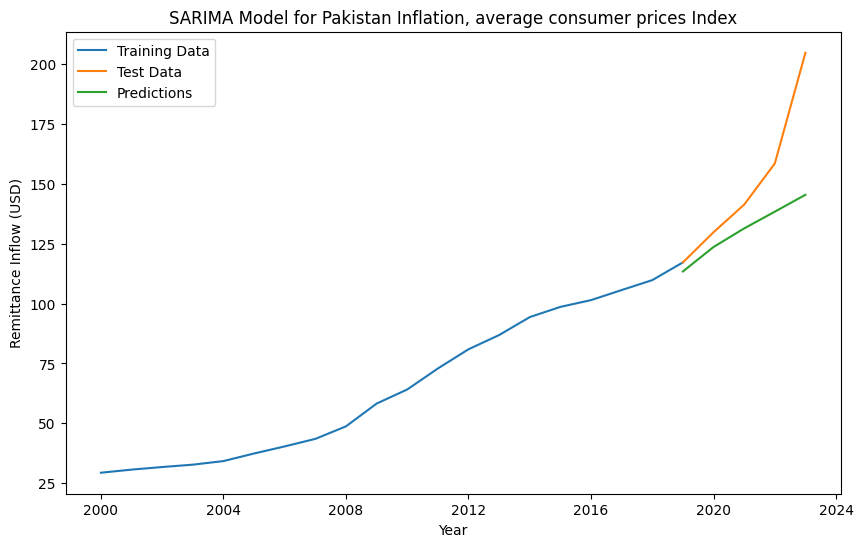

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

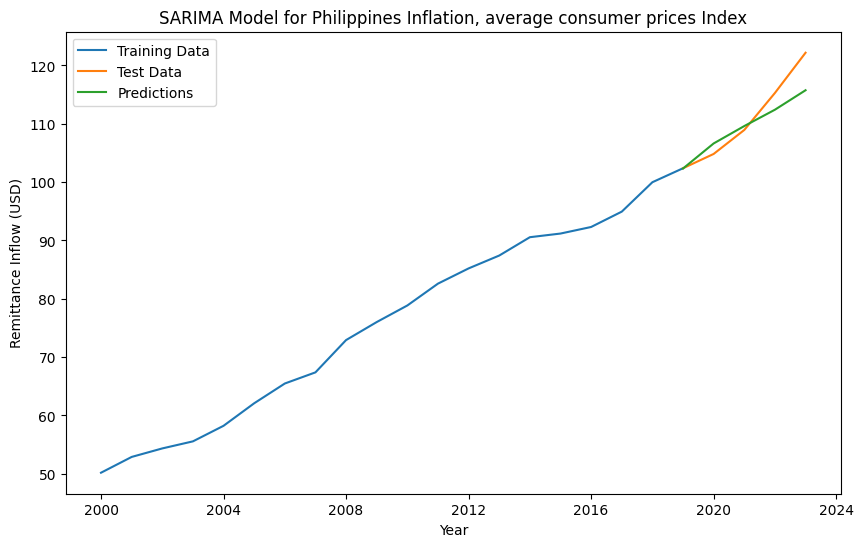

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

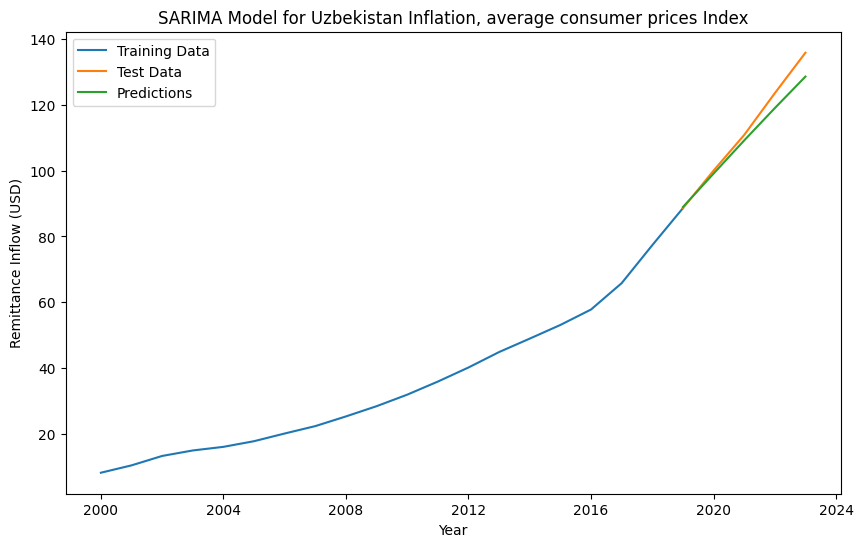

In [ ]:
pred_inf_bangladesh_idx, true_inf_bangladesh_idx = predict_elements(inf_bangladesh_idx, 'Bangladesh', element+' '+sub_element)
pred_inf_china_idx, true_inf_china_idx = predict_elements(inf_china_idx, 'China', element+' '+sub_element)
pred_inf_egypt_idx, true_inf_egypt_idx = predict_elements(inf_egypt_idx, 'Egypt', element+' '+sub_element)
pred_inf_guatemala_idx, true_inf_guatemala_idx = predict_elements(inf_guatemala_idx, 'Guatemala', element+' '+sub_element)
pred_inf_india_idx, true_inf_india_idx = predict_elements(inf_india_idx, 'India', element+' '+sub_element)
pred_inf_mexico_idx, true_inf_mexico_idx = predict_elements(inf_mexico_idx, 'Mexico', element+' '+sub_element)
pred_inf_nigeria_idx, true_inf_nigeria_idx = predict_elements(inf_nigeria_idx, 'Nigeria', element+' '+sub_element)
pred_inf_pakistan_idx, true_inf_pakistan_idx = predict_elements(inf_pakistan_idx, 'Pakistan', element+' '+sub_element)
pred_inf_philippines_idx, true_inf_philippines_idx = predict_elements(inf_philippines_idx, 'Philippines', element+' '+sub_element)
pred_inf_uzbekistan_idx, true_inf_uzbekistan_idx = predict_elements(inf_uzbekistan_idx, 'Uzbekistan', element+' '+sub_element)

###**Percent change**

In [ ]:
sub_element = 'Percent change'

In [ ]:
inf_bangladesh_chg = inf_bangladesh.get_group(sub_element)
inf_china_chg = inf_china.get_group(sub_element)
inf_egypt_chg = inf_egypt.get_group(sub_element)
inf_guatemala_chg = inf_guatemala.get_group(sub_element)
inf_india_chg = inf_india.get_group(sub_element)
inf_mexico_chg = inf_mexico.get_group(sub_element)
inf_nigeria_chg = inf_nigeria.get_group(sub_element)
inf_pakistan_chg = inf_pakistan.get_group(sub_element)
inf_philippines_chg = inf_philippines.get_group(sub_element)
inf_uzbekistan_chg = inf_uzbekistan.get_group(sub_element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

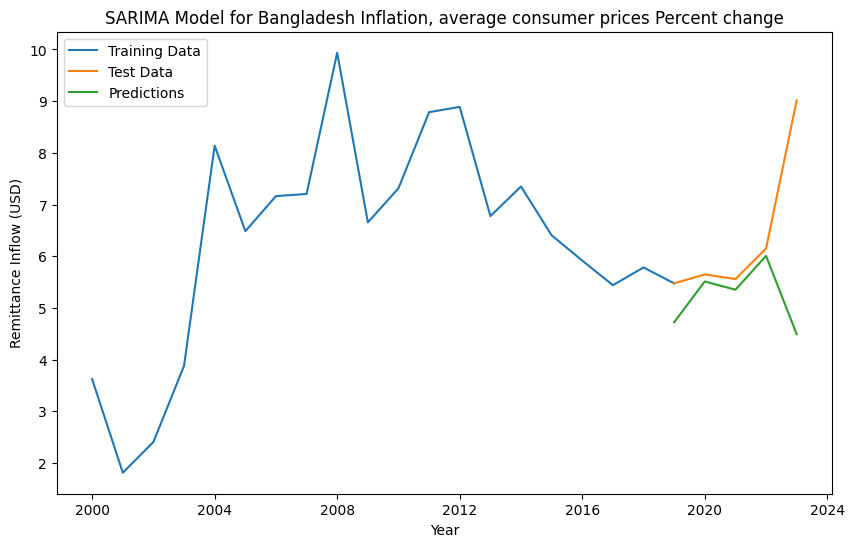

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

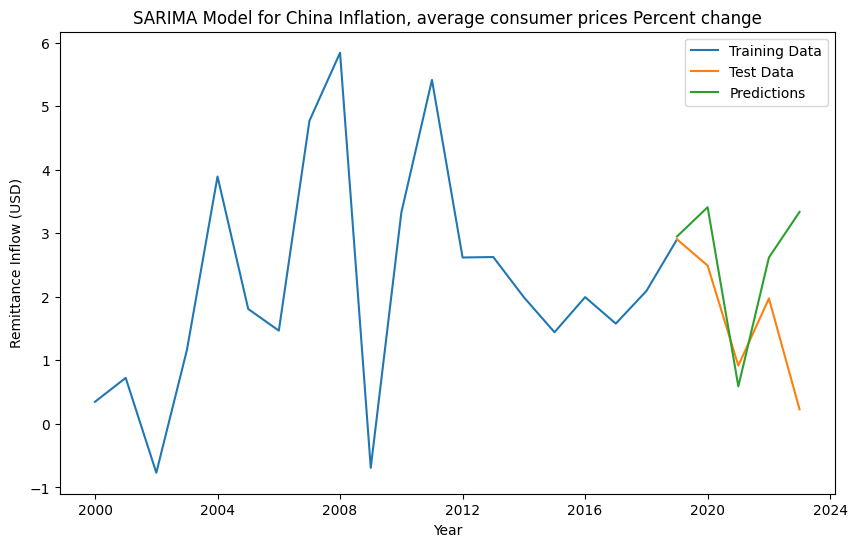

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

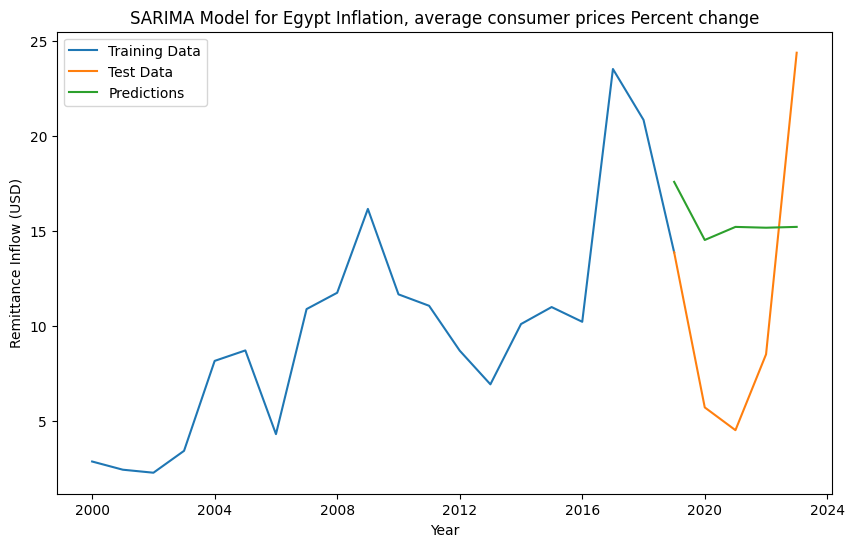

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

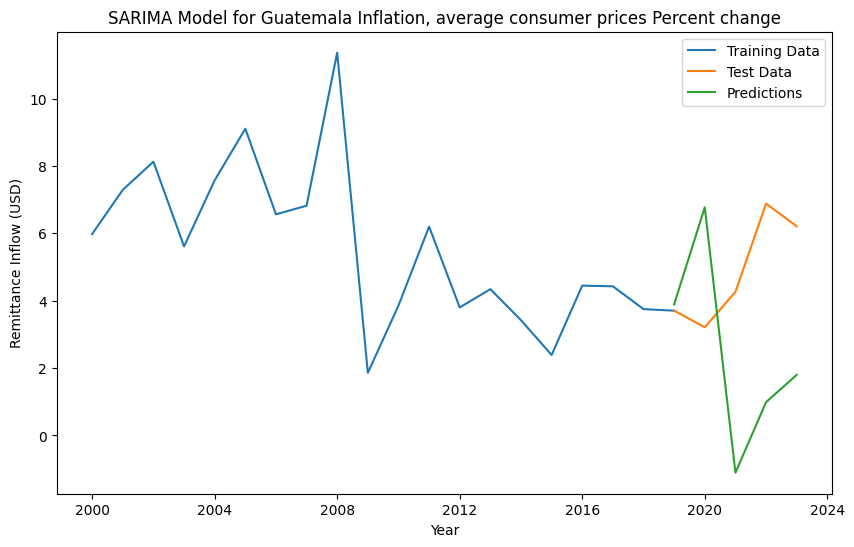

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

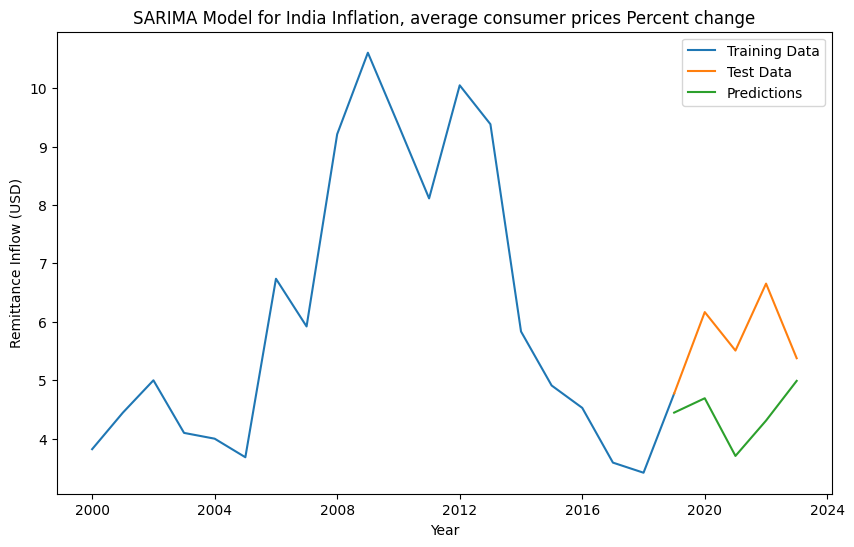

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

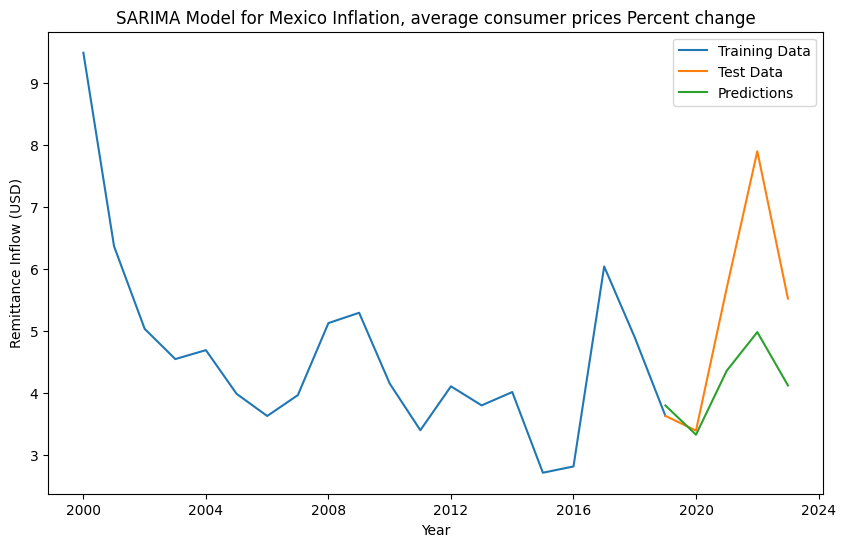

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

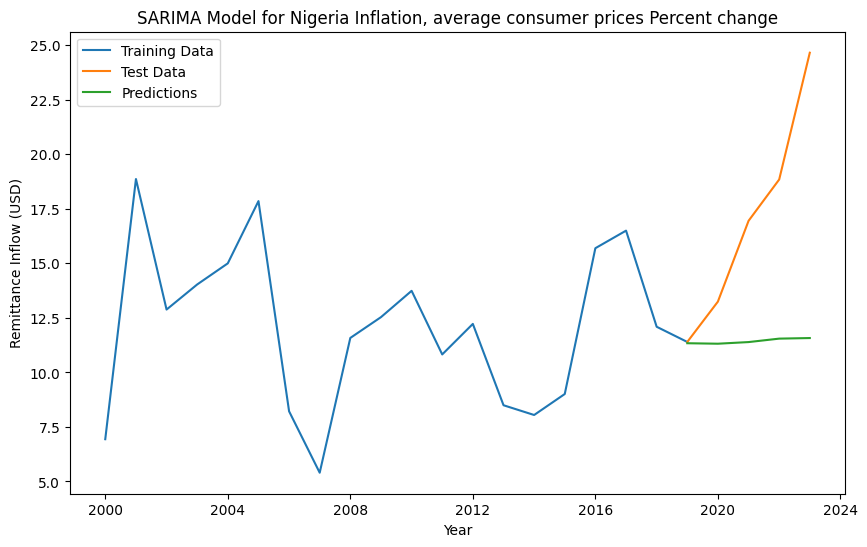

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

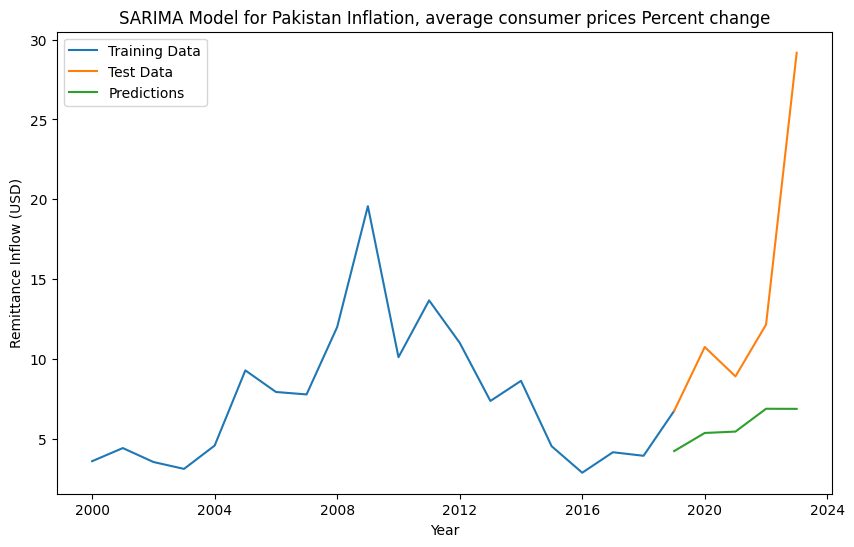

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

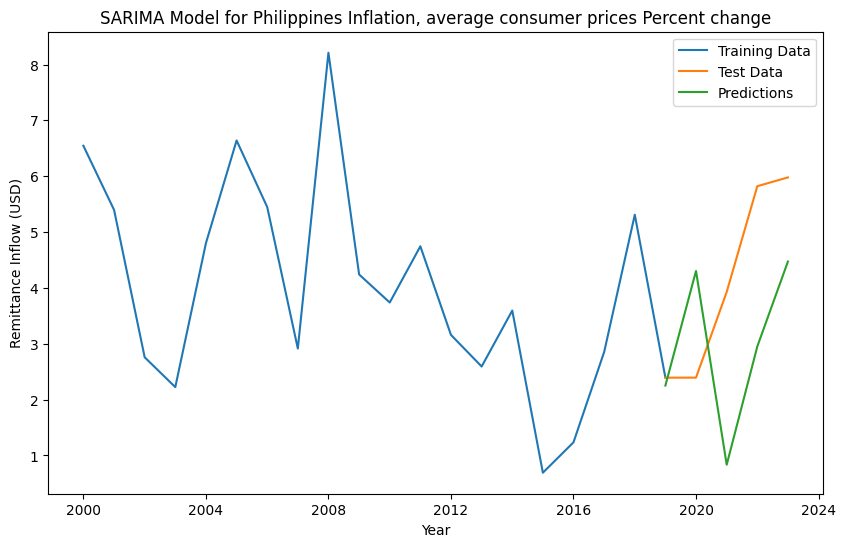

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

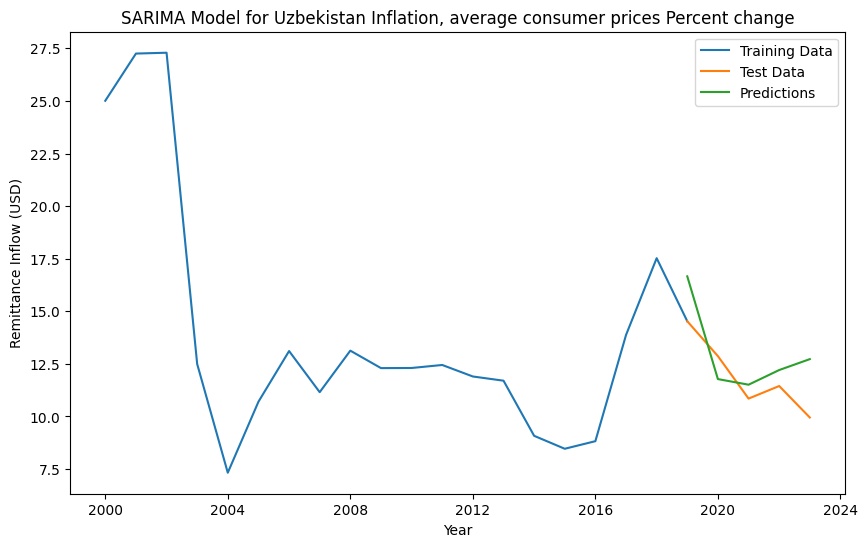

In [ ]:
pred_inf_bangladesh_chg, true_inf_bangladesh_chg = predict_elements(inf_bangladesh_chg, 'Bangladesh', element+' '+sub_element)
pred_inf_china_chg, true_inf_china_chg = predict_elements(inf_china_chg, 'China', element+' '+sub_element)
pred_inf_egypt_chg, true_inf_egypt_chg = predict_elements(inf_egypt_chg, 'Egypt', element+' '+sub_element)
pred_inf_guatemala_chg, true_inf_guatemala_chg = predict_elements(inf_guatemala_chg, 'Guatemala', element+' '+sub_element)
pred_inf_india_chg, true_inf_india_chg = predict_elements(inf_india_chg, 'India', element+' '+sub_element)
pred_inf_mexico_chg, true_inf_mexico_chg = predict_elements(inf_mexico_chg, 'Mexico', element+' '+sub_element)
pred_inf_nigeria_chg, true_inf_nigeria_chg = predict_elements(inf_nigeria_chg, 'Nigeria', element+' '+sub_element)
pred_inf_pakistan_chg, true_inf_pakistan_chg = predict_elements(inf_pakistan_chg, 'Pakistan', element+' '+sub_element)
pred_inf_philippines_chg, true_inf_philippines_chg = predict_elements(inf_philippines_chg, 'Philippines', element+' '+sub_element)
pred_inf_uzbekistan_chg, true_inf_uzbekistan_chg = predict_elements(inf_uzbekistan_chg, 'Uzbekistan', element+' '+sub_element)

##**Human Development Index**

In [ ]:
element = 'Human Development Index'

In [ ]:
hdi_bangladesh = grouped_data_bangladesh.get_group(element)
hdi_china = grouped_data_china.get_group(element)
hdi_egypt = grouped_data_egypt.get_group(element)
hdi_guatemala = grouped_data_guatemala.get_group(element)
hdi_india = grouped_data_india.get_group(element)
hdi_mexico = grouped_data_mexico.get_group(element)
hdi_nigeria = grouped_data_nigeria.get_group(element)
hdi_pakistan = grouped_data_pakistan.get_group(element)
hdi_philippines = grouped_data_philippines.get_group(element)
hdi_uzbekistan = grouped_data_uzbekistan.get_group(element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

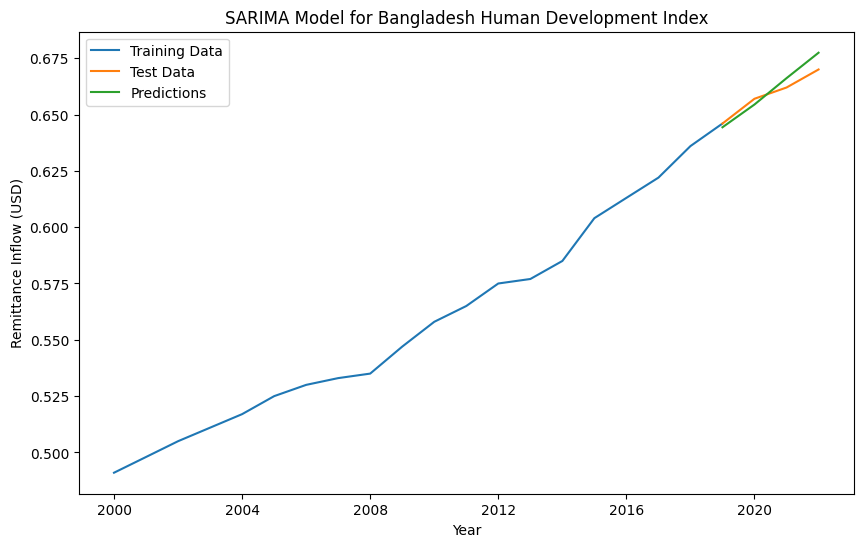

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

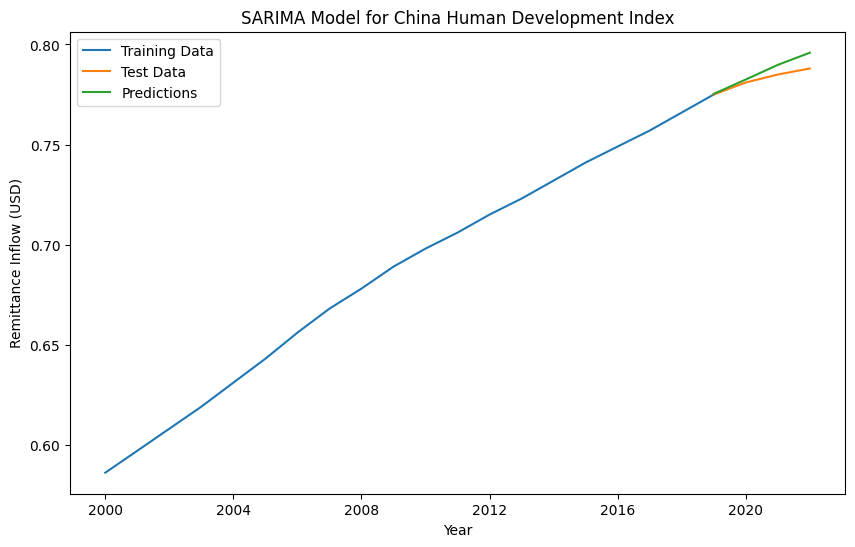

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

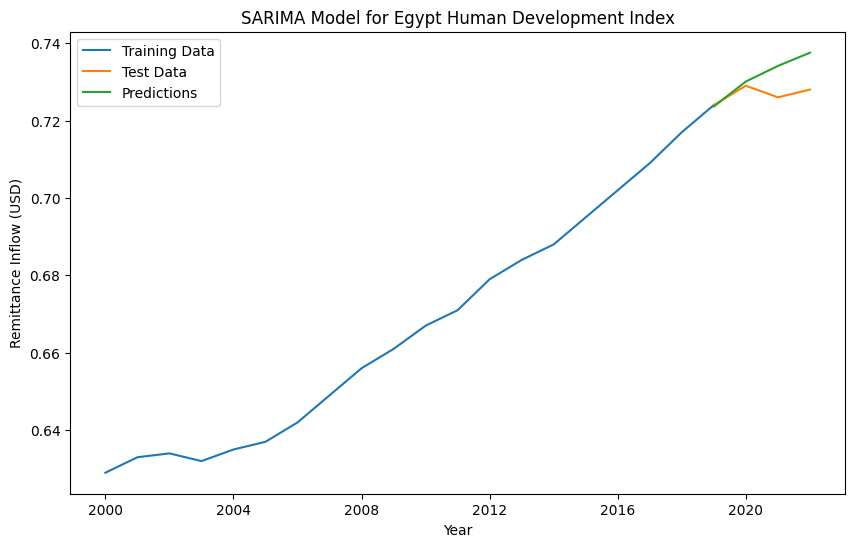

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

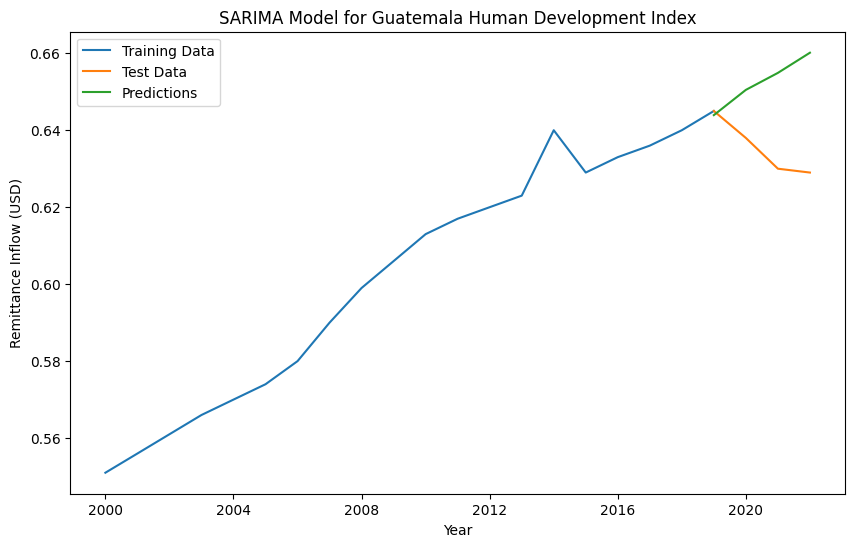

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

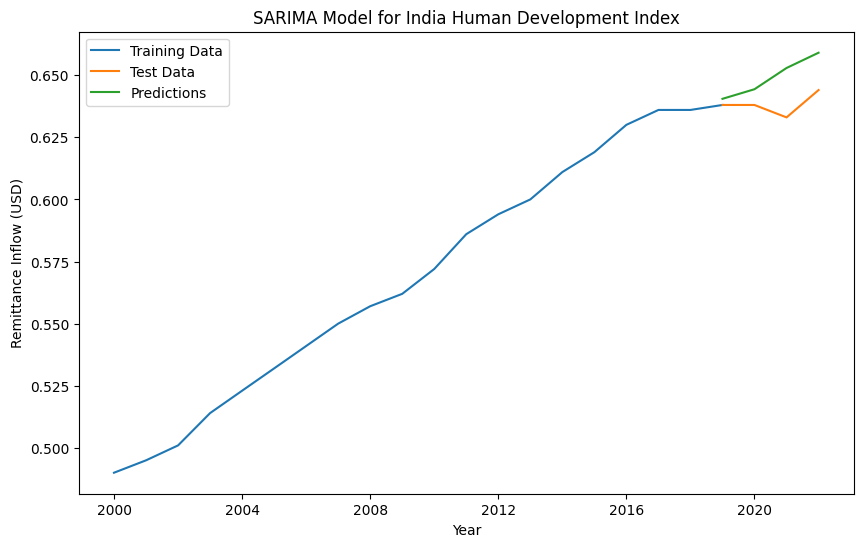

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

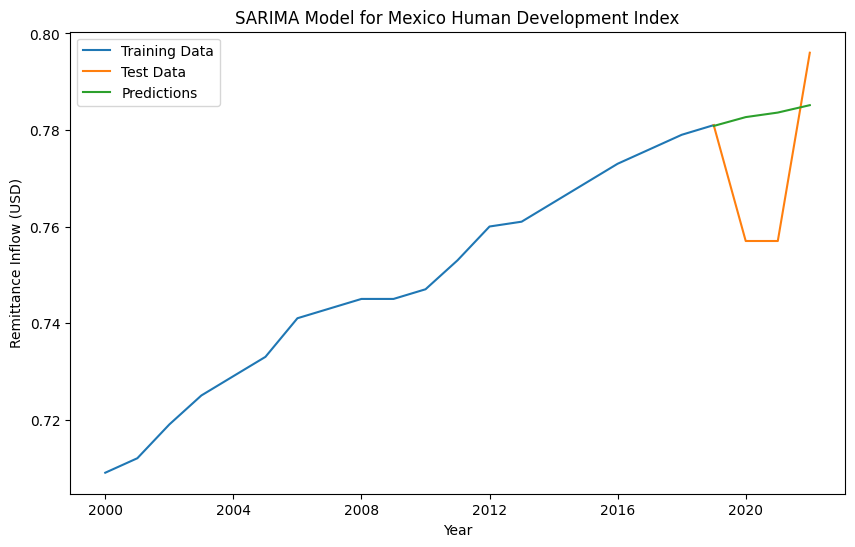

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

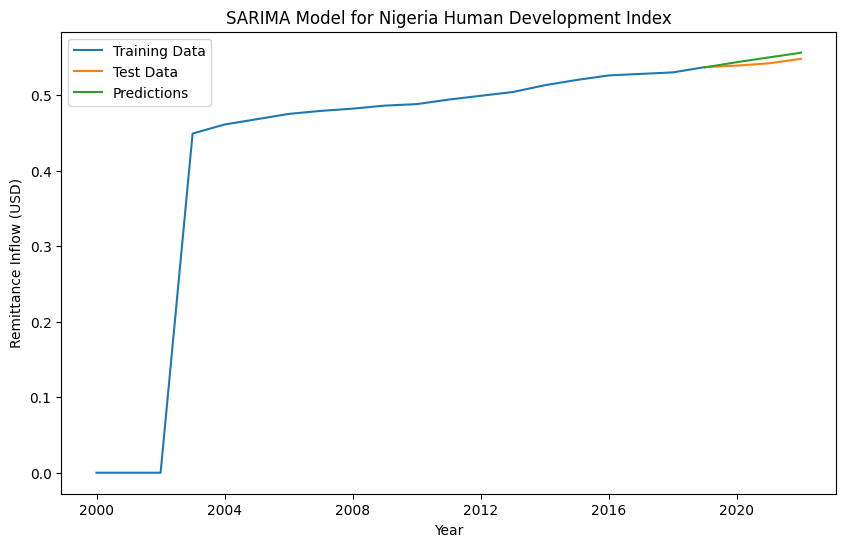

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

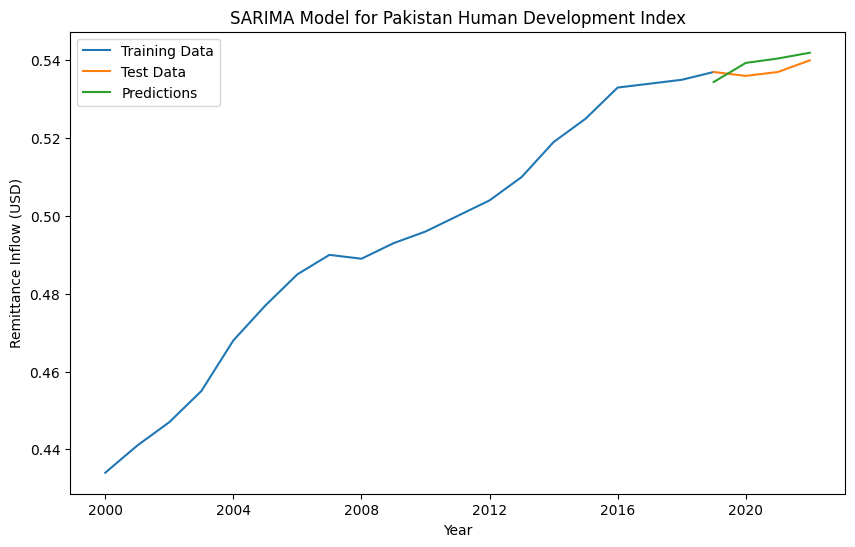

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

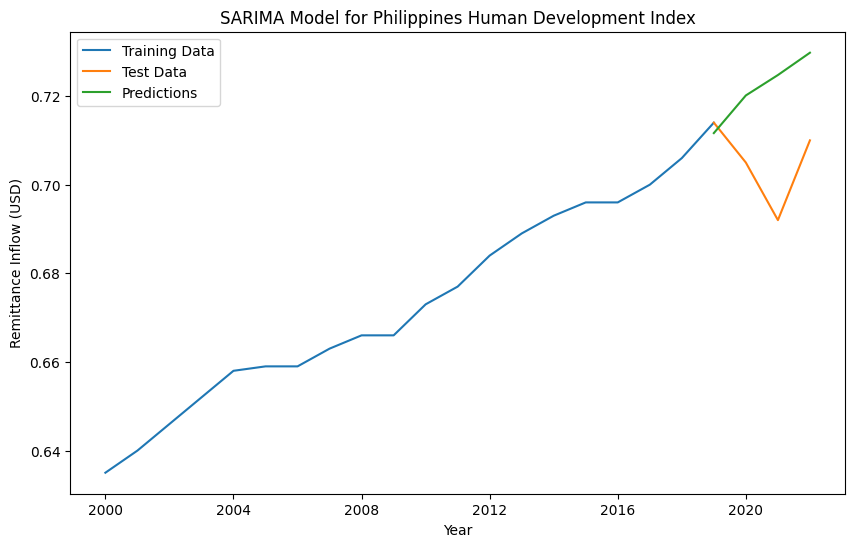

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

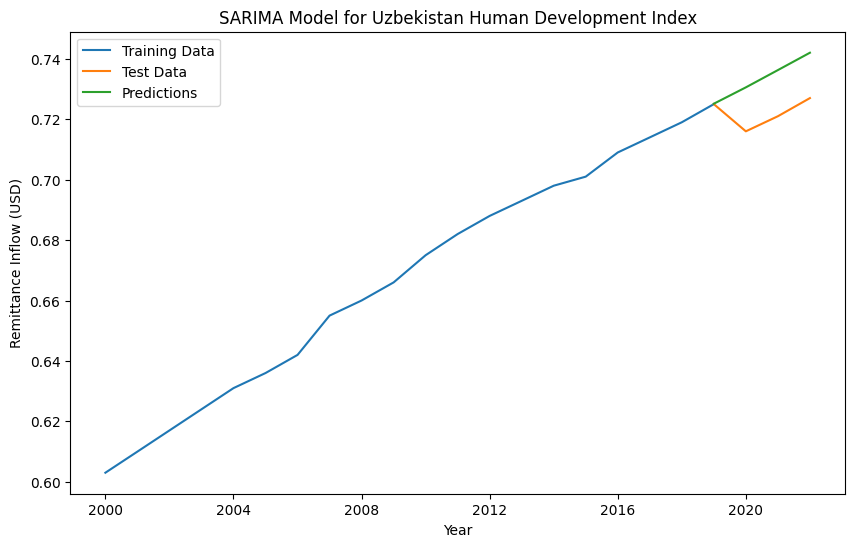

In [ ]:
pred_hdi_bangladesh, true_hdi_bangladesh = predict_elements(hdi_bangladesh, 'Bangladesh', element)
pred_hdi_china, true_hdi_china = predict_elements(hdi_china, 'China', element)
pred_hdi_egypt, true_hdi_egypt = predict_elements(hdi_egypt, 'Egypt', element)
pred_hdi_guatemala, true_hdi_guatemala = predict_elements(hdi_guatemala, 'Guatemala', element)
pred_hdi_india, true_hdi_india = predict_elements(hdi_india, 'India', element)
pred_hdi_mexico, true_hdi_mexico = predict_elements(hdi_mexico, 'Mexico', element)
pred_hdi_nigeria, true_hdi_nigeria = predict_elements(hdi_nigeria, 'Nigeria', element)
pred_hdi_pakistan, true_hdi_pakistan = predict_elements(hdi_pakistan, 'Pakistan', element)
pred_hdi_philippines, true_hdi_philippines = predict_elements(hdi_philippines, 'Philippines', element)
pred_hdi_uzbekistan, true_hdi_uzbekistan = predict_elements(hdi_uzbekistan, 'Uzbekistan', element)

##**Households and NPISHs Final consumption expenditure**

In [ ]:
element = 'Households and NPISHs Final consumption expenditure'

In [ ]:
exp_bangladesh = grouped_data_bangladesh.get_group(element)
exp_china = grouped_data_china.get_group(element)
exp_egypt = grouped_data_egypt.get_group(element)
exp_guatemala = grouped_data_guatemala.get_group(element)
exp_india = grouped_data_india.get_group(element)
exp_mexico = grouped_data_mexico.get_group(element)
exp_nigeria = grouped_data_nigeria.get_group(element)
exp_pakistan = grouped_data_pakistan.get_group(element)
exp_philippines = grouped_data_philippines.get_group(element)
exp_uzbekistan = grouped_data_uzbekistan.get_group(element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

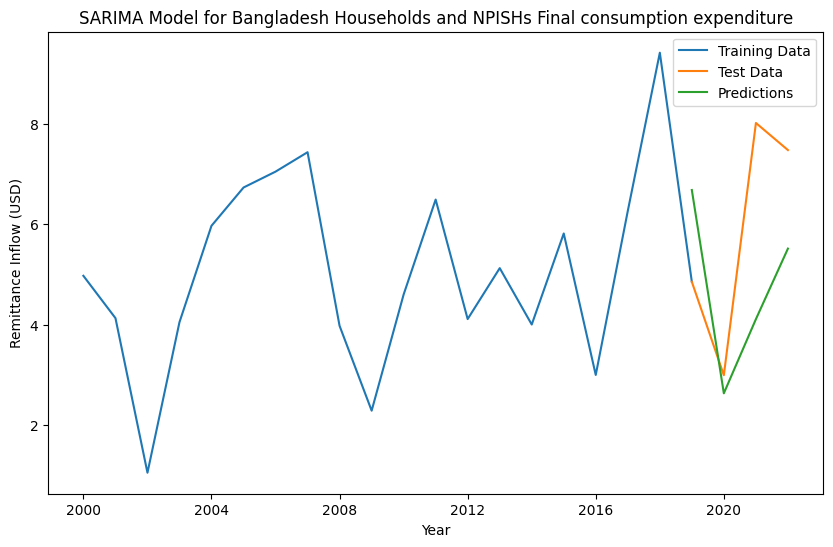

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

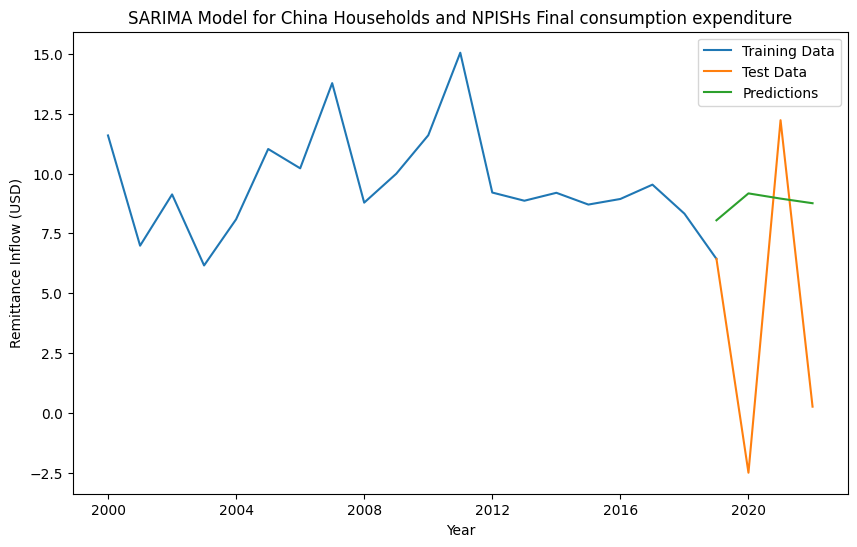

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

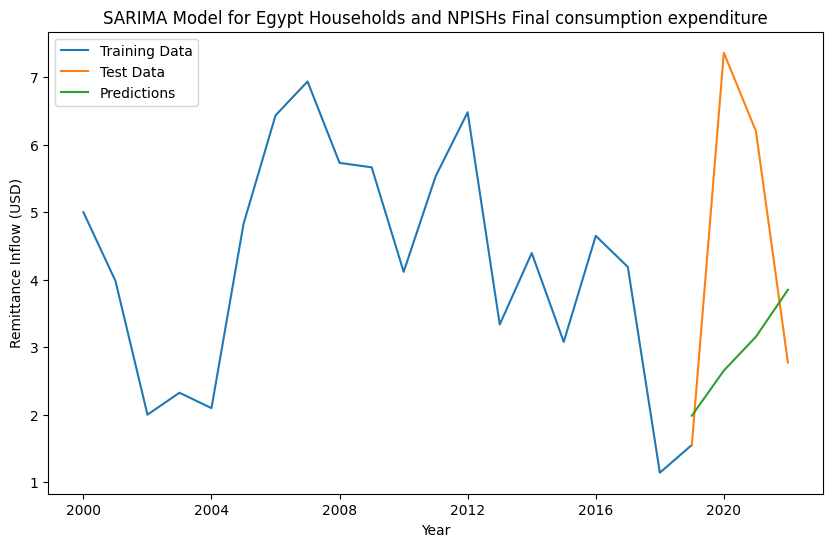

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

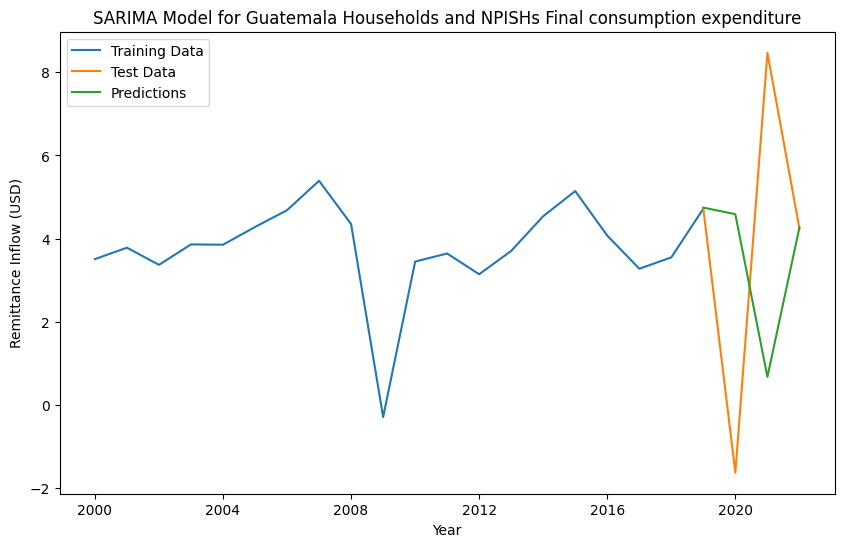

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

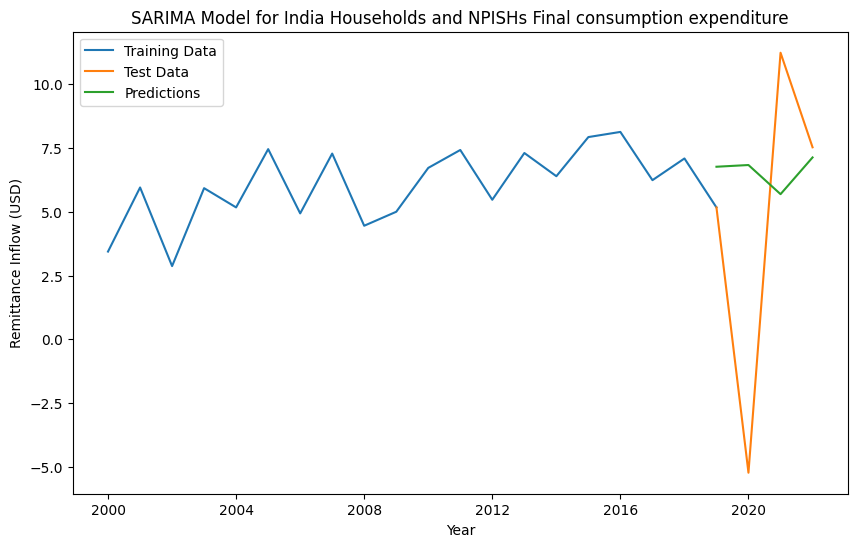

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

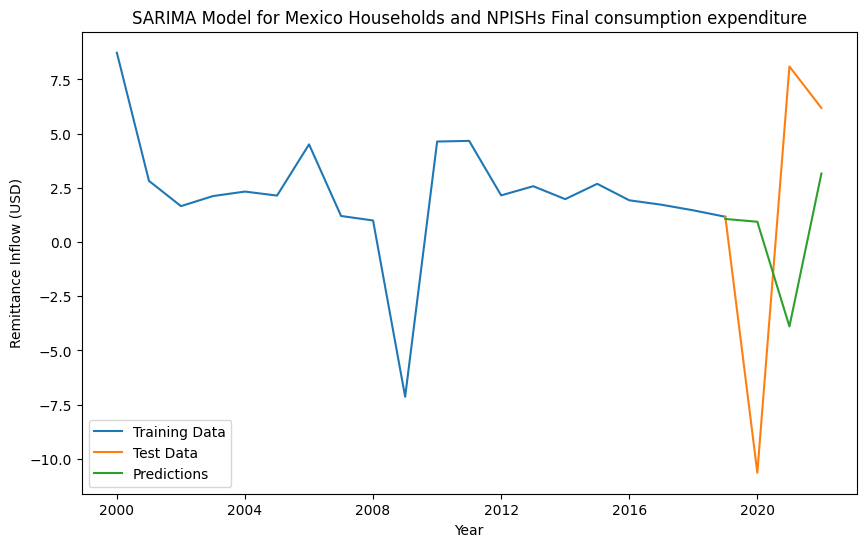

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

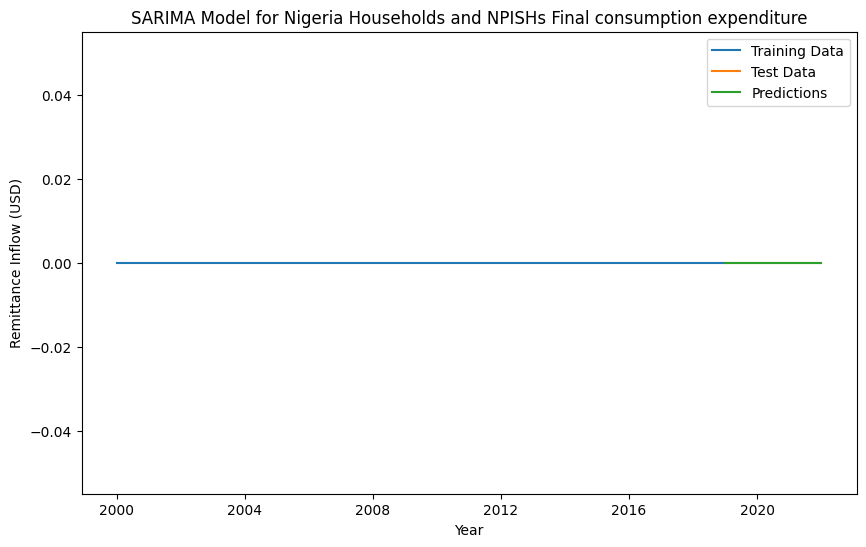

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

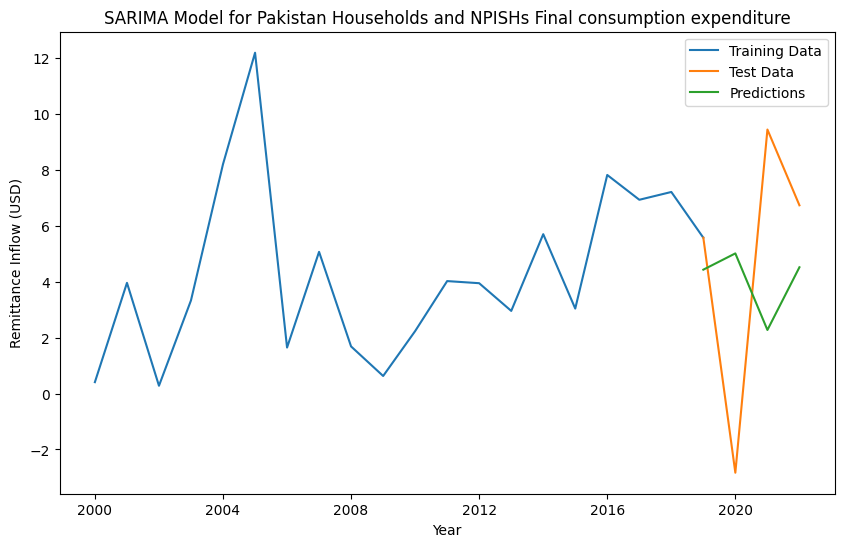

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

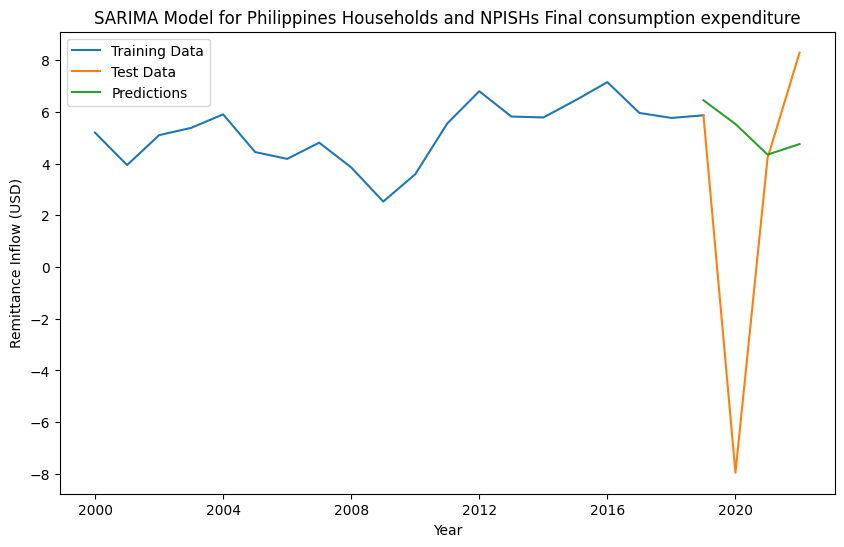

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

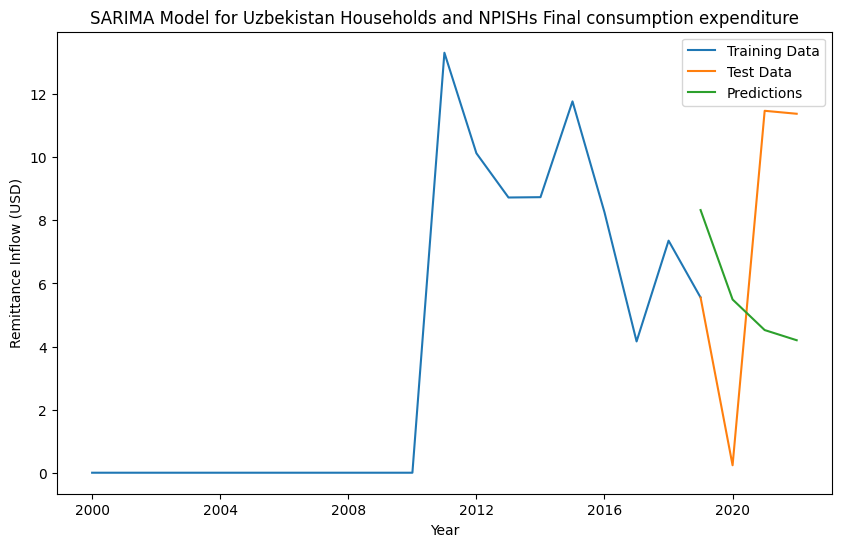

In [ ]:
pred_exp_bangladesh, true_exp_bangladesh = predict_elements(exp_bangladesh, 'Bangladesh', element)
pred_exp_china, true_exp_china = predict_elements(exp_china, 'China', element)
pred_exp_egypt, true_exp_egypt = predict_elements(exp_egypt, 'Egypt', element)
pred_exp_guatemala, true_exp_guatemala = predict_elements(exp_guatemala, 'Guatemala', element)
pred_exp_india, true_exp_india = predict_elements(exp_india, 'India', element)
pred_exp_mexico, true_exp_mexico = predict_elements(exp_mexico, 'Mexico', element)
pred_exp_nigeria, true_exp_nigeria = predict_elements(exp_nigeria, 'Nigeria', element)
pred_exp_pakistan, true_exp_pakistan = predict_elements(exp_pakistan, 'Pakistan', element)
pred_exp_philippines, true_exp_philippines = predict_elements(exp_philippines, 'Philippines', element)
pred_exp_uzbekistan, true_exp_uzbekistan = predict_elements(exp_uzbekistan, 'Uzbekistan', element)

##**Multidimensional poverty headcount ratio (World Bank)**

In [ ]:
element = 'Multidimensional poverty headcount ratio (World Bank)'

In [ ]:
pov_bangladesh = grouped_data_bangladesh.get_group(element)
pov_china = grouped_data_china.get_group(element)
pov_egypt = grouped_data_egypt.get_group(element)
pov_guatemala = grouped_data_guatemala.get_group(element)
pov_india = grouped_data_india.get_group(element)
pov_mexico = grouped_data_mexico.get_group(element)
pov_nigeria = grouped_data_nigeria.get_group(element)
pov_pakistan = grouped_data_pakistan.get_group(element)
pov_philippines = grouped_data_philippines.get_group(element)
pov_uzbekistan = grouped_data_uzbekistan.get_group(element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

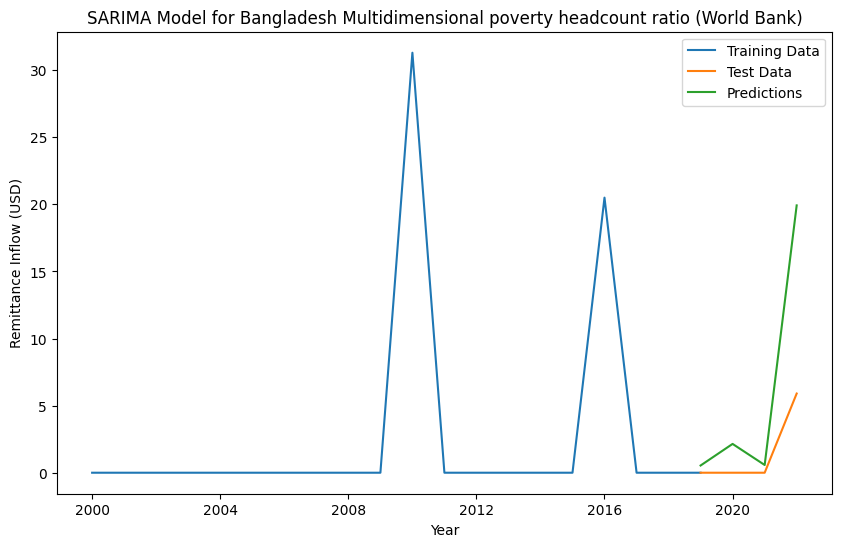

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

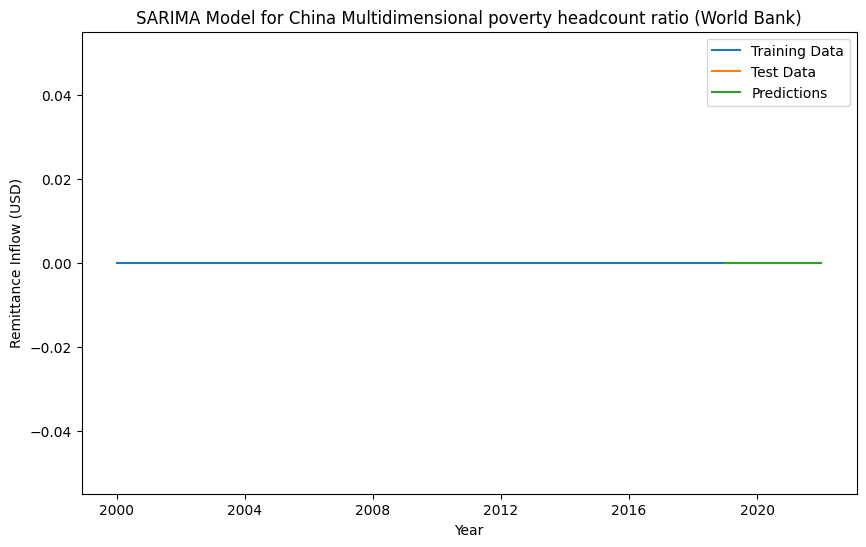

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

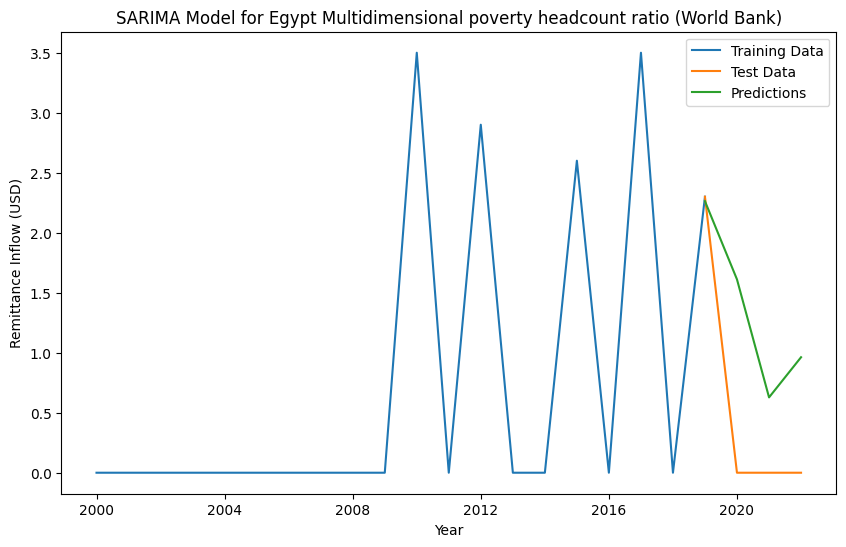

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

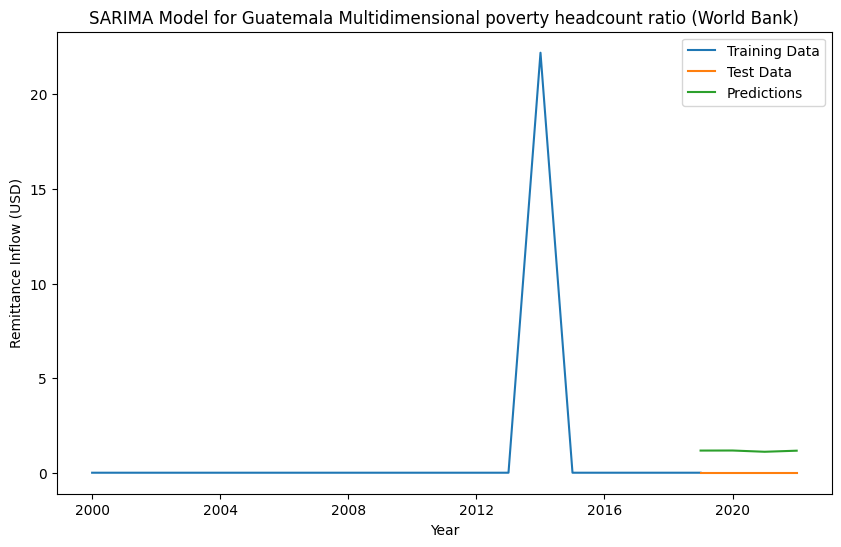

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

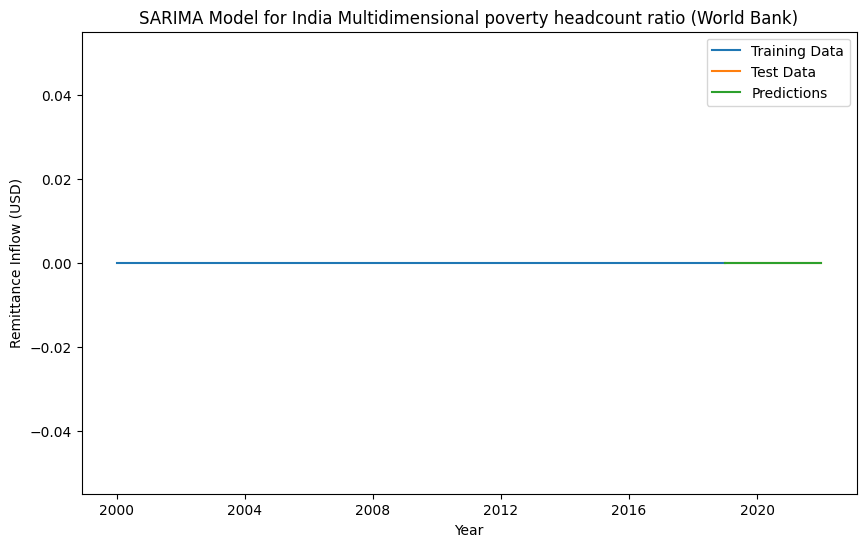

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

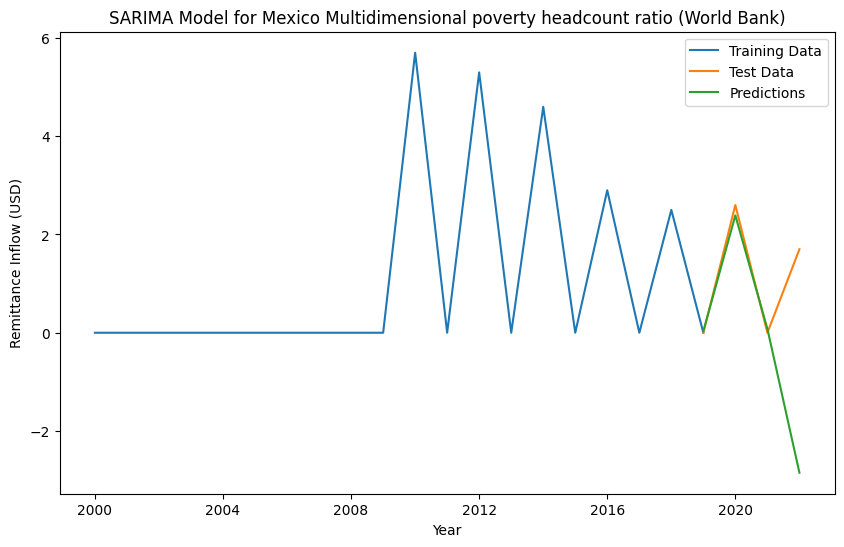

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

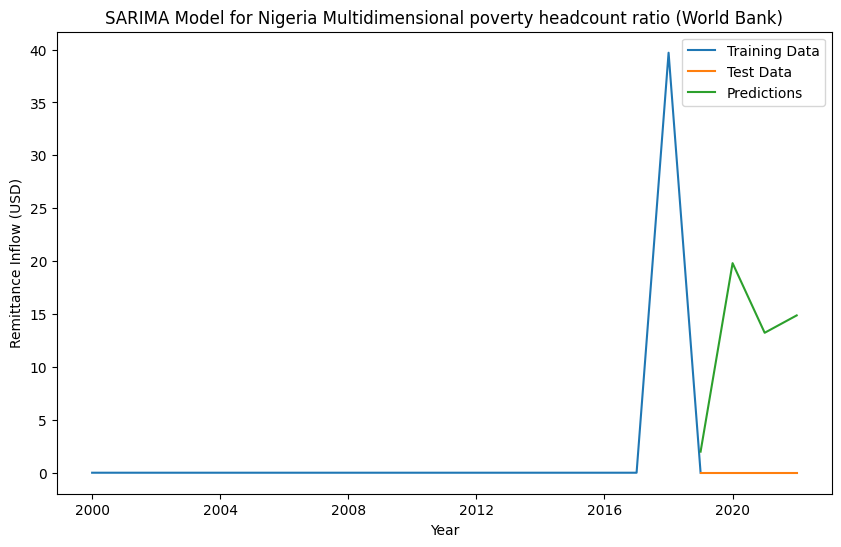

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

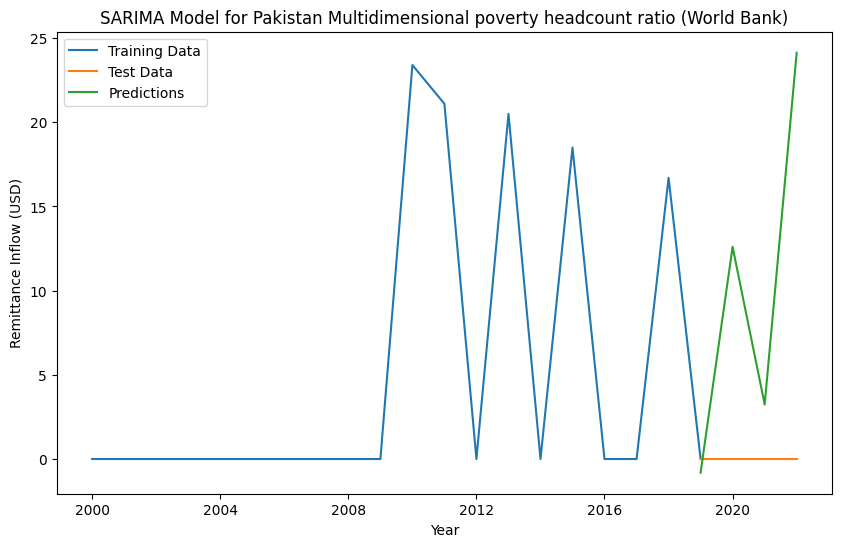

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

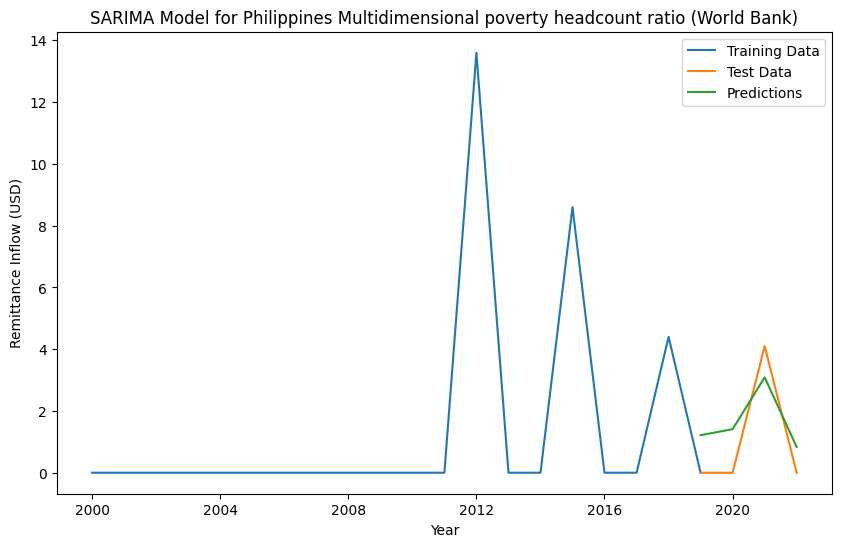

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

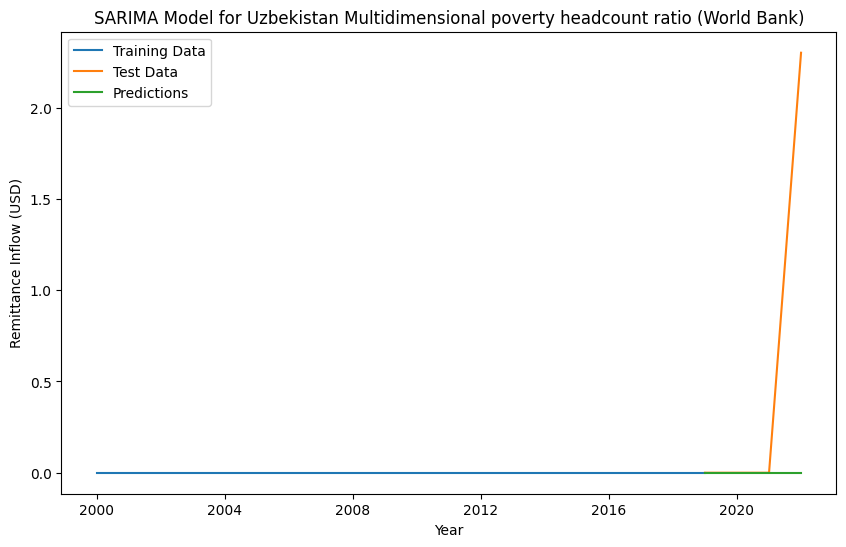

In [ ]:
pred_pov_bangladesh, true_pov_bangladesh = predict_elements(pov_bangladesh, 'Bangladesh', element)
pred_pov_china, true_pov_china = predict_elements(pov_china, 'China', element)
pred_pov_egypt, true_pov_egypt = predict_elements(pov_egypt, 'Egypt', element)
pred_pov_guatemala, true_pov_guatemala = predict_elements(pov_guatemala, 'Guatemala', element)
pred_pov_india, true_pov_india = predict_elements(pov_india, 'India', element)
pred_pov_mexico, true_pov_mexico = predict_elements(pov_mexico, 'Mexico', element)
pred_pov_nigeria, true_pov_nigeria = predict_elements(pov_nigeria, 'Nigeria', element)
pred_pov_pakistan, true_pov_pakistan = predict_elements(pov_pakistan, 'Pakistan', element)
pred_pov_philippines, true_pov_philippines = predict_elements(pov_philippines, 'Philippines', element)
pred_pov_uzbekistan, true_pov_uzbekistan = predict_elements(pov_uzbekistan, 'Uzbekistan', element)

##**Unemployment rate**

In [ ]:
element = 'Unemployment rate'

In [ ]:
une_bangladesh = grouped_data_bangladesh.get_group(element)
une_china = grouped_data_china.get_group(element)
une_egypt = grouped_data_egypt.get_group(element)
une_guatemala = grouped_data_guatemala.get_group(element)
une_india = grouped_data_india.get_group(element)
une_mexico = grouped_data_mexico.get_group(element)
une_nigeria = grouped_data_nigeria.get_group(element)
une_pakistan = grouped_data_pakistan.get_group(element)
une_philippines = grouped_data_philippines.get_group(element)
une_uzbekistan = grouped_data_uzbekistan.get_group(element)

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

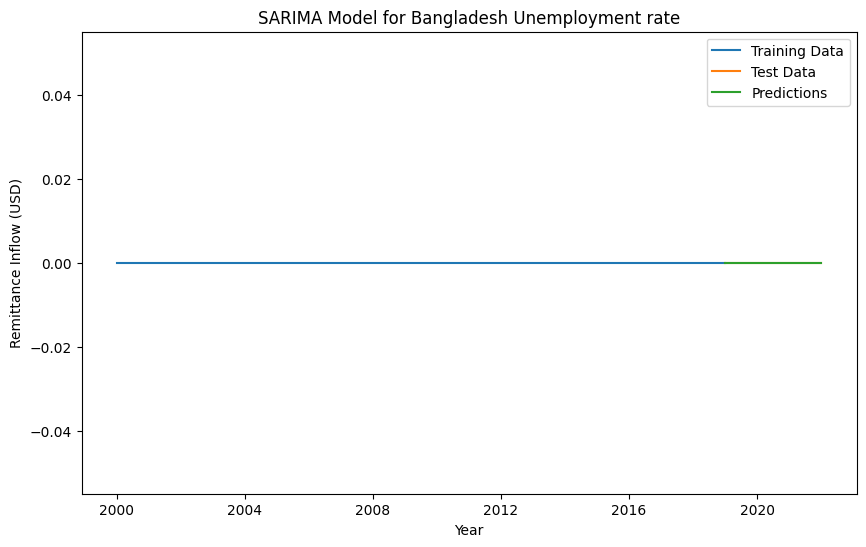

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

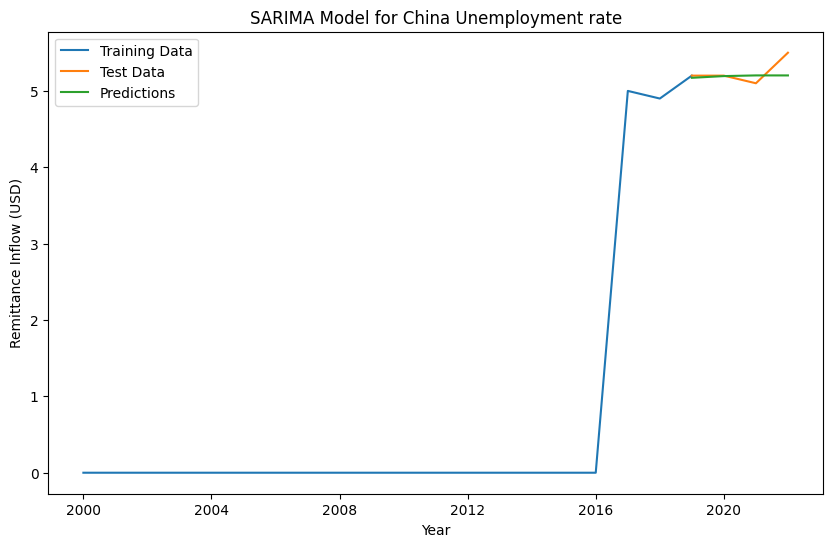

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

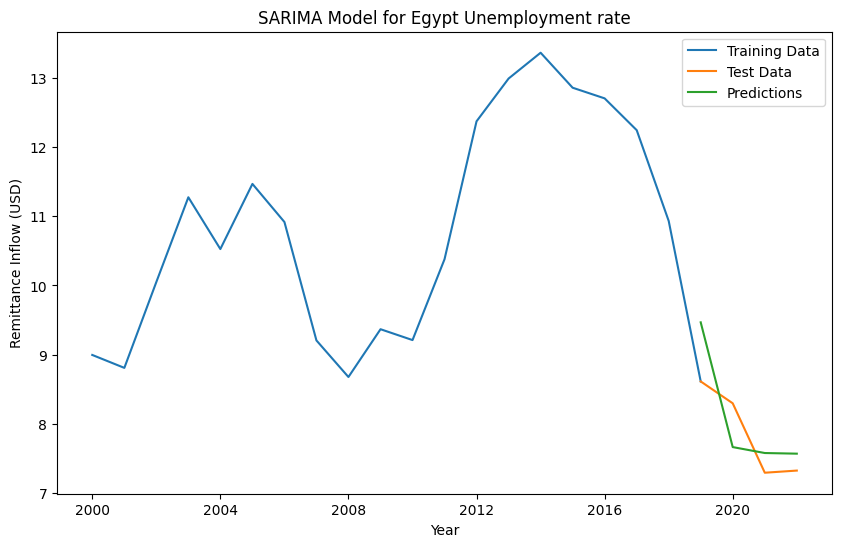

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

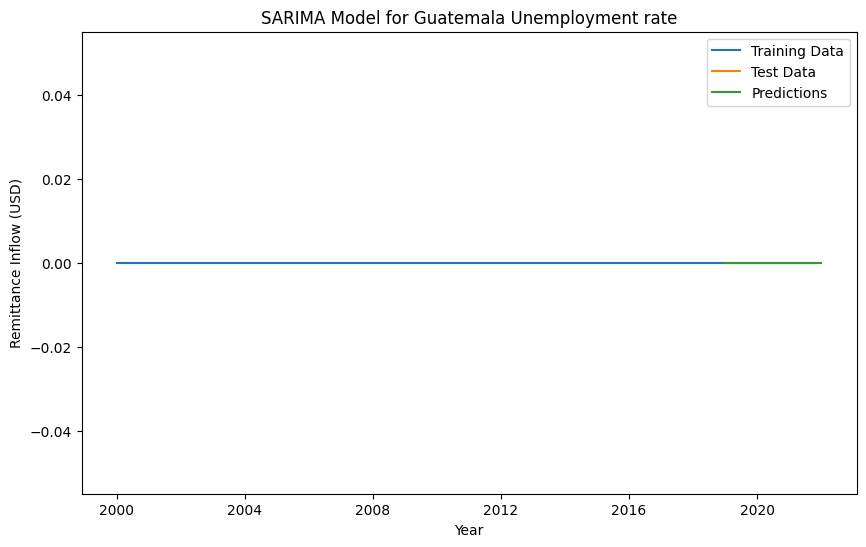

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

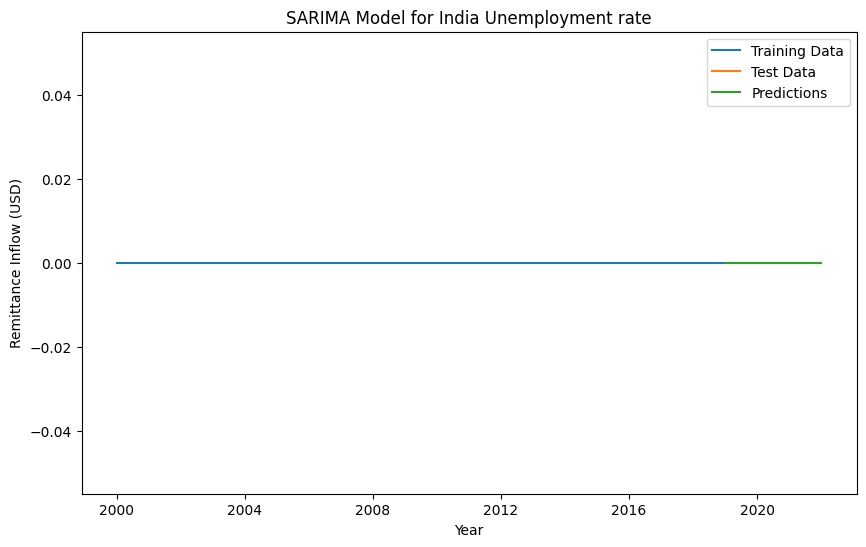

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible startin

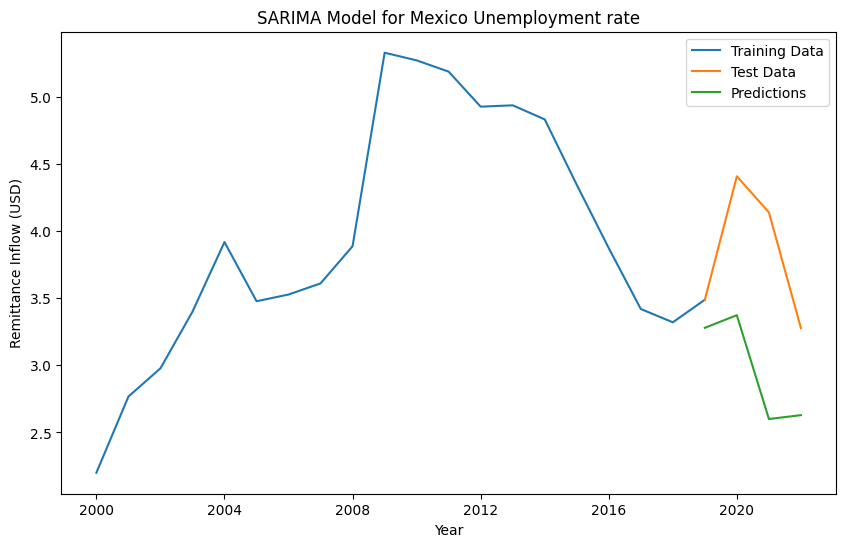

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-statio

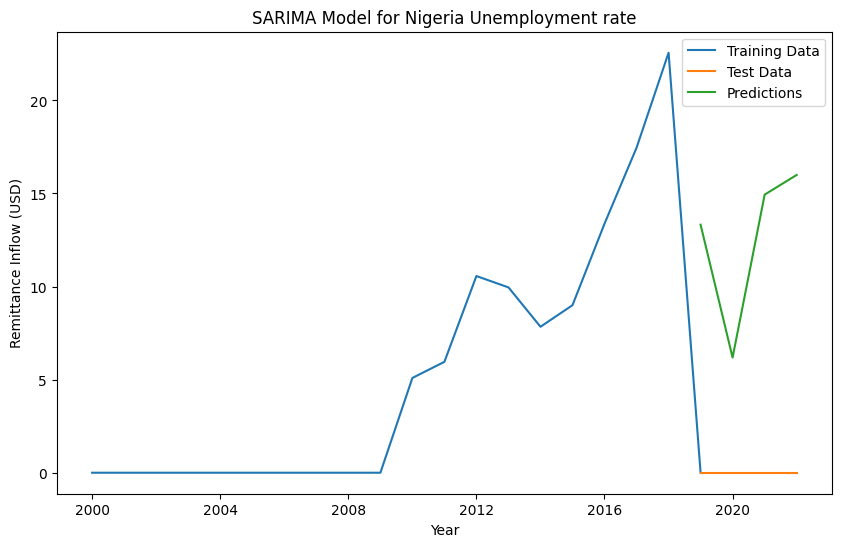

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

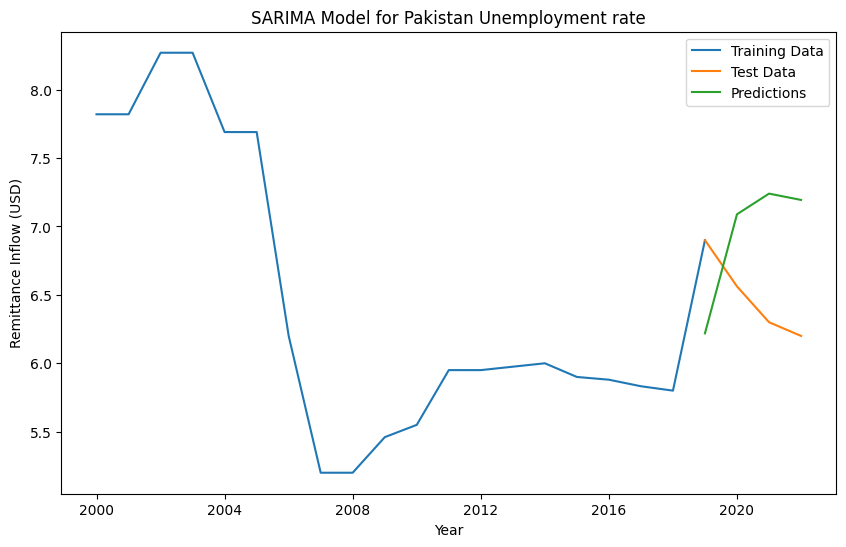

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

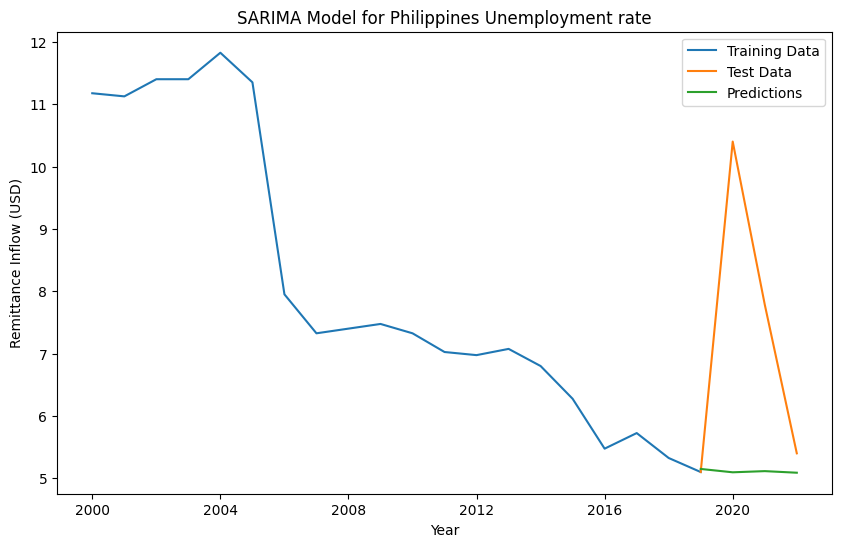

<ipython-input-312-c86093b0dbe1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = pd.to_datetime(df['Year'], format='%Y')
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances wil

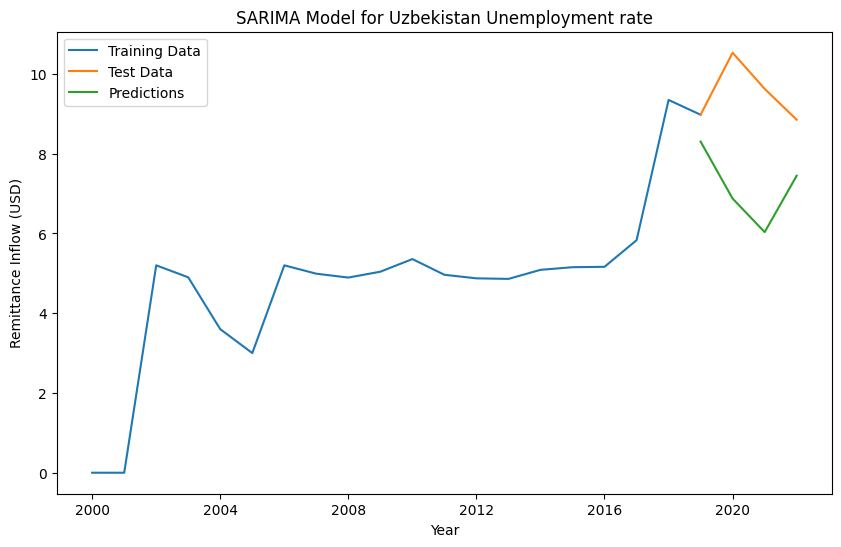

In [ ]:
pred_une_bangladesh, true_une_bangladesh = predict_elements(une_bangladesh, 'Bangladesh', element)
pred_une_china, true_une_china = predict_elements(une_china, 'China', element)
pred_une_egypt, true_une_egypt = predict_elements(une_egypt, 'Egypt', element)
pred_une_guatemala, true_une_guatemala = predict_elements(une_guatemala, 'Guatemala', element)
pred_une_india, true_une_india = predict_elements(une_india, 'India', element)
pred_une_mexico, true_une_mexico = predict_elements(une_mexico, 'Mexico', element)
pred_une_nigeria, true_une_nigeria = predict_elements(une_nigeria, 'Nigeria', element)
pred_une_pakistan, true_une_pakistan = predict_elements(une_pakistan, 'Pakistan', element)
pred_une_philippines, true_une_philippines = predict_elements(une_philippines, 'Philippines', element)
pred_une_uzbekistan, true_une_uzbekistan = predict_elements(une_uzbekistan, 'Uzbekistan', element)

#**Evaluation**

In [ ]:
from statsmodels.tools.eval_measures import rmse

##**Remittance inflow**

In [ ]:
rmse_rem_bangladesh = rmse(pred_rem_bangladesh, true_rem_bangladesh)
rmse_rem_china = rmse(pred_rem_china, true_rem_china)
rmse_rem_egypt = rmse(pred_rem_egypt, true_rem_egypt)
rmse_rem_guatemala = (pred_rem_guatemala, true_rem_guatemala)
rmse_rem_india = (pred_rem_india, true_rem_india)
rmse_rem_mexico = (pred_rem_mexico, true_rem_mexico)
rmse_rem_nigeria = (pred_rem_nigeria, true_rem_nigeria)
rmse_rem_pakistan = (pred_rem_pakistan, true_rem_pakistan)
rmse_rem_philippines = (pred_rem_philippines, true_rem_philippines)
rmse_rem_uzbekistan = (pred_rem_uzbekistan, true_rem_uzbekistan)

##**Gross domestic product, current prices**

###**US Dollar**

In [ ]:
rmse_gdp_cp_bangladesh_us = rmse(pred_gdp_cp_bangladesh_us, true_gdp_cp_bangladesh_us)
rmse_gdp_cp_china_us = rmse(pred_gdp_cp_china_us, true_gdp_cp_china_us)
rmse_gdp_cp_egypt_us = rmse(pred_gdp_cp_egypt_us, true_gdp_cp_egypt_us)
rmse_gdp_cp_guatemala_us = rmse(pred_gdp_cp_guatemala_us, true_gdp_cp_guatemala_us)
rmse_gdp_cp_india_us = rmse(pred_gdp_cp_india_us, true_gdp_cp_india_us)
rmse_gdp_cp_mexico_us = rmse(pred_gdp_cp_mexico_us, true_gdp_cp_mexico_us)
rmse_gdp_cp_nigeria_us = rmse(pred_gdp_cp_nigeria_us, true_gdp_cp_nigeria_us)
rmse_gdp_cp_pakistan_us = rmse(pred_gdp_cp_pakistan_us, true_gdp_cp_pakistan_us)
rmse_gdp_cp_philippines_us = rmse(pred_gdp_cp_philippines_us, true_gdp_cp_philippines_us)
rmse_gdp_cp_uzbekistan_us = rmse(pred_gdp_cp_uzbekistan_us, true_gdp_cp_uzbekistan_us)

###**Purchasing power parity; international dollars**

In [ ]:
rmse_gdp_cp_bangladesh_id = rmse(pred_gdp_cp_bangladesh_id, true_gdp_cp_bangladesh_id)
rmse_gdp_cp_china_id = rmse(pred_gdp_cp_china_id, true_gdp_cp_china_id)
rmse_gdp_cp_egypt_id = rmse(pred_gdp_cp_egypt_id, true_gdp_cp_egypt_id)
rmse_gdp_cp_guatemala_id = rmse(pred_gdp_cp_guatemala_id, true_gdp_cp_guatemala_id)
rmse_gdp_cp_india_id = rmse(pred_gdp_cp_india_id, true_gdp_cp_india_id)
rmse_gdp_cp_mexico_id = rmse(pred_gdp_cp_mexico_id, true_gdp_cp_mexico_id)
rmse_gdp_cp_nigeria_id = rmse(pred_gdp_cp_nigeria_id, true_gdp_cp_nigeria_id)
rmse_gdp_cp_pakistan_id = rmse(pred_gdp_cp_pakistan_id, true_gdp_cp_pakistan_id)
rmse_gdp_cp_philippines_id = rmse(pred_gdp_cp_philippines_id, true_gdp_cp_philippines_id)
rmse_gdp_cp_uzbekistan_id = rmse(pred_gdp_cp_uzbekistan_id, true_gdp_cp_uzbekistan_id)

##**Percent of GDP**

In [ ]:
rmse_per_gdp_bangladesh = rmse(pred_per_gdp_bangladesh, true_per_gdp_bangladesh)
rmse_per_gdp_china = rmse(pred_per_gdp_china, true_per_gdp_china)
rmse_per_gdp_egypt = rmse(pred_per_gdp_egypt, true_per_gdp_egypt)
rmse_per_gdp_guatemala = rmse(pred_per_gdp_guatemala, true_per_gdp_guatemala)
rmse_per_gdp_india = rmse(pred_per_gdp_india, true_per_gdp_india)
rmse_per_gdp_mexico = rmse(pred_per_gdp_mexico, true_per_gdp_mexico)
rmse_per_gdp_nigeria = rmse(pred_per_gdp_nigeria, true_per_gdp_nigeria)
rmse_per_gdp_pakistan = rmse(pred_per_gdp_pakistan, true_per_gdp_pakistan)
rmse_per_gdp_philippines = rmse(pred_per_gdp_philippines, true_per_gdp_philippines)
rmse_per_gdp_uzbekistan = rmse(pred_per_gdp_uzbekistan, true_per_gdp_uzbekistan)

##**Inflation, average consumer prices**

###**Index**

In [ ]:
rmse_inf_bangladesh_idx = rmse(pred_inf_bangladesh_idx, true_inf_bangladesh_idx )
rmse_inf_china_idx = rmse(pred_inf_china_idx, true_inf_china_idx)
rmse_inf_egypt_idx = rmse(pred_inf_egypt_idx, true_inf_egypt_idx)
rmse_inf_guatemala_idx = rmse(pred_inf_guatemala_idx, true_inf_guatemala_idx)
rmse_inf_india_idx = rmse(pred_inf_india_idx, true_inf_india_idx )
rmse_inf_mexico_idx = rmse(pred_inf_mexico_idx, true_inf_mexico_idx)
rmse_inf_nigeria_idx = rmse(pred_inf_nigeria_idx, true_inf_nigeria_idx)
rmse_inf_pakistan_idx = rmse(pred_inf_pakistan_idx, true_inf_pakistan_idx)
rmse_inf_philippines_idx = rmse(pred_inf_philippines_idx, true_inf_philippines_idx)
rmse_inf_uzbekistan_idx = rmse(pred_inf_uzbekistan_idx, true_inf_uzbekistan_idx)

###**Percent change**

In [ ]:
rmse_inf_bangladesh_chg = rmse(pred_inf_bangladesh_chg, true_inf_bangladesh_chg)
rmse_inf_china_chg = rmse(pred_inf_china_chg, true_inf_china_chg)
rmse_inf_egypt_chg = rmse(pred_inf_egypt_chg, true_inf_egypt_chg)
rmse_inf_guatemala_chg = rmse(pred_inf_guatemala_chg, true_inf_guatemala_chg)
rmse_inf_india_chg = rmse(pred_inf_india_chg, true_inf_india_chg)
rmse_inf_mexico_chg = rmse(pred_inf_mexico_chg, true_inf_mexico_chg)
rmse_inf_nigeria_chg = rmse(pred_inf_nigeria_chg, true_inf_nigeria_chg)
rmse_inf_pakistan_chg = rmse(pred_inf_pakistan_chg, true_inf_pakistan_chg)
rmse_inf_philippines_chg = rmse(pred_inf_philippines_chg, true_inf_philippines_chg)
rmse_inf_uzbekistan_chg = rmse(pred_inf_uzbekistan_chg, true_inf_uzbekistan_chg)

##**Human Development Index**

In [ ]:
rmse_hdi_bangladesh = rmse(pred_hdi_bangladesh, true_hdi_bangladesh)
rmse_hdi_china = rmse(pred_hdi_china, true_hdi_china)
rmse_hdi_egypt = rmse(pred_hdi_egypt, true_hdi_egypt)
rmse_hdi_guatemala = rmse(pred_hdi_guatemala, true_hdi_guatemala)
rmse_hdi_india = rmse(pred_hdi_india, true_hdi_india)
rmse_hdi_mexico = rmse(pred_hdi_mexico, true_hdi_mexico)
rmse_hdi_nigeria = rmse(pred_hdi_nigeria, true_hdi_nigeria)
rmse_hdi_pakistan = rmse(pred_hdi_pakistan, true_hdi_pakistan)
rmse_hdi_philippines = rmse(pred_hdi_philippines, true_hdi_philippines)
rmse_hdi_uzbekistan = rmse(pred_hdi_uzbekistan, true_hdi_uzbekistan)

##**Households and NPISHs Final consumption expenditure**

In [ ]:
rmse_exp_bangladesh = rmse(pred_exp_bangladesh, true_exp_bangladesh)
rmse_exp_china = rmse(pred_exp_china, true_exp_china)
rmse_exp_egypt = rmse(pred_exp_egypt, true_exp_egypt)
rmse_exp_guatemala = rmse(pred_exp_guatemala, true_exp_guatemala)
rmse_exp_india = rmse(pred_exp_india, true_exp_india)
rmse_exp_mexico = rmse(pred_exp_mexico, true_exp_mexico)
rmse_exp_nigeria = rmse(pred_exp_nigeria, true_exp_nigeria)
rmse_exp_pakistan = rmse(pred_exp_pakistan, true_exp_pakistan)
rmse_exp_philippines = rmse(pred_exp_philippines, true_exp_philippines)
rmse_exp_uzbekistan = rmse(pred_exp_uzbekistan, true_exp_uzbekistan)

##**Multidimensional poverty headcount ratio (World Bank)**

In [ ]:
rmse_pov_bangladesh = rmse(pred_pov_bangladesh, true_pov_bangladesh)
rmse_pov_china = rmse(pred_pov_china, true_pov_china)
rmse_pov_egypt = rmse(pred_pov_egypt, true_pov_egypt)
rmse_pov_guatemala = rmse(pred_pov_guatemala, true_pov_guatemala)
rmse_pov_india = rmse(pred_pov_india, true_pov_india)
rmse_pov_mexico = rmse(pred_pov_mexico, true_pov_mexico)
rmse_pov_nigeria = rmse(pred_pov_nigeria, true_pov_nigeria)
rmse_pov_pakistan = rmse(pred_pov_pakistan, true_pov_pakistan)
rmse_pov_philippines = rmse(pred_pov_philippines, true_pov_philippines)
rmse_pov_uzbekistan = rmse(pred_pov_uzbekistan, true_pov_uzbekistan)

##**Unemployment rate**

In [ ]:
rmse_une_bangladesh = rmse(pred_une_bangladesh, true_une_bangladesh)
rmse_une_china = rmse(pred_une_china, true_une_china)
rmse_une_egypt = rmse(pred_une_egypt, true_une_egypt)
rmse_une_guatemala = rmse(pred_une_guatemala, true_une_guatemala)
rmse_une_india = rmse(pred_une_india, true_une_india)
rmse_une_mexico = rmse(pred_une_mexico, true_une_mexico)
rmse_une_nigeria = rmse(pred_une_nigeria, true_une_nigeria)
rmse_une_pakistan = rmse(pred_une_pakistan, true_une_pakistan)
rmse_une_philippines = rmse(pred_une_philippines, true_une_philippines)
rmse_une_uzbekistan = rmse(pred_une_uzbekistan, true_une_uzbekistan)

##**Evaluation Summary**

In [ ]:
country = ['Bangladesh', 'China','Egypt','Guatemala', 'India', 'Mexico', 'Nigeria', 'Pakistan', 'Philippines', 'Uzbekistan']
rem = [rmse_rem_bangladesh, rmse_rem_china, rmse_rem_egypt , rmse_rem_guatemala, rmse_rem_india, rmse_rem_mexico ,rmse_rem_nigeria, rmse_rem_pakistan, rmse_rem_philippines , rmse_rem_uzbekistan]
gdp_us = [rmse_gdp_cp_bangladesh_us, rmse_gdp_cp_china_us, rmse_gdp_cp_egypt_us, rmse_gdp_cp_guatemala_us, rmse_gdp_cp_india_us, rmse_gdp_cp_mexico_us, rmse_gdp_cp_nigeria_us, rmse_gdp_cp_pakistan_us, rmse_gdp_cp_philippines_us, rmse_gdp_cp_uzbekistan_us]
gdp_id = [rmse_gdp_cp_bangladesh_id, rmse_gdp_cp_china_id, rmse_gdp_cp_egypt_id, rmse_gdp_cp_guatemala_id, rmse_gdp_cp_india_id, rmse_gdp_cp_mexico_id, rmse_gdp_cp_nigeria_id, rmse_gdp_cp_pakistan_id, rmse_gdp_cp_philippines_id, rmse_gdp_cp_uzbekistan_id]
per_gdp = [rmse_per_gdp_bangladesh, rmse_per_gdp_china, rmse_per_gdp_egypt, rmse_per_gdp_guatemala, rmse_per_gdp_india, rmse_per_gdp_mexico, rmse_per_gdp_nigeria, rmse_per_gdp_pakistan, rmse_per_gdp_philippines, rmse_per_gdp_uzbekistan]
inf_idx = [rmse_inf_bangladesh_idx, rmse_inf_china_idx, rmse_inf_egypt_idx, rmse_inf_guatemala_idx, rmse_inf_india_idx, rmse_inf_mexico_idx, rmse_inf_nigeria_idx, rmse_inf_pakistan_idx, rmse_inf_philippines_idx, rmse_inf_uzbekistan_idx]
inf_chg = [rmse_inf_bangladesh_chg, rmse_inf_china_chg, rmse_inf_egypt_chg, rmse_inf_guatemala_chg, rmse_inf_india_chg, rmse_inf_mexico_chg, rmse_inf_nigeria_chg, rmse_inf_pakistan_chg, rmse_inf_philippines_chg, rmse_inf_uzbekistan_chg]
hdi = [rmse_hdi_bangladesh, rmse_hdi_china, rmse_hdi_egypt, rmse_hdi_guatemala, rmse_hdi_india, rmse_hdi_mexico, rmse_hdi_nigeria, rmse_hdi_pakistan, rmse_hdi_philippines, rmse_hdi_uzbekistan]
exp = [rmse_exp_bangladesh, rmse_exp_china, rmse_exp_egypt, rmse_exp_guatemala, rmse_exp_india, rmse_exp_mexico, rmse_exp_nigeria, rmse_exp_pakistan, rmse_exp_philippines, rmse_exp_uzbekistan]
pov = [rmse_pov_bangladesh, rmse_pov_china, rmse_pov_egypt, rmse_pov_guatemala, rmse_pov_india, rmse_pov_mexico, rmse_pov_nigeria, rmse_pov_pakistan, rmse_pov_philippines, rmse_pov_uzbekistan]
une = [rmse_une_bangladesh, rmse_une_china, rmse_une_egypt, rmse_une_guatemala, rmse_une_india, rmse_une_mexico, rmse_une_nigeria, rmse_une_pakistan, rmse_une_philippines, rmse_une_uzbekistan]

In [ ]:
rmse_dict = {'Country': country, 'Remittance inflow': rem, 'Gross domestic product, current prices US Dollar': gdp_us,
        'Gross domestic product, current prices international dollars': gdp_id, 'Percent of GDP': per_gdp,
        'Inflation, average consumer prices Index': inf_idx, 'Inflation, average consumer prices Index': inf_chg,
        'Human Development Index': hdi, 'Households and NPISHs Final consumption expenditure': exp,
        'Multidimensional poverty headcount ratio (World Bank)': pov, 'Unemployment rate':une}
rmse_df = pd.DataFrame(rmse_dict)
rmse_df

,Country,Remittance inflow,"Gross domestic product, current prices US Dollar","Gross domestic product, current prices international dollars",Percent of GDP,"Inflation, average consumer prices Index",Human Development Index,Households and NPISHs Final consumption expenditure,Multidimensional poverty headcount ratio (World Bank),Unemployment rate
0,Bangladesh,913.038724,14.671456,118.839408,0.407176,2.054789,0.004523,2.373515,7.103894,0.000000
1,China,17467.004709,1292.991090,2591.290617,0.154730,1.485950,0.004683,7.446211,0.000000,0.157997
2,Egypt,4103.26736,78.518168,182.568792,1.692471,8.186927,0.006284,2.863868,0.989787,0.563921
3,Guatemala,"([10384.224564259554, 11740.146492110727, 1274...",6.661500,16.145584,2.697562,4.375302,0.020897,4.989401,1.154477,0.000000
4,India,"([86309.08942697439, 91724.19077852476, 92824....",170.218227,888.407733,0.407082,1.496194,0.012917,6.688137,0.000000,0.000000
5,Mexico,"([38839.9557009737, 41640.37568877102, 44772.2...",224.348213,204.641886,1.010387,1.565255,0.019264,8.467539,2.277493,0.988260
6,Nigeria,"([24831.237601991153, 24548.998882562228, 2471...",63.520556,62.722202,0.690771,7.198290,0.006057,0.000000,14.075281,13.180412
7,Pakistan,"([22546.69048800902, 23238.66924409692, 25032....",29.604576,126.459827,1.038052,10.706547,0.002897,5.456265,13.713312,0.808351
8,Philippines,"([35108.135416450066, 36963.77397266705, 38321...",21.406685,87.145408,0.263692,2.179076,0.020604,6.977004,1.138460,2.972932
9,Uzbekistan,"([8199.794193703898, 8929.279364199805, 8402.6...",16.293695,29.998235,3.833572,1.700282,0.012947,5.812498,1.150000,2.678376


In [ ]:
rmse_df.describe()

,"Gross domestic product, current prices US Dollar","Gross domestic product, current prices international dollars",Percent of GDP,"Inflation, average consumer prices Index",Human Development Index,Households and NPISHs Final consumption expenditure,Multidimensional poverty headcount ratio (World Bank),Unemployment rate
count,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,191.823416,430.821969,1.219549,4.094861,0.011107,5.107444,4.160270,2.135025
std,393.732826,800.416086,1.200238,3.394339,0.007150,2.624259,5.514358,4.029406
min,6.661500,16.145584,0.154730,1.485950,0.002897,0.000000,0.000000,0.000000
25%,17.571942,68.828004,0.407105,1.599011,0.005026,3.395252,1.026955,0.039499
50%,46.562566,122.649618,0.850579,2.116932,0.009601,5.634381,1.152239,0.686136
75%,147.293212,199.123612,1.528866,6.492543,0.017685,6.904787,5.897294,2.255847
max,1292.991090,2591.290617,3.833572,10.706547,0.020897,8.467539,14.075281,13.180412


#**EDA**

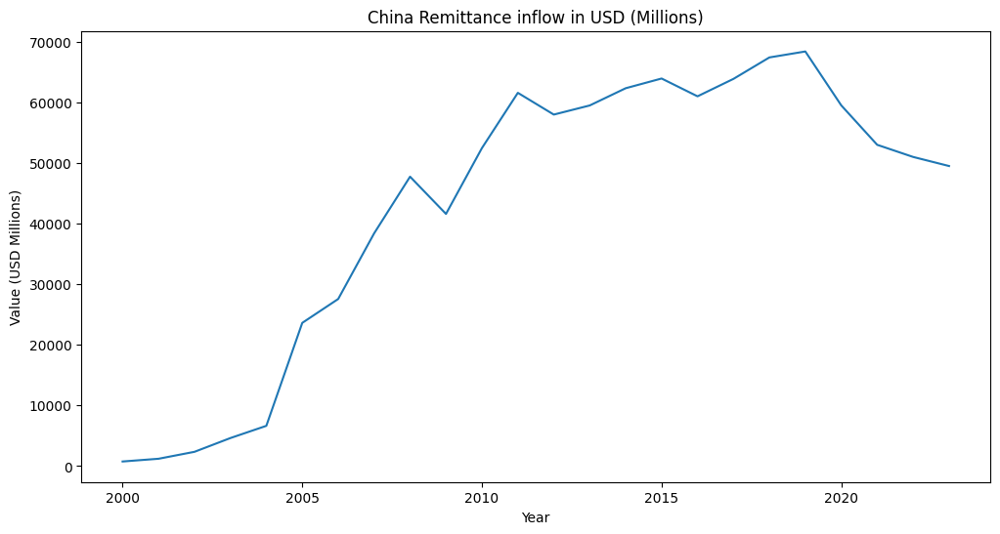

In [ ]:
import matplotlib.pyplot as plt


plt.figure(figsize=(12, 6))
plt.plot(remittance_inflow_china['Year'], remittance_inflow_china['Value'])
plt.xlabel('Year')
plt.ylabel('Value (USD Millions)')
plt.title('China Remittance inflow in USD (Millions)')
plt.show()







In [ ]:
def plot_grouped_data(grouped_data, group_name, value_column, title):

    df = grouped_data.get_group(group_name)
    #df[value_column] = df[value_column].str.replace(',', '').astype(float)

    # Extract unit and scale
    unit = df['Unit'].iloc[0]  # Assuming unit is the same for all rows in this group
    scale = df['Scale'].iloc[0]  # Assuming scale is the same for all rows in this group

    plt.figure(figsize=(12, 6))
    plt.plot(df['Year'], df[value_column], marker='o')

    plt.xlabel('Year')
    plt.ylabel(f'{value_column} ({unit} {scale})')
    plt.title(title)

    plt.show()

In [ ]:
#unique_elements = china['Element'].unique()
#print(unique_elements)

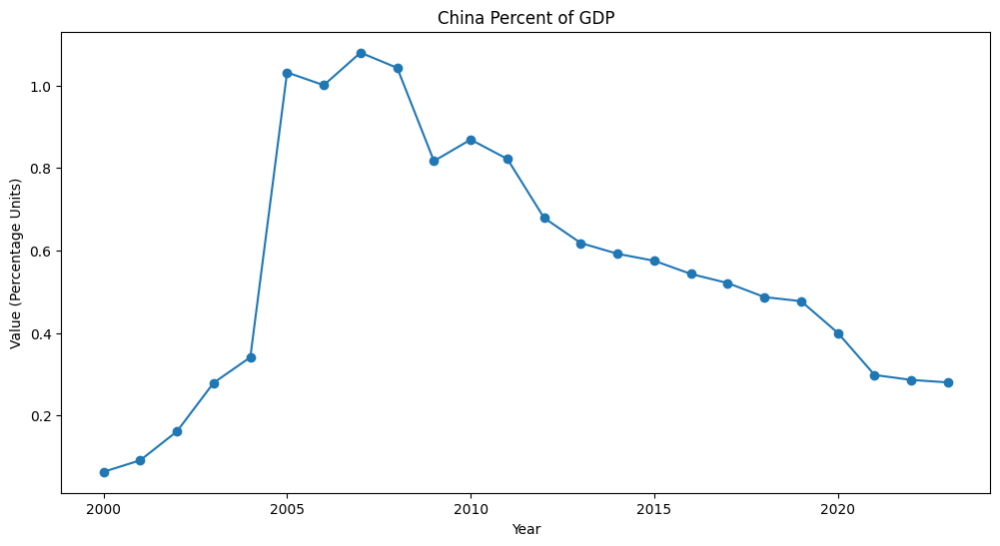

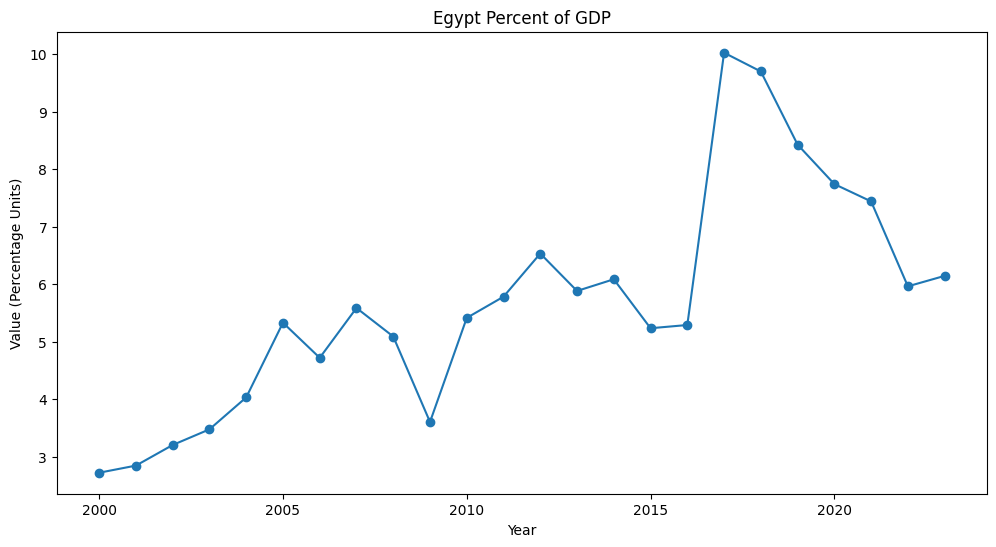

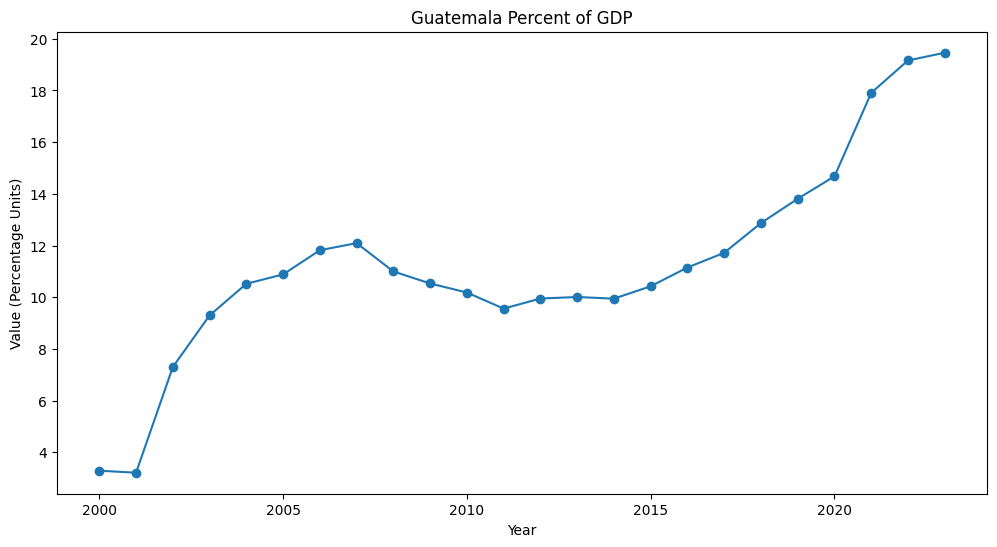

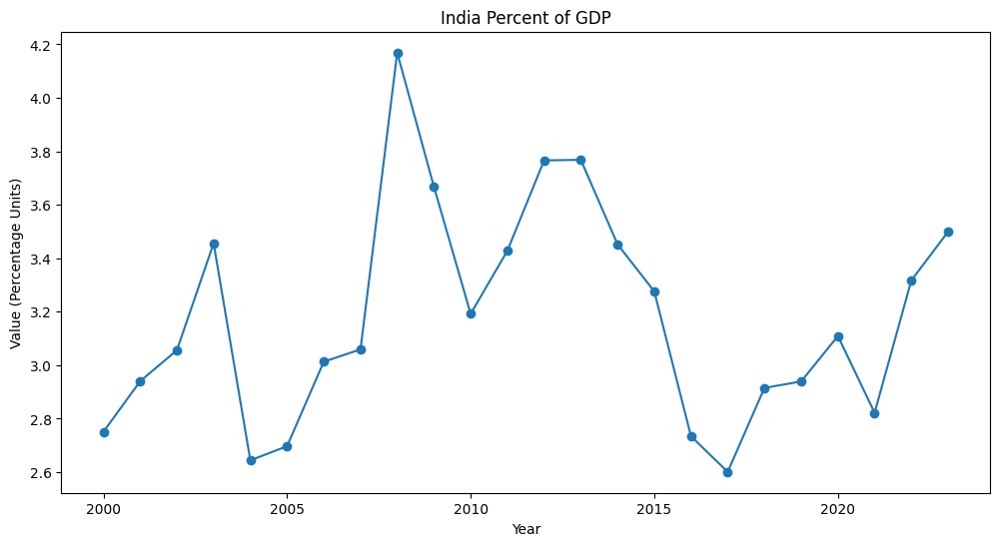

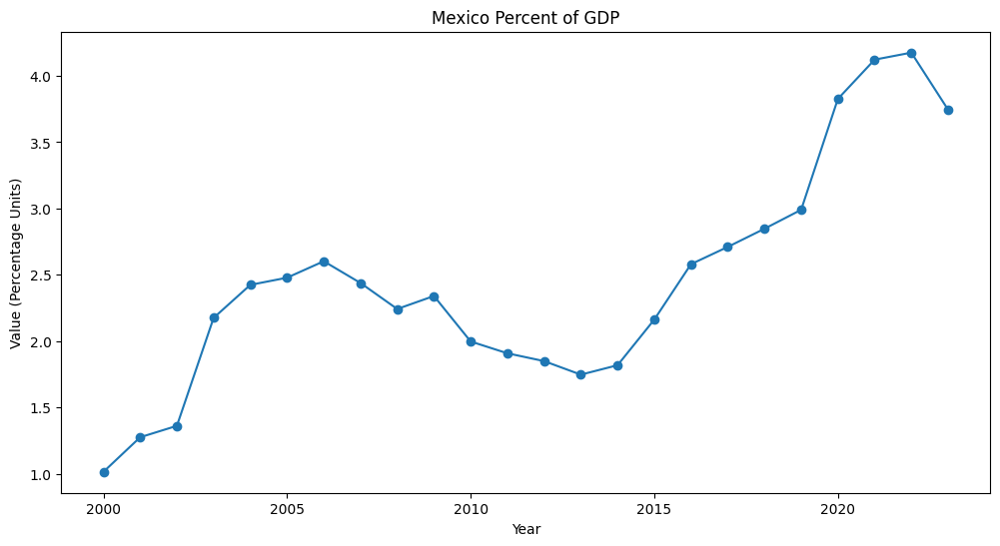

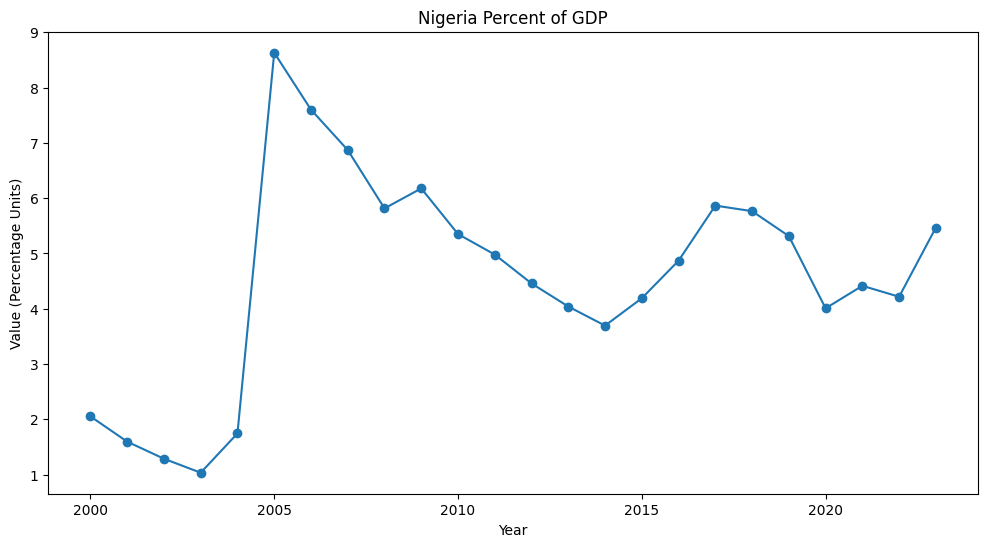

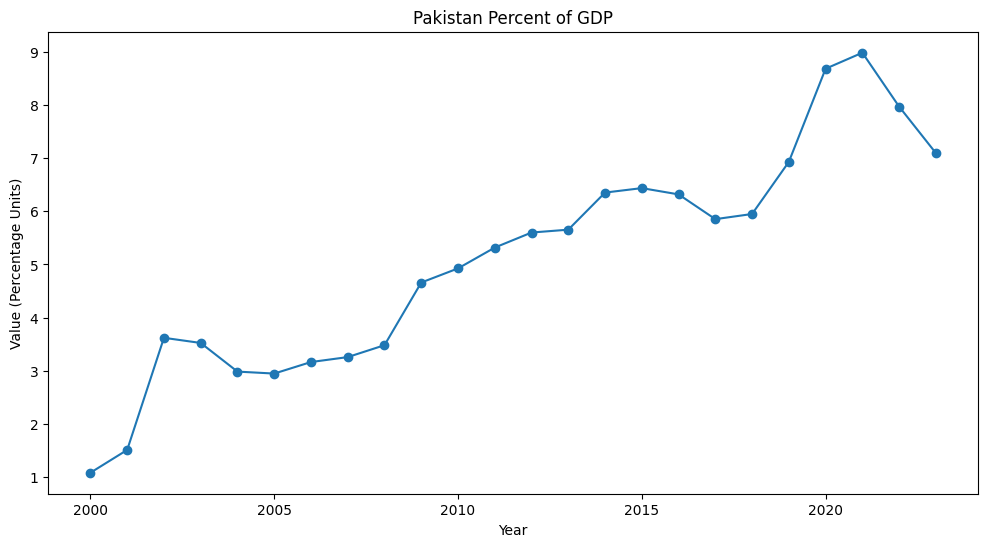

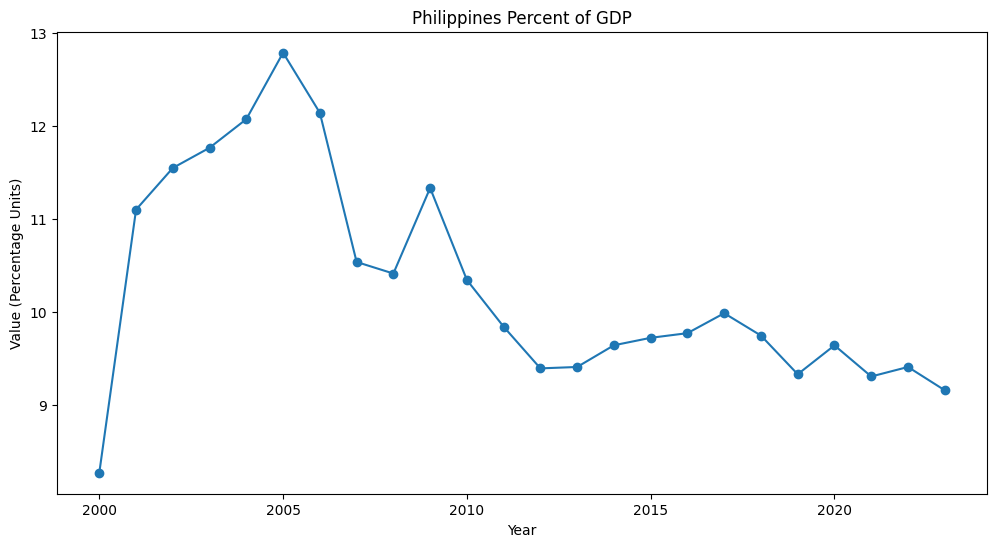

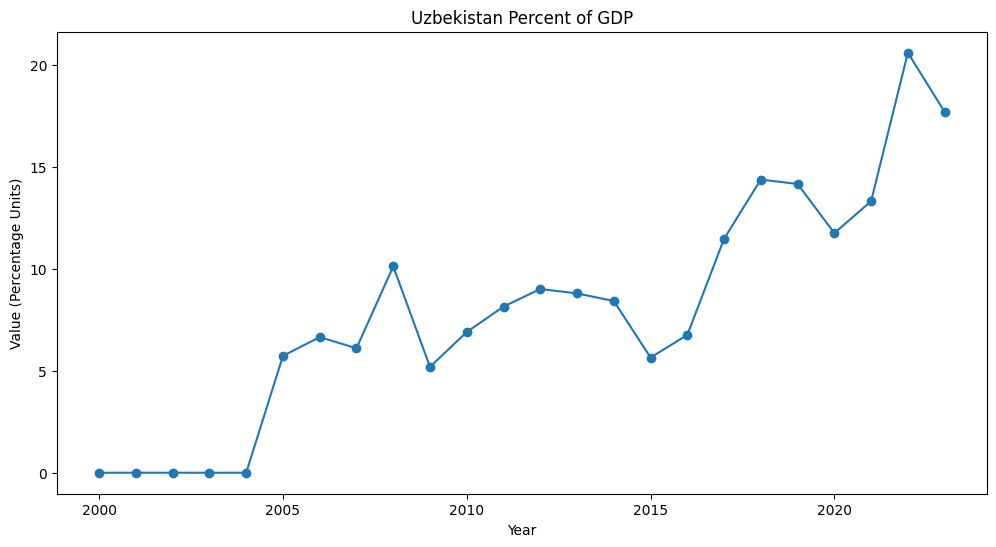

In [ ]:
plot_grouped_data(grouped_data_china, 'Percent of GDP', 'Value', 'China Percent of GDP')
plot_grouped_data(grouped_data_egypt, 'Percent of GDP', 'Value', 'Egypt Percent of GDP')
plot_grouped_data(grouped_data_guatemala, 'Percent of GDP', 'Value', 'Guatemala Percent of GDP')
plot_grouped_data(grouped_data_india, 'Percent of GDP', 'Value', 'India Percent of GDP')
plot_grouped_data(grouped_data_mexico, 'Percent of GDP', 'Value', 'Mexico Percent of GDP')
plot_grouped_data(grouped_data_nigeria, 'Percent of GDP', 'Value', 'Nigeria Percent of GDP')
plot_grouped_data(grouped_data_pakistan, 'Percent of GDP', 'Value', 'Pakistan Percent of GDP')
plot_grouped_data(grouped_data_philippines, 'Percent of GDP', 'Value', 'Philippines Percent of GDP')
plot_grouped_data(grouped_data_uzbekistan, 'Percent of GDP', 'Value', 'Uzbekistan Percent of GDP')

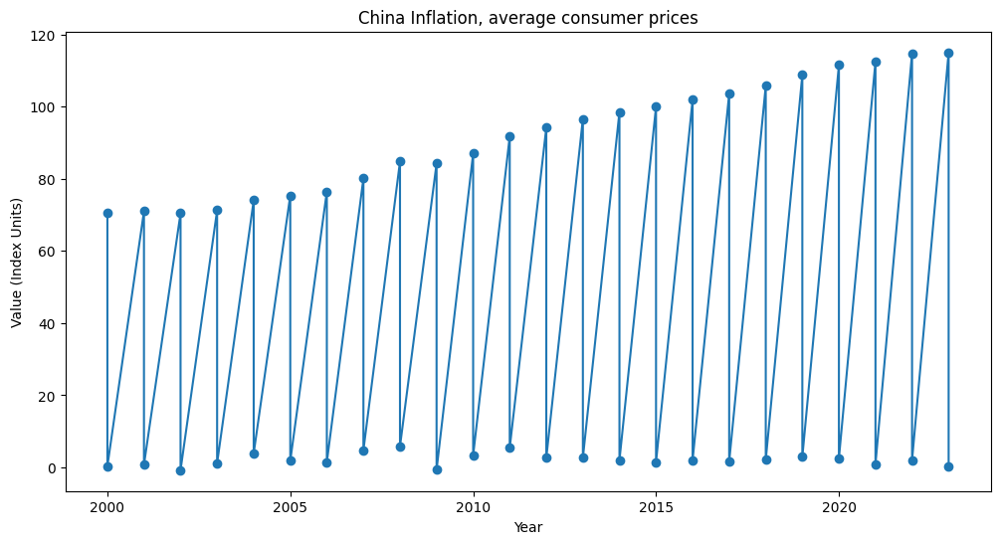

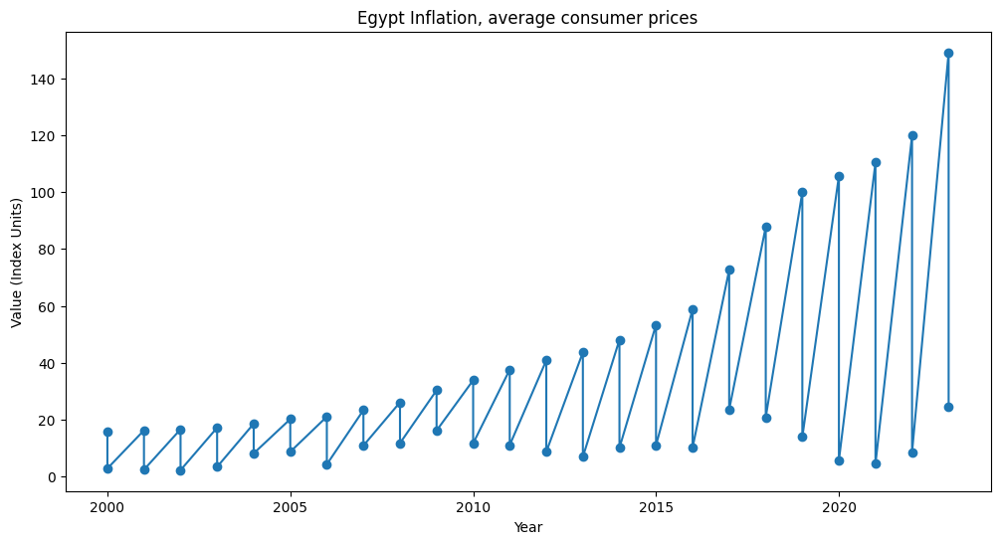

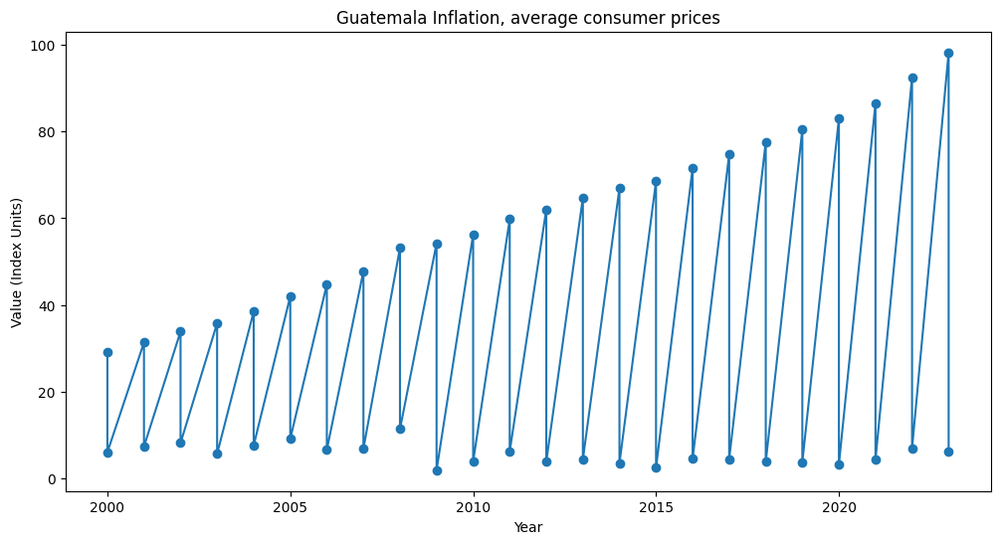

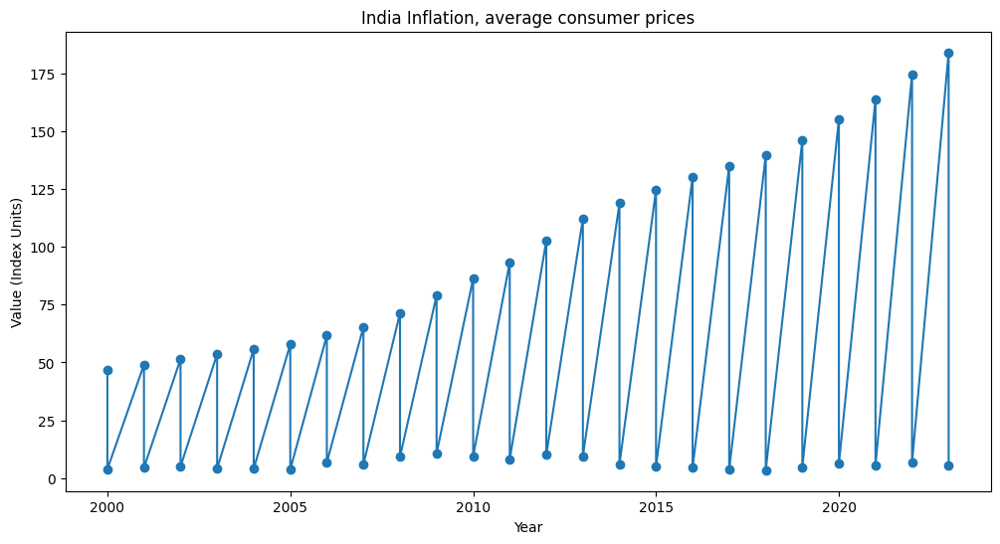

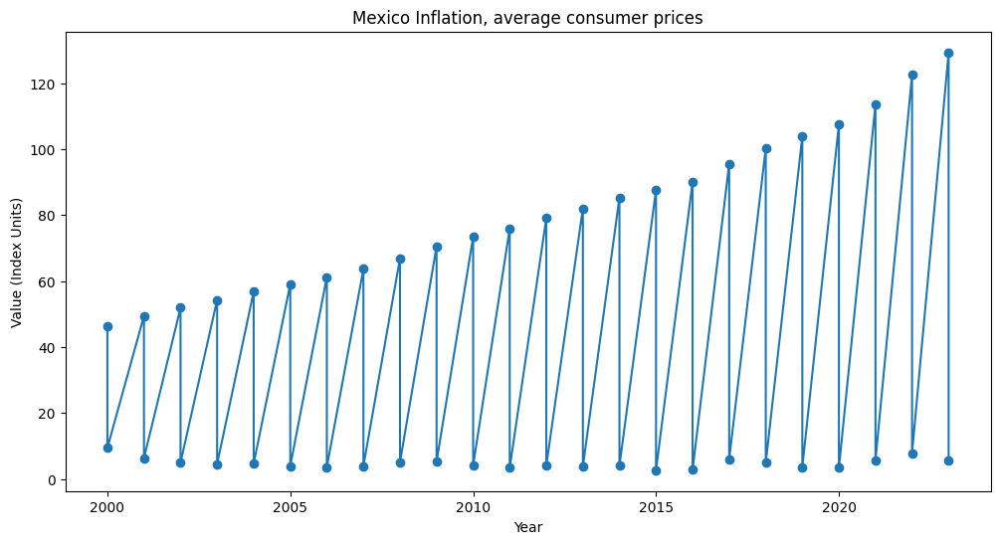

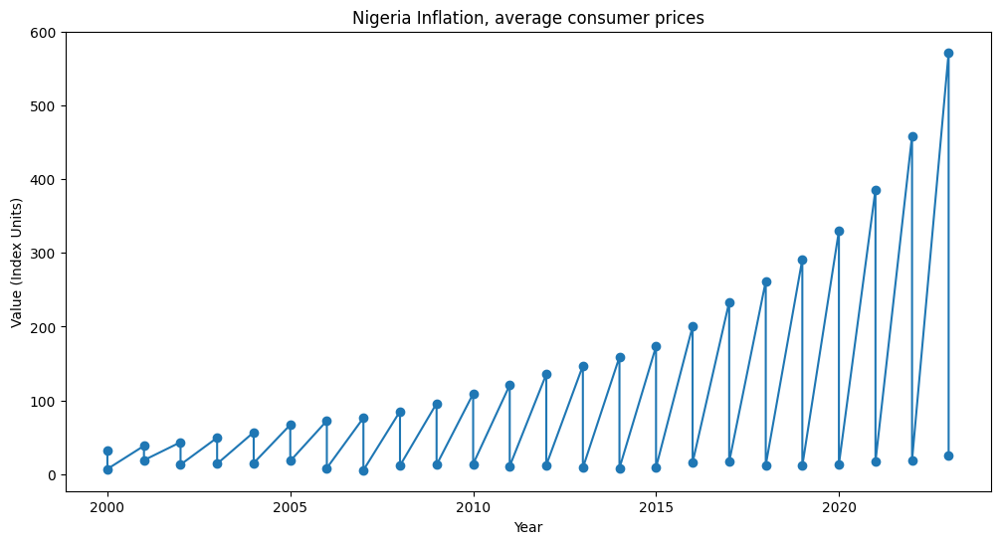

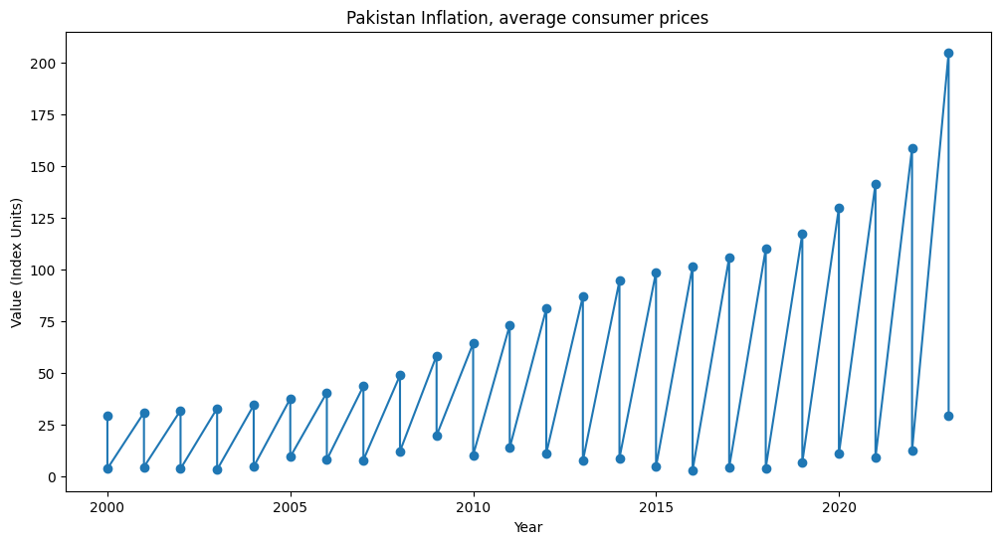

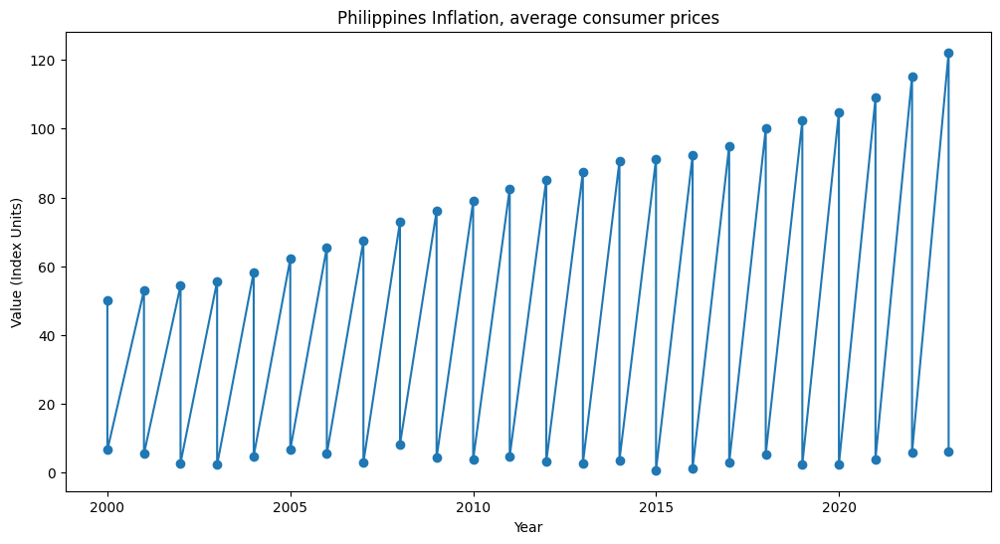

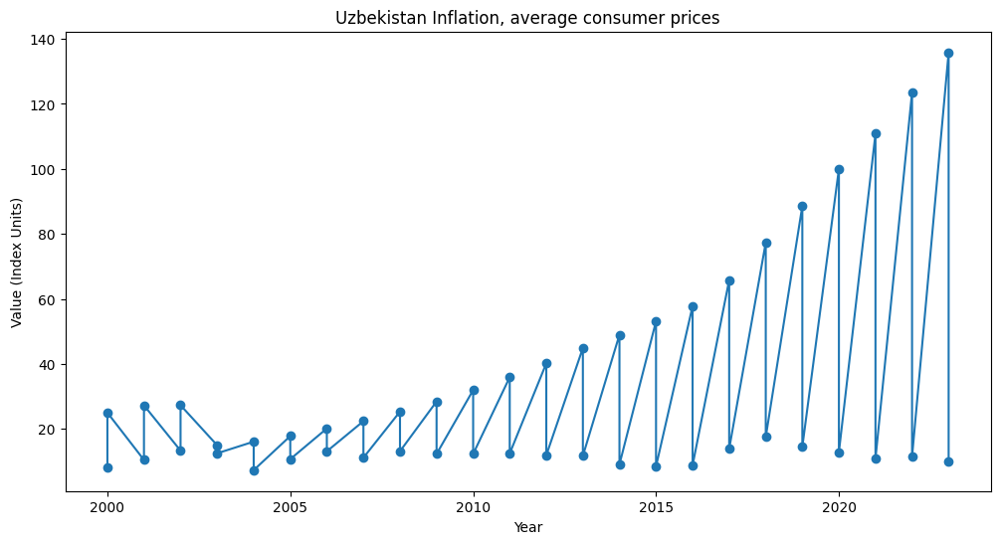

In [ ]:
#plot_grouped_data(grouped_data, 'Inflation, average consumer prices', 'Value', 'China Inflation, average consumer prices')
plot_grouped_data(grouped_data_china, 'Inflation, average consumer prices', 'Value', 'China Inflation, average consumer prices')
plot_grouped_data(grouped_data_egypt, 'Inflation, average consumer prices', 'Value', 'Egypt Inflation, average consumer prices')
plot_grouped_data(grouped_data_guatemala, 'Inflation, average consumer prices', 'Value', 'Guatemala Inflation, average consumer prices')
plot_grouped_data(grouped_data_india, 'Inflation, average consumer prices', 'Value', 'India Inflation, average consumer prices')
plot_grouped_data(grouped_data_mexico, 'Inflation, average consumer prices', 'Value', 'Mexico Inflation, average consumer prices')
plot_grouped_data(grouped_data_nigeria, 'Inflation, average consumer prices', 'Value', 'Nigeria Inflation, average consumer prices')
plot_grouped_data(grouped_data_pakistan, 'Inflation, average consumer prices', 'Value','Pakistan Inflation, average consumer prices')
plot_grouped_data(grouped_data_philippines, 'Inflation, average consumer prices', 'Value', 'Philippines Inflation, average consumer prices')
plot_grouped_data(grouped_data_uzbekistan, 'Inflation, average consumer prices', 'Value', 'Uzbekistan Inflation, average consumer prices')

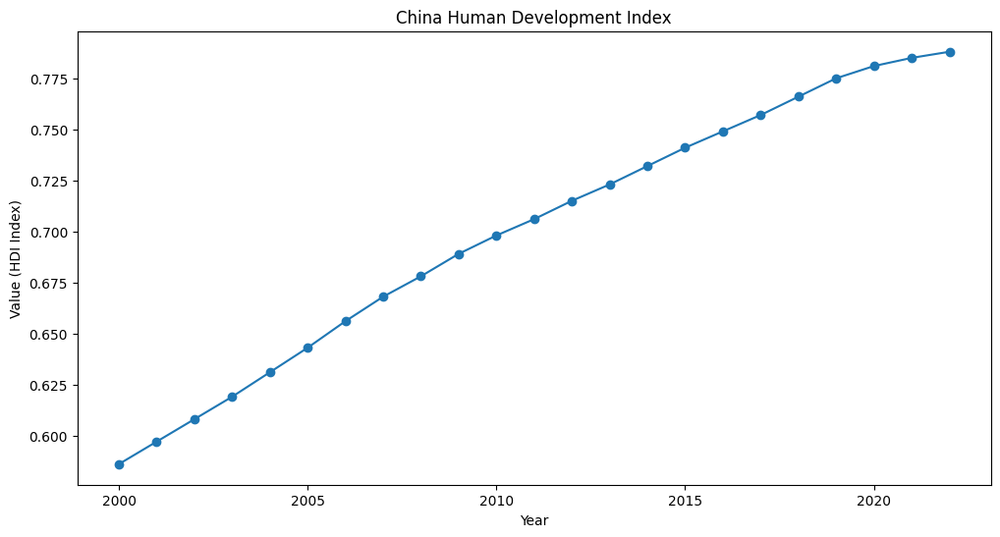

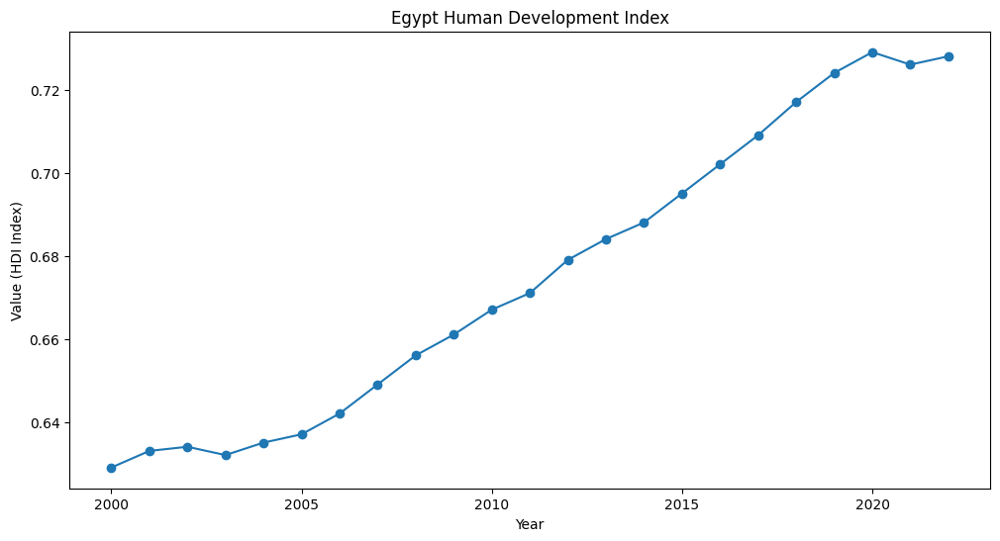

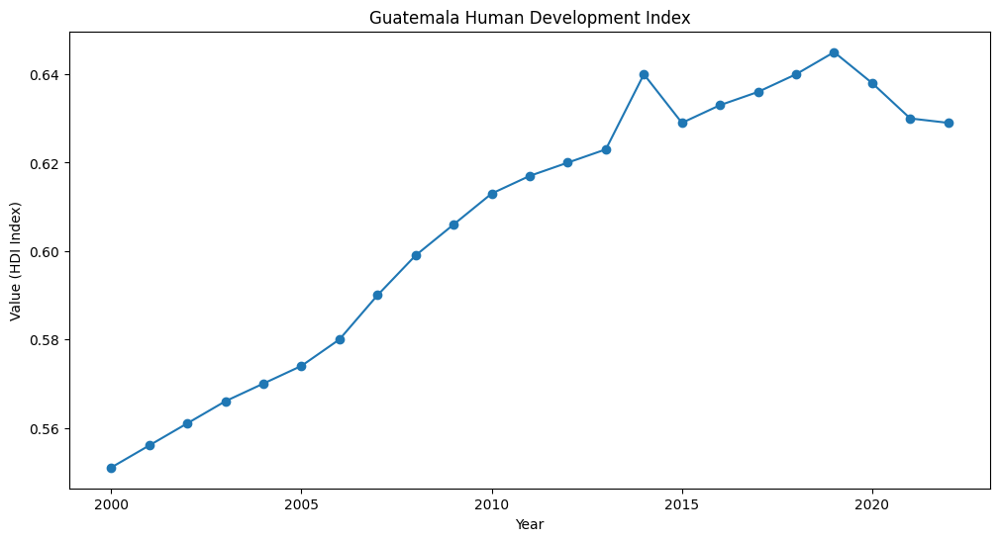

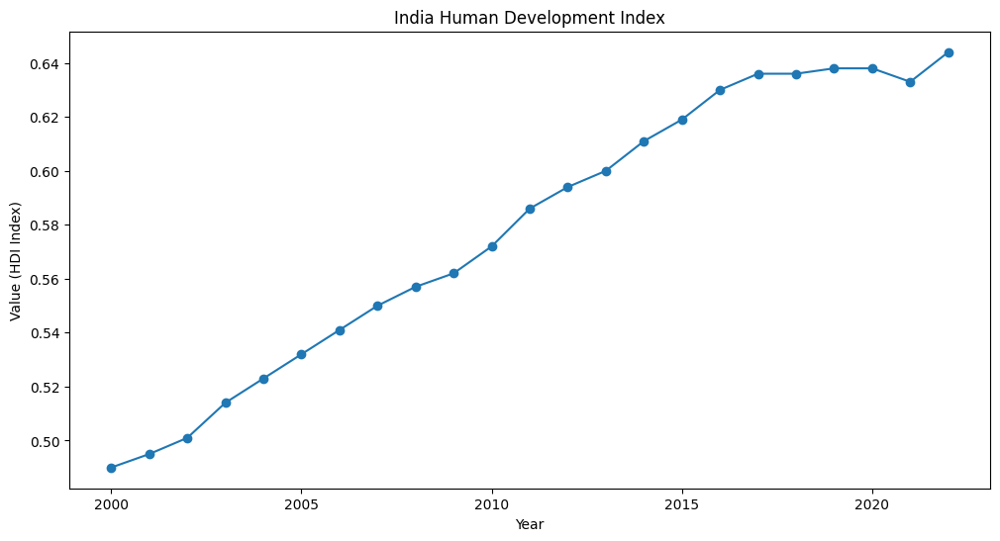

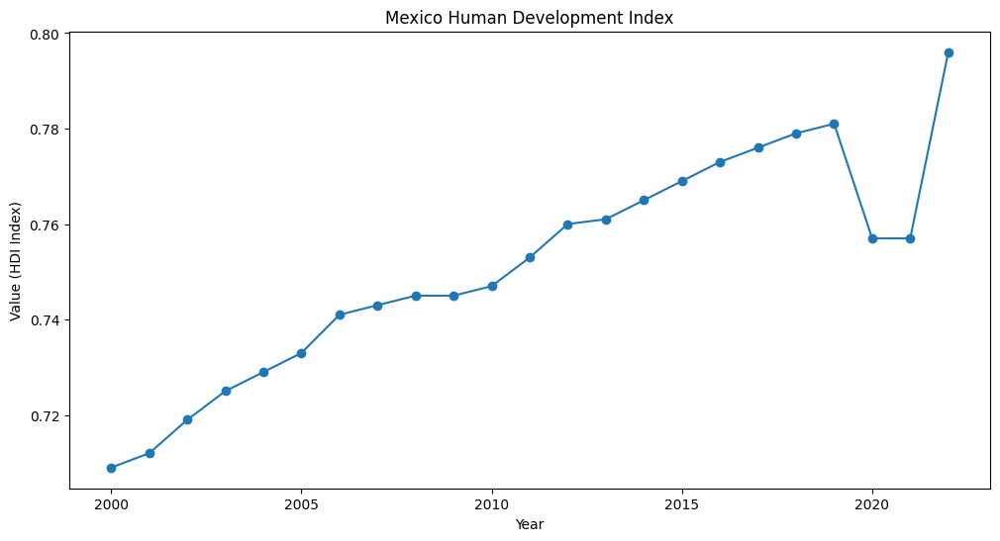

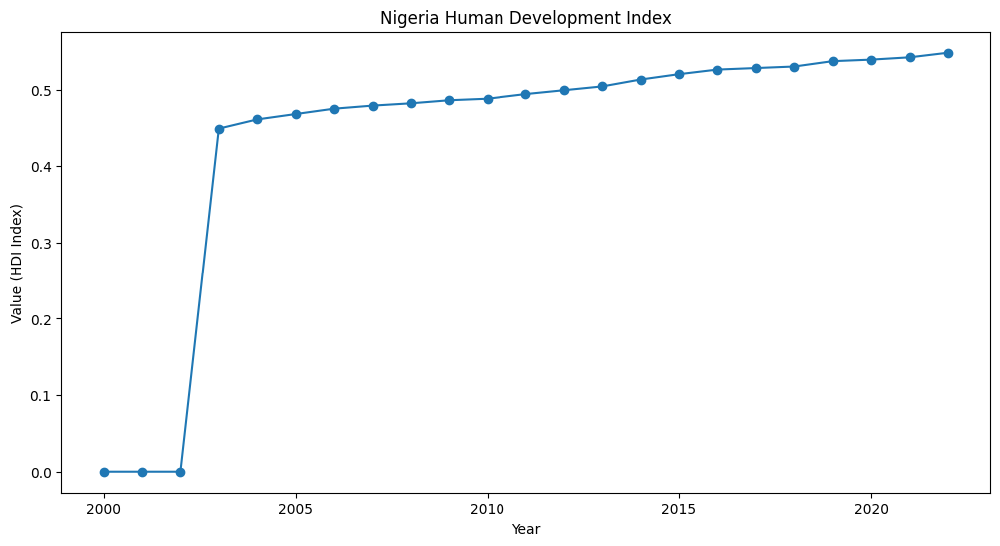

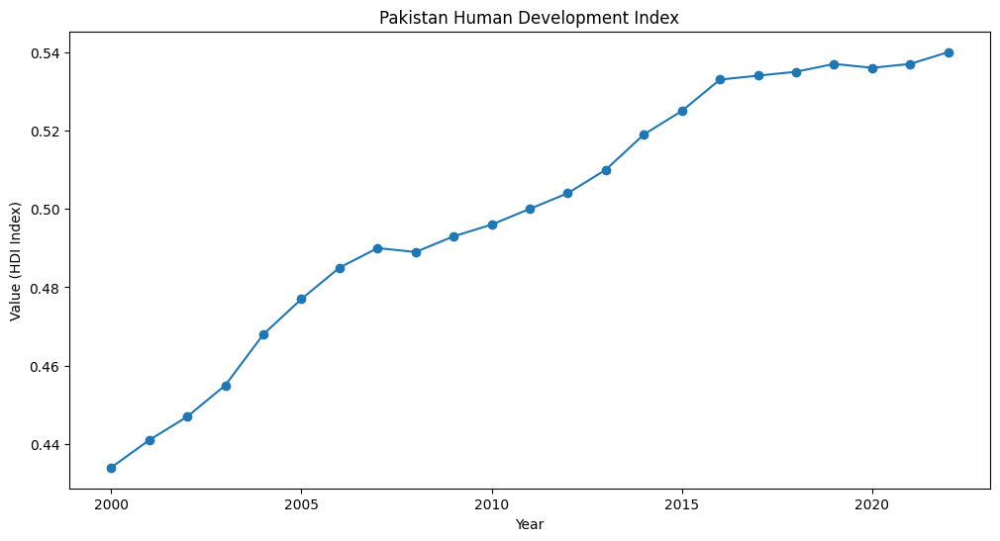

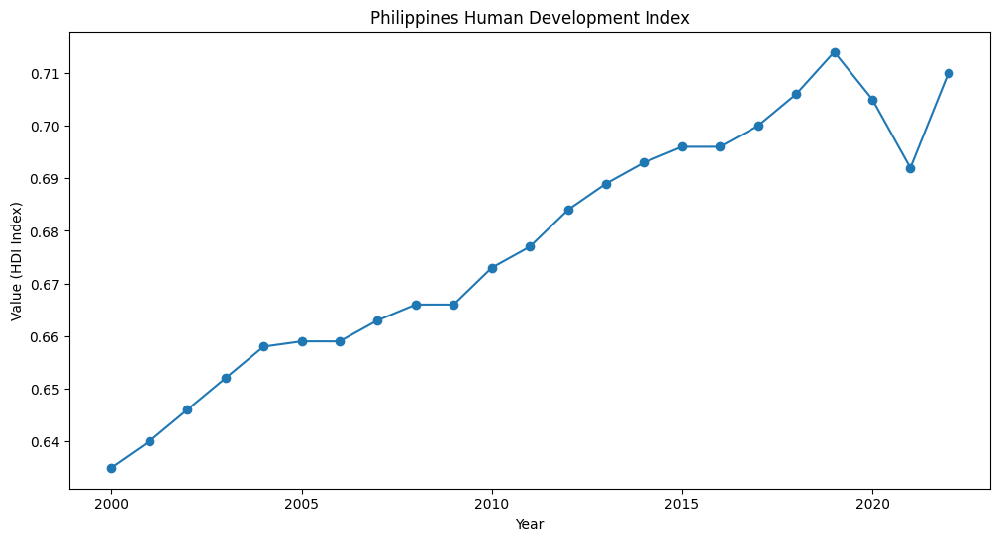

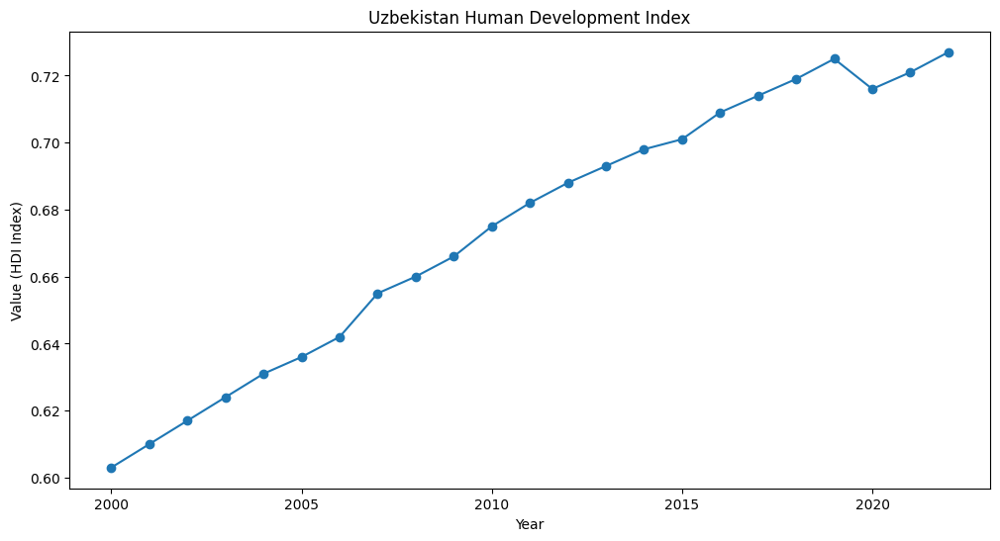

In [ ]:
#plot_grouped_data(grouped_data, 'Human Development Index', 'Value', 'China Human Development Index')
plot_grouped_data(grouped_data_china, 'Human Development Index', 'Value', 'China Human Development Index')
plot_grouped_data(grouped_data_egypt, 'Human Development Index', 'Value', 'Egypt Human Development Index')
plot_grouped_data(grouped_data_guatemala, 'Human Development Index', 'Value', 'Guatemala Human Development Index')
plot_grouped_data(grouped_data_india, 'Human Development Index', 'Value', 'India Human Development Index')
plot_grouped_data(grouped_data_mexico, 'Human Development Index', 'Value', 'Mexico Human Development Index')
plot_grouped_data(grouped_data_nigeria, 'Human Development Index', 'Value', 'Nigeria Human Development Index')
plot_grouped_data(grouped_data_pakistan, 'Human Development Index', 'Value','Pakistan Human Development Index')
plot_grouped_data(grouped_data_philippines, 'Human Development Index', 'Value', 'Philippines Human Development Index')
plot_grouped_data(grouped_data_uzbekistan, 'Human Development Index', 'Value', 'Uzbekistan Human Development Index')

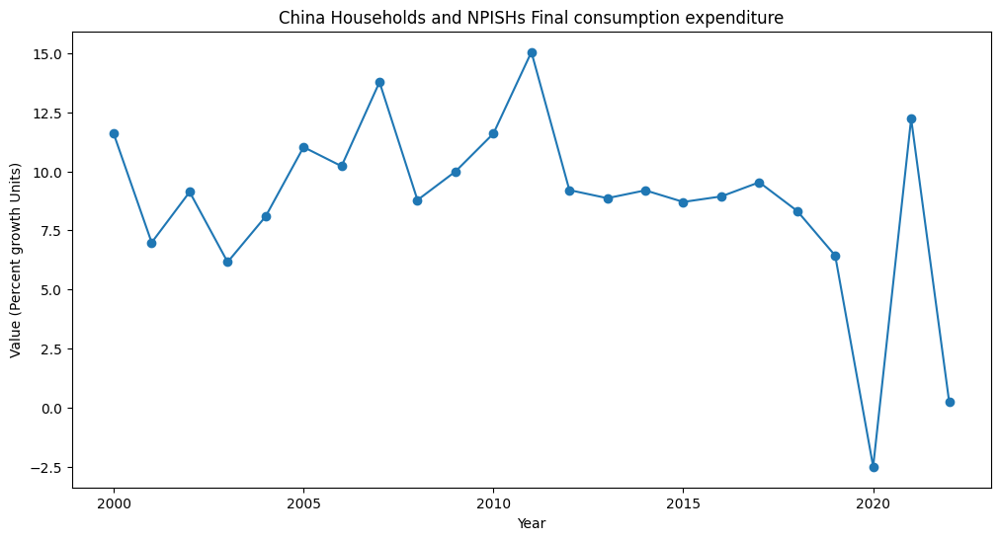

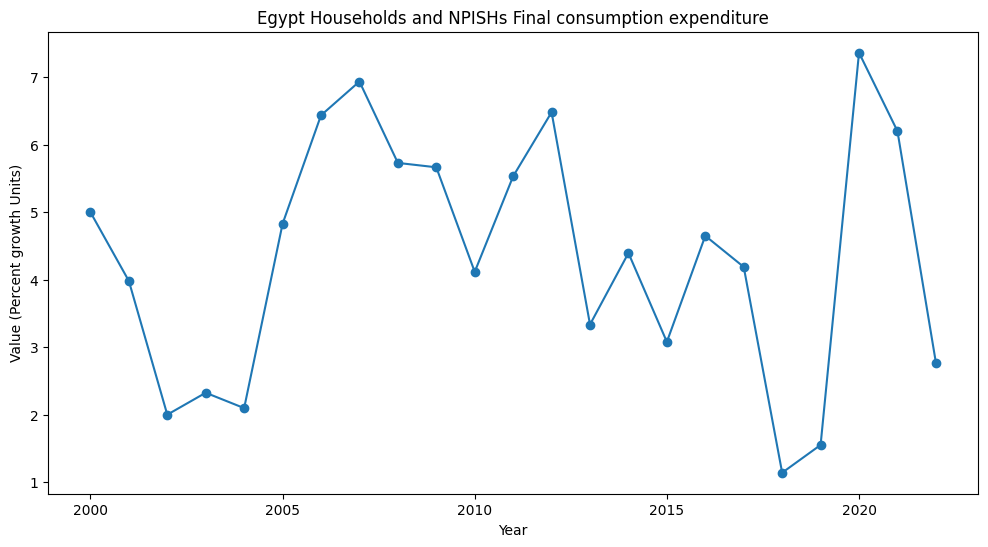

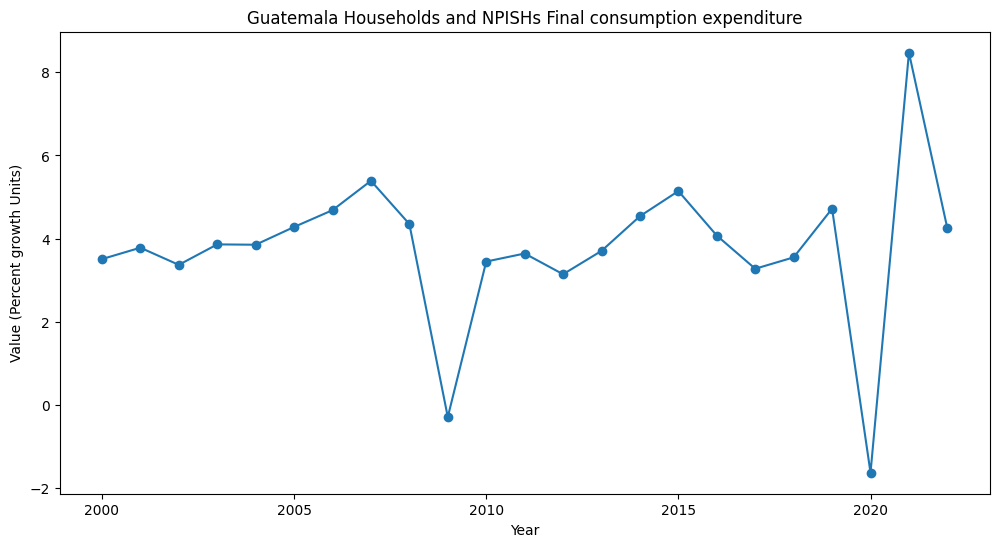

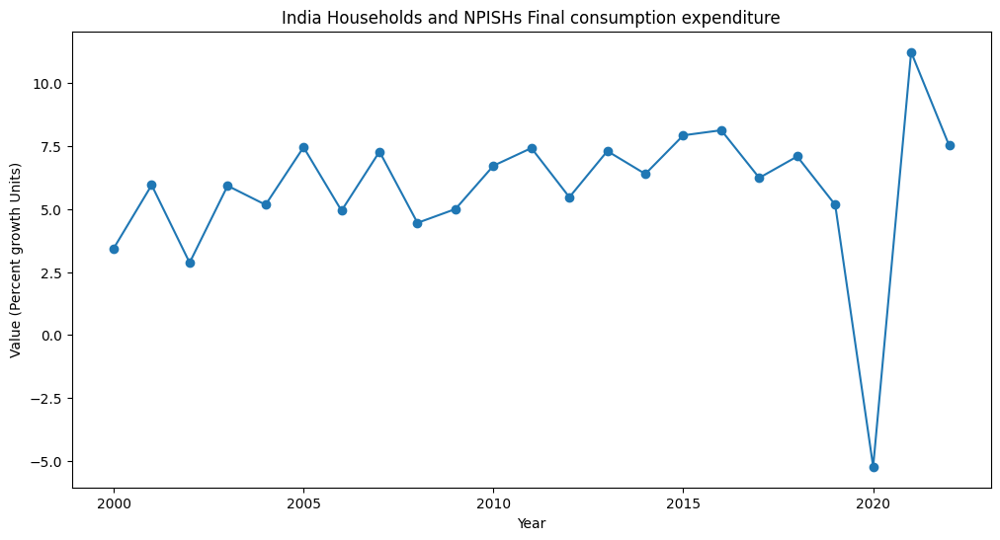

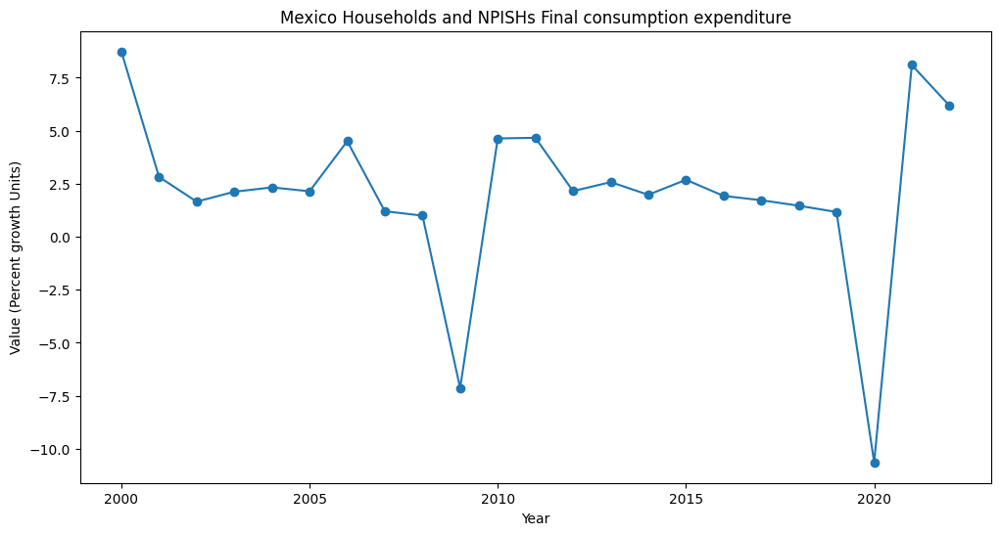

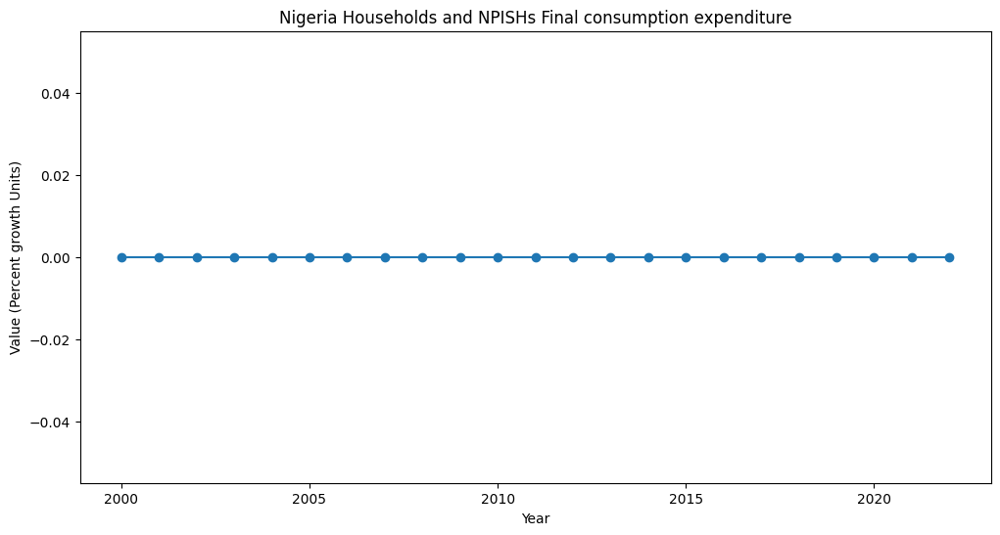

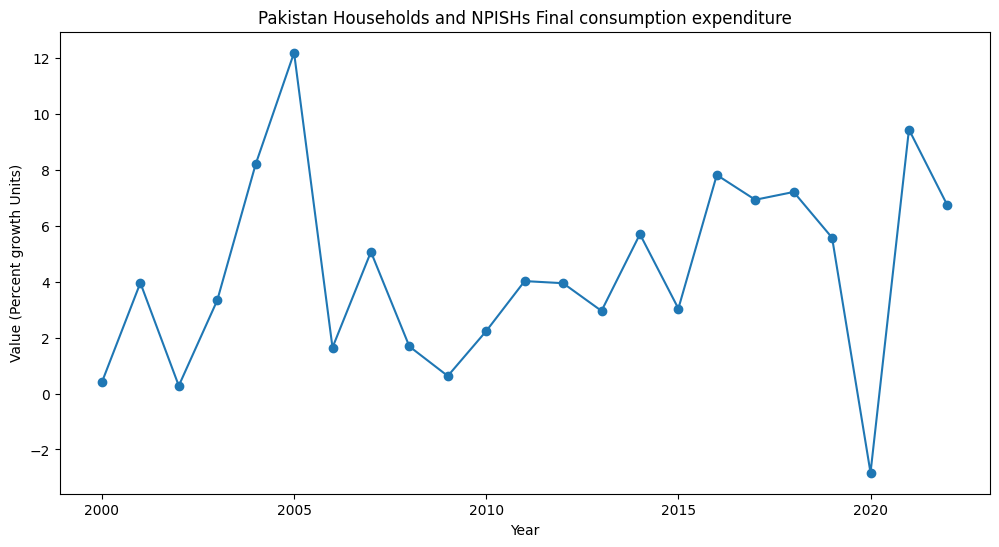

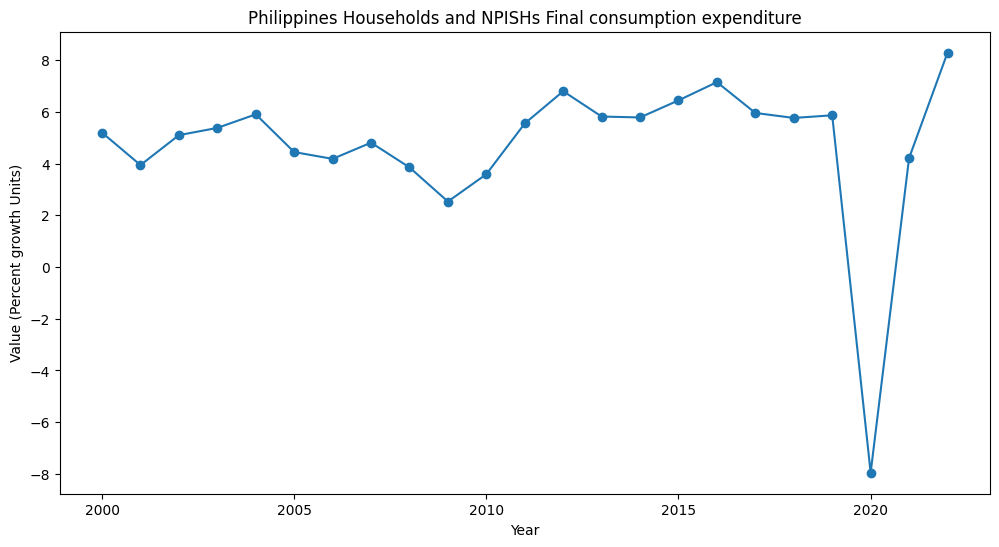

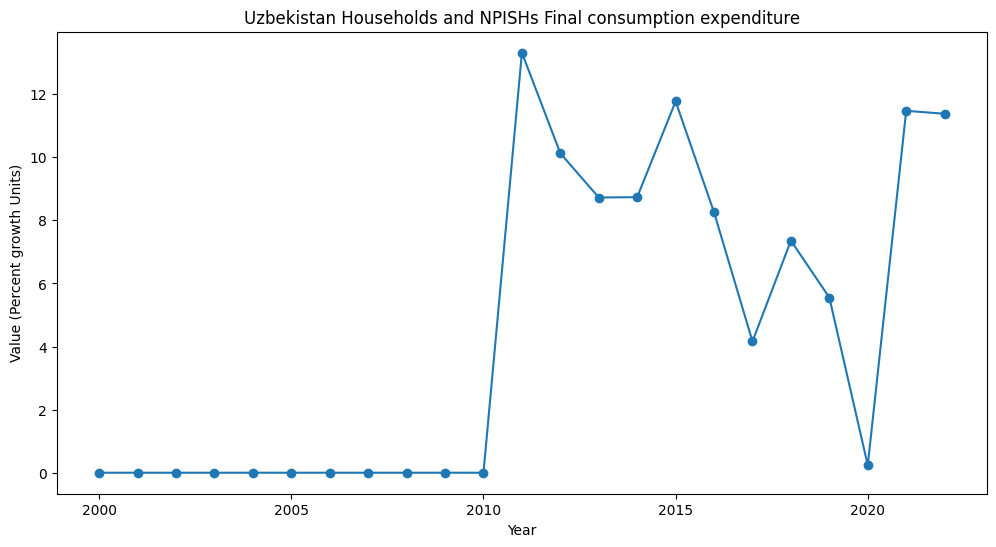

In [ ]:
#plot_grouped_data(grouped_data, 'Households and NPISHs Final consumption expenditure', 'Value', 'China Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_china, 'Households and NPISHs Final consumption expenditure', 'Value', 'China Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_egypt, 'Households and NPISHs Final consumption expenditure', 'Value', 'Egypt Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_guatemala, 'Households and NPISHs Final consumption expenditure', 'Value', 'Guatemala Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_india, 'Households and NPISHs Final consumption expenditure', 'Value', 'India Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_mexico, 'Households and NPISHs Final consumption expenditure', 'Value', 'Mexico Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_nigeria, 'Households and NPISHs Final consumption expenditure', 'Value', 'Nigeria Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_pakistan, 'Households and NPISHs Final consumption expenditure', 'Value','Pakistan Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_philippines, 'Households and NPISHs Final consumption expenditure', 'Value', 'Philippines Households and NPISHs Final consumption expenditure')
plot_grouped_data(grouped_data_uzbekistan, 'Households and NPISHs Final consumption expenditure', 'Value', 'Uzbekistan Households and NPISHs Final consumption expenditure')

# Next Steps

- ```bangladesh = pd.read_csv("/content/drive/MyDrive/Team Ansible/2.Datasets/Raw Data/Bangladesh.csv")```

Change this with the necessary country name

```unique_elements = bangladesh['Element'].unique()```
```print(unique_elements)```
This is to find the name of the columns

- Now, use the ```plot_grouped_data``` function and change the parameter names to create plots!



## Extra To-Do's

Plot a graph for each specific element superimposing all countries with each other (if possible, might not be possible if the unit and scale are different)
This would help us compare the countries.

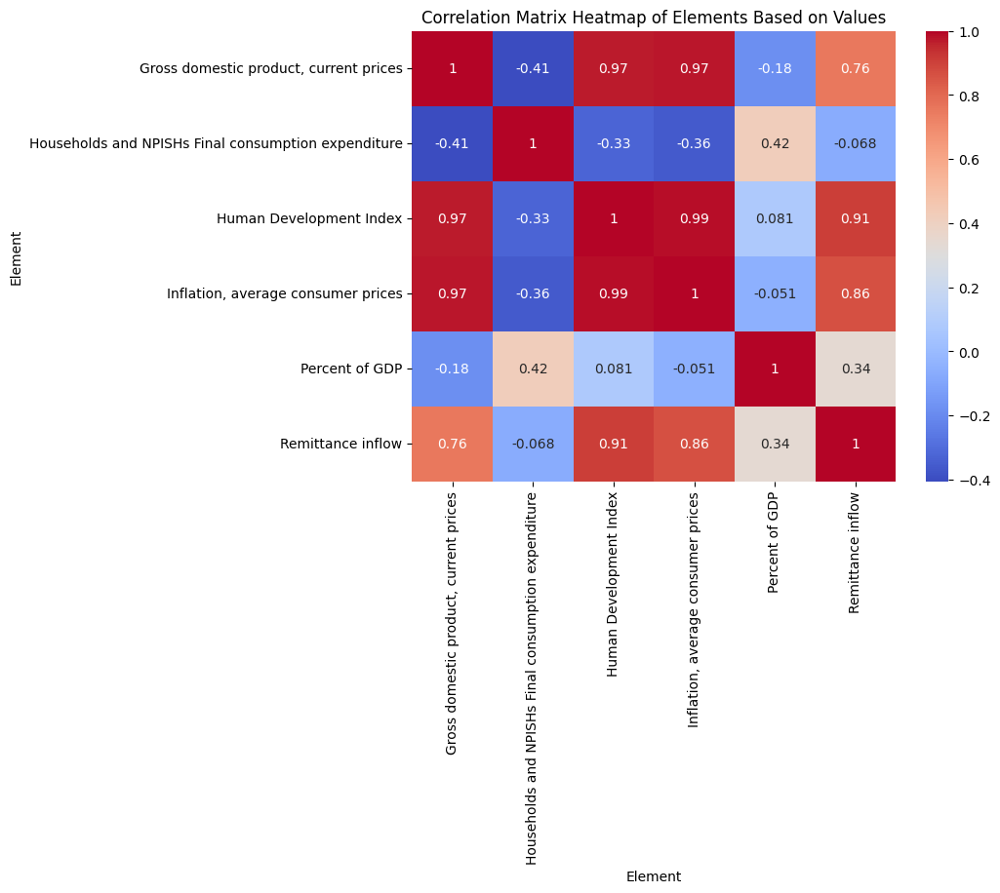

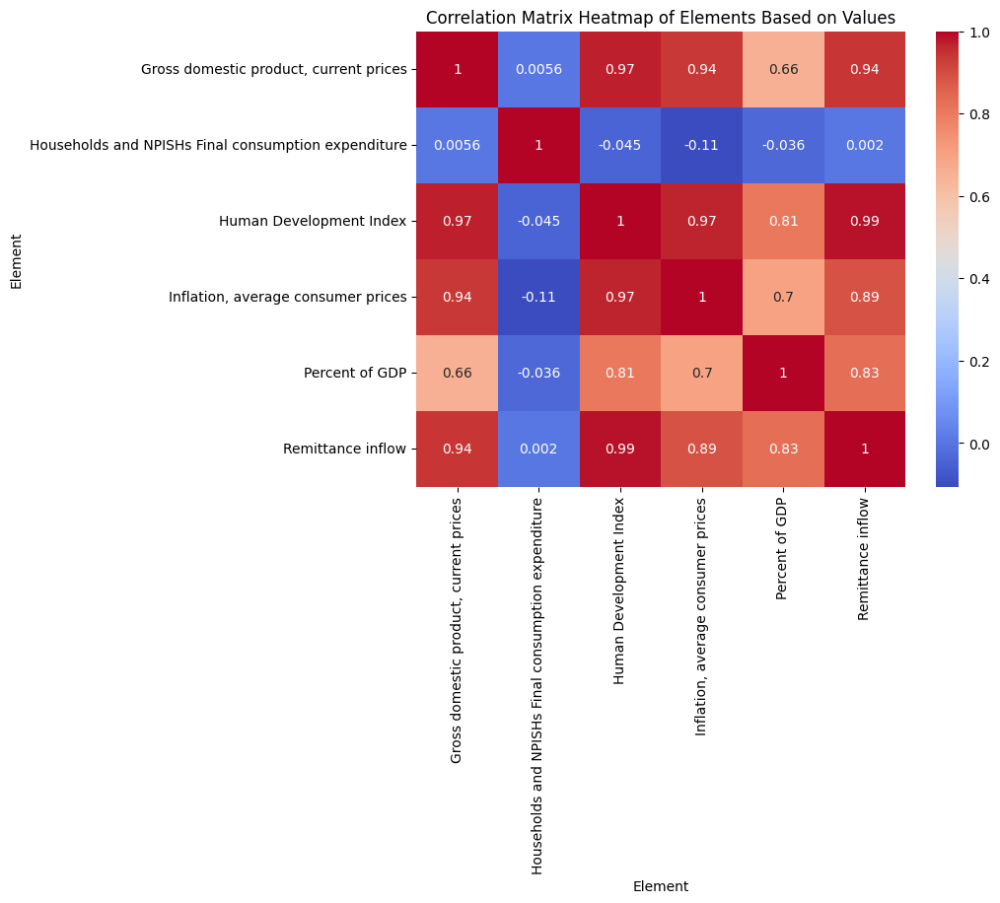

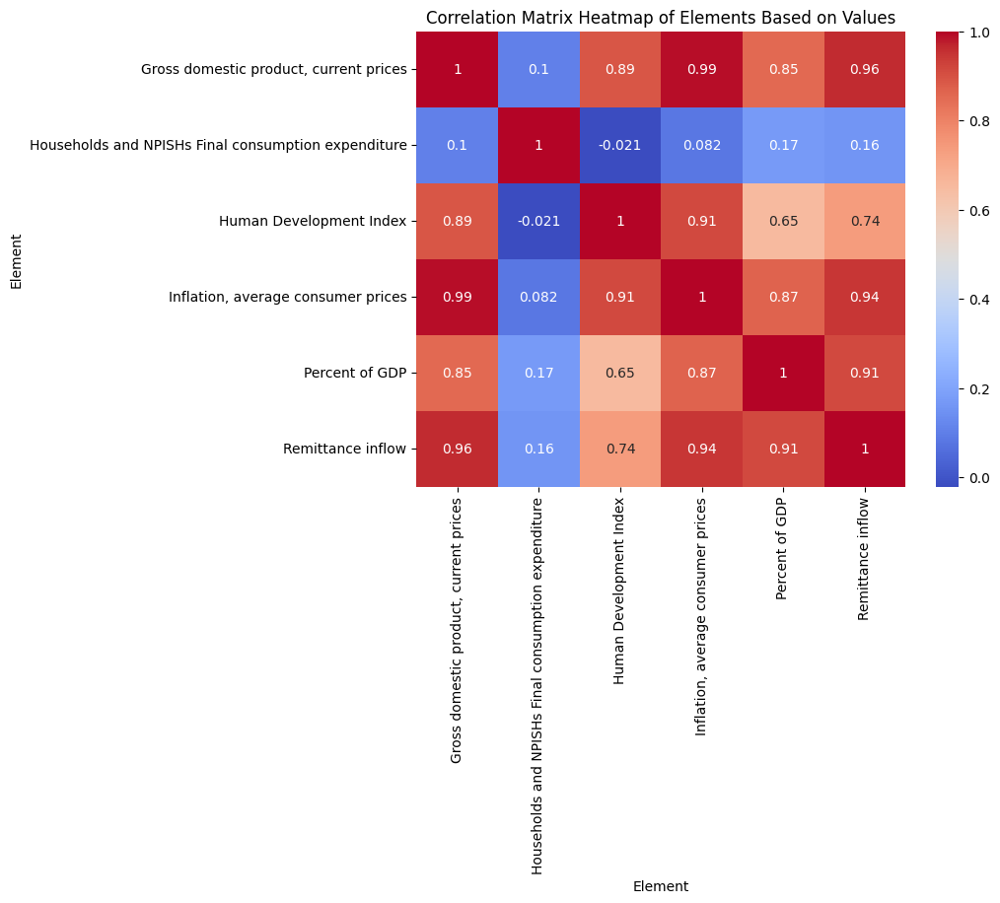

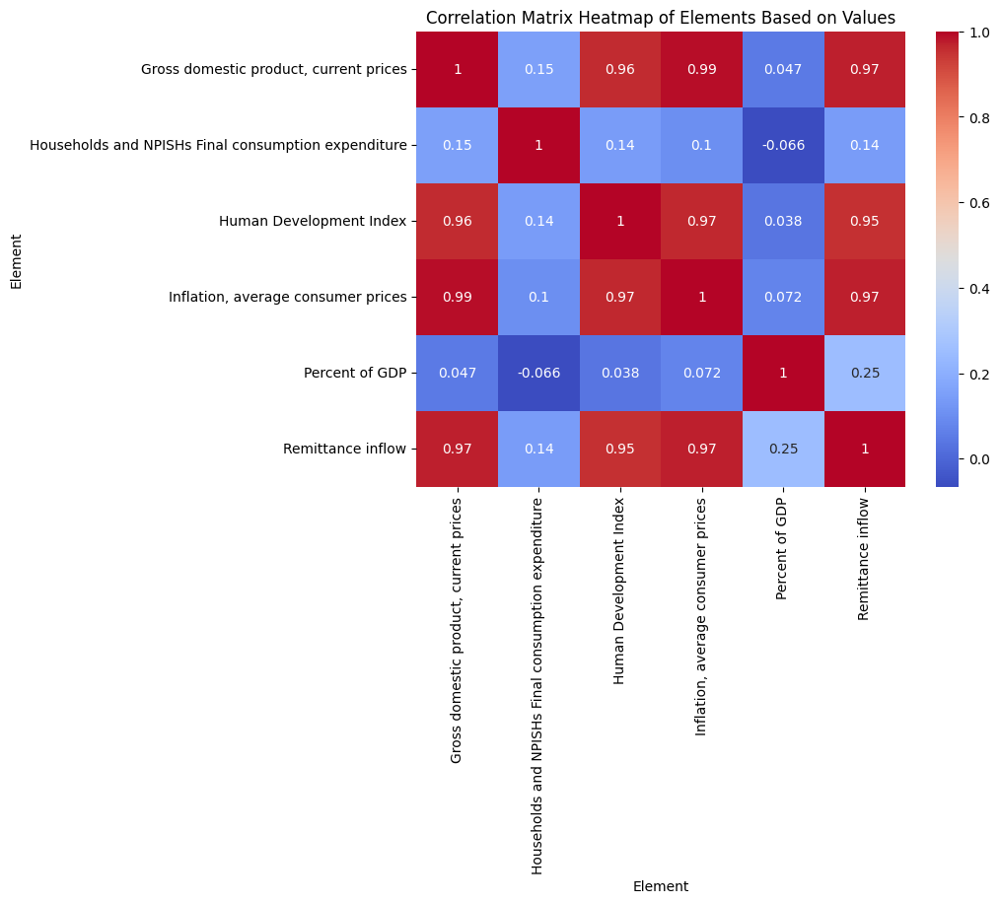

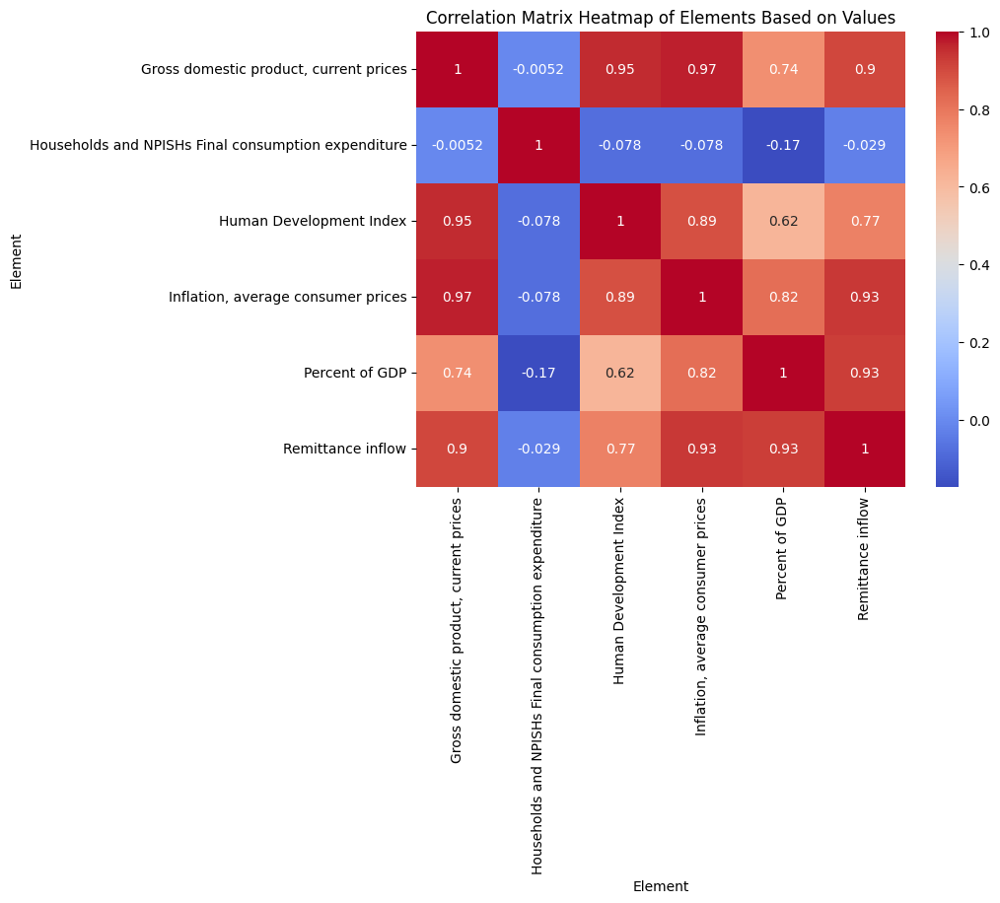

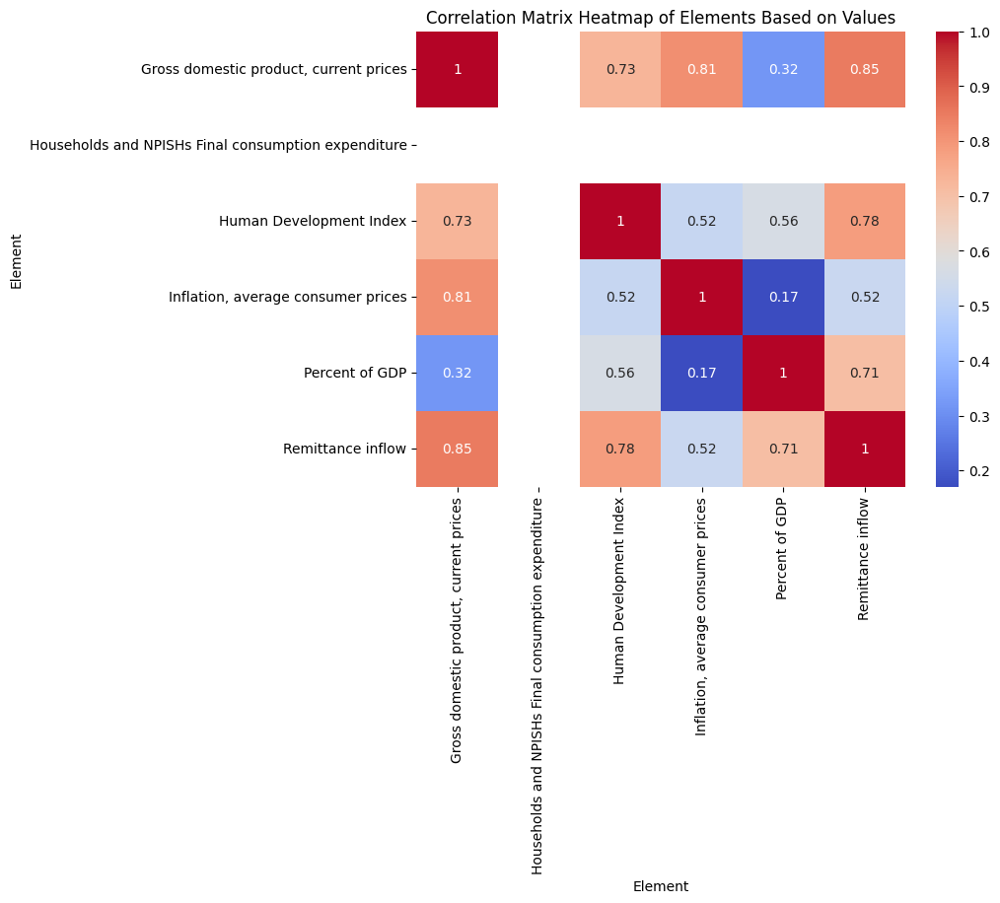

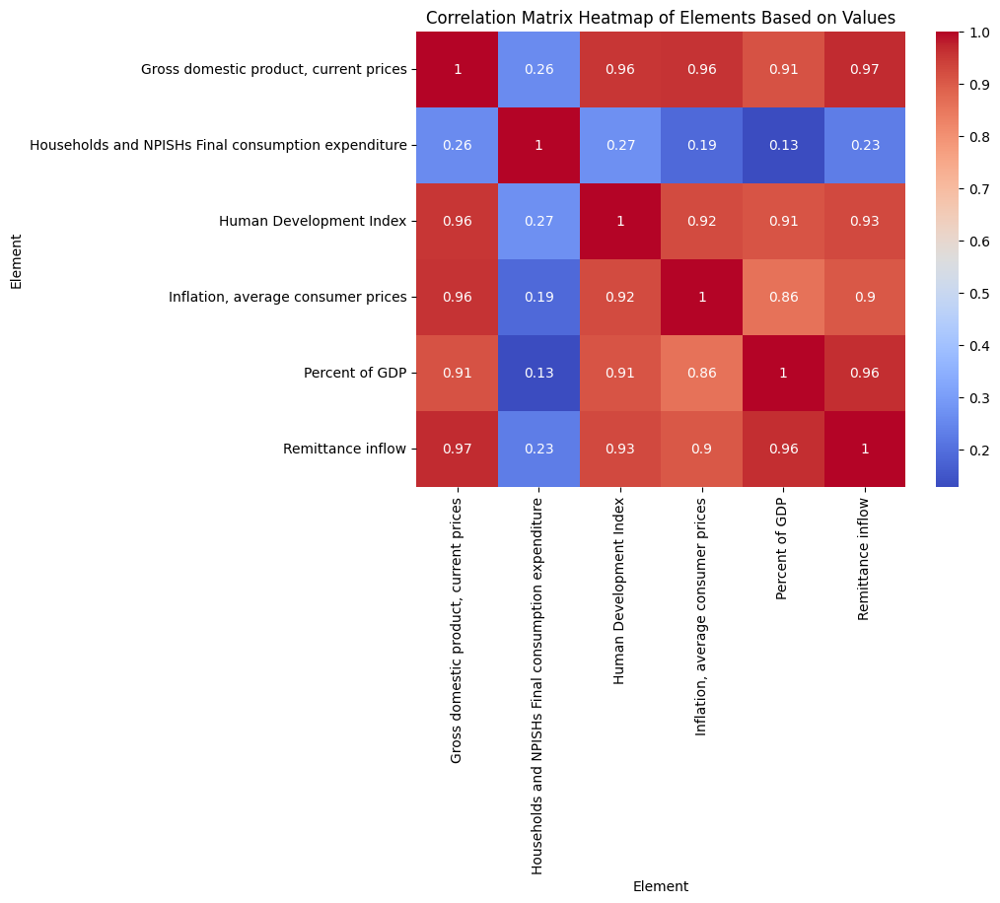

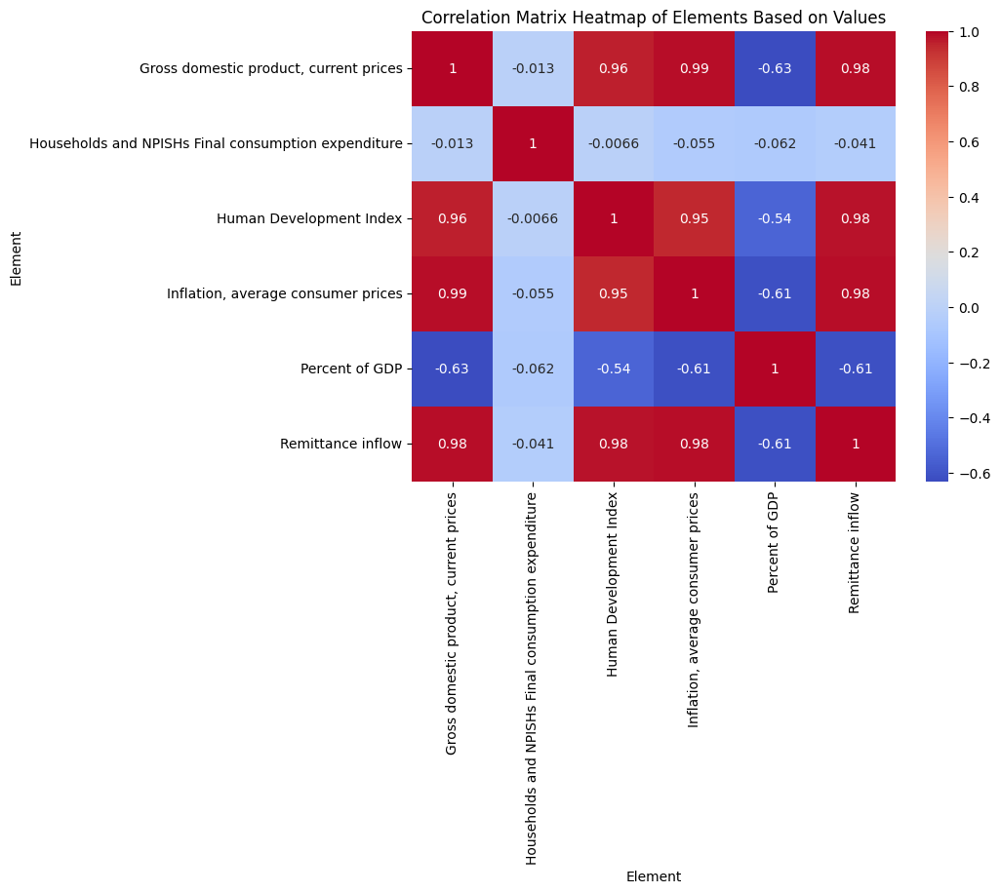

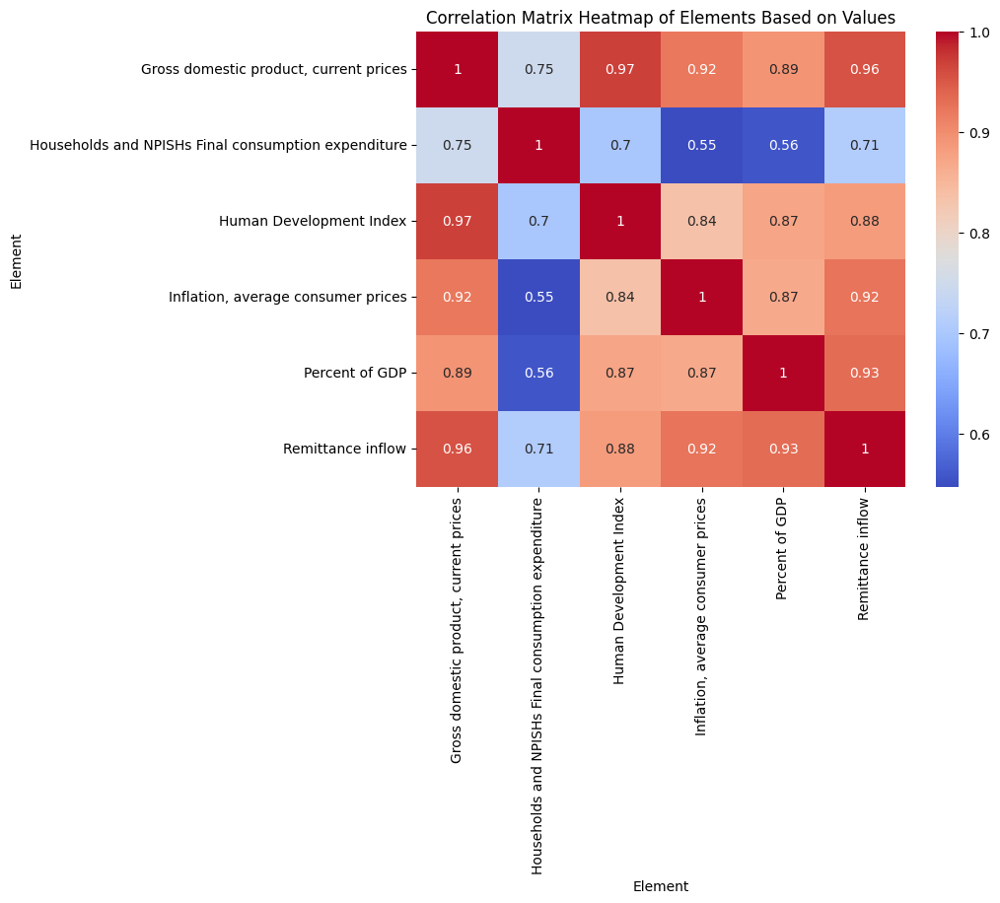

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

elements_to_exclude = ['Unemployment rate', 'Multidimensional poverty headcount ratio (World Bank)']
filtered_china = china[~china['Element'].isin(elements_to_exclude)]
filtered_egypt = egypt[~egypt['Element'].isin(elements_to_exclude)]
filtered_guatemala = guatemala[~guatemala['Element'].isin(elements_to_exclude)]
filtered_india = india[~india['Element'].isin(elements_to_exclude)]
filtered_mexico = mexico[~mexico['Element'].isin(elements_to_exclude)]
filtered_nigeria = nigeria[~nigeria['Element'].isin(elements_to_exclude)]
filtered_pakistan = pakistan[~pakistan['Element'].isin(elements_to_exclude)]
filtered_philippines = philippines[~philippines['Element'].isin(elements_to_exclude)]
filtered_uzbekistan = uzbekistan[~uzbekistan['Element'].isin(elements_to_exclude)]

#filtered_df['Value'] = filtered_df['Value'].str.replace(',', '').astype(float)

aggregated_china = filtered_china.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_egypt = filtered_egypt.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_guatemala = filtered_guatemala.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_india = filtered_india.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_mexico = filtered_mexico.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_nigeria = filtered_nigeria.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_pakistan = filtered_pakistan.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_philippines = filtered_philippines.groupby(['Year', 'Element'], as_index=False)['Value'].mean()
aggregated_uzbekistan = filtered_uzbekistan.groupby(['Year', 'Element'], as_index=False)['Value'].mean()


pivot_china = aggregated_china.pivot(index='Year', columns='Element', values='Value')
pivot_egypt = aggregated_egypt.pivot(index='Year', columns='Element', values='Value')
pivot_guatemala = aggregated_guatemala.pivot(index='Year', columns='Element', values='Value')
pivot_india = aggregated_india.pivot(index='Year', columns='Element', values='Value')
pivot_mexico = aggregated_mexico.pivot(index='Year', columns='Element', values='Value')
pivot_nigeria= aggregated_nigeria.pivot(index='Year', columns='Element', values='Value')
pivot_pakistan = aggregated_pakistan.pivot(index='Year', columns='Element', values='Value')
pivot_philippines = aggregated_philippines.pivot(index='Year', columns='Element', values='Value')
pivot_uzbekistan = aggregated_uzbekistan.pivot(index='Year', columns='Element', values='Value')



correlation_matrix_china = pivot_china.corr()
correlation_matrix_egypt = pivot_egypt.corr()
correlation_matrix_guatemala = pivot_guatemala.corr()
correlation_matrix_india = pivot_india.corr()
correlation_matrix_mexico = pivot_mexico.corr()
correlation_matrix_nigeria = pivot_nigeria.corr()
correlation_matrix_pakistan = pivot_pakistan.corr()
correlation_matrix_philippines = pivot_philippines.corr()
correlation_matrix_uzbekistan = pivot_uzbekistan.corr()




plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_china, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_egypt, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_guatemala, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_india, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_mexico, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_nigeria, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_pakistan, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_philippines, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_uzbekistan, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap of Elements Based on Values')

#plt.title('Correlation Matrix Heatmap of Elements Based on Values')
plt.show()

# ARIMA

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error

In [ ]:
china.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Year          236 non-null    int64  
 1   Country       236 non-null    object 
 2   Country Code  236 non-null    object 
 3   Region        236 non-null    object 
 4   Element       236 non-null    object 
 5   Unit          236 non-null    object 
 6   Scale         236 non-null    object 
 7   Value         236 non-null    float64
dtypes: float64(1), int64(1), object(6)
memory usage: 14.9+ KB


In [ ]:
china.head()

,Year,Country,Country Code,Region,Element,Unit,Scale,Value
0,2000,China,CHN,Emerging and Developing Asia,Remittance inflow,US Dollar,Million,758.000
1,2000,China,CHN,Emerging and Developing Asia,"Gross domestic product, current prices",US Dollar,Billion,1205.530
2,2000,China,CHN,Emerging and Developing Asia,Percent of GDP,Percentage,Units,0.063
3,2000,China,CHN,Emerging and Developing Asia,"Gross domestic product, current prices",Purchasing power parity; international dollars,Billion,3657.930
4,2000,China,CHN,Emerging and Developing Asia,"Inflation, average consumer prices",Index,Units,70.496


In [ ]:
china_train = china.iloc[:118].copy()
china_test = china.iloc[119:].copy()

In [ ]:
#plt.plot(china_train['Year'],china_train['Value'])

In [ ]:
china_train['Value']

0        758.000000
1       1205.530000
2          0.063000
3       3657.930000
4         70.496000
           ...     
113    13735.670000
114       91.772000
115        5.416000
116        0.706000
117       15.046927
Name: Value, Length: 118, dtype: float64

# Checking stationarity

In [ ]:
#adf_test = adfuller(china_train['Value'])
#print(f'p-value:{adf_test[1]}')



# Transform to stationary: differencing

In [ ]:
#china_train_diff = china_train['Value'].diff().dropna()
#china_train_diff.plot()

'''if adf_test[1] < 0.05:
    print("The original time series is already stationary.")
else:
    # Iterate until the series becomes stationary
    china_train_diff = china_train['Value']

    while True:

        # Apply differencing transformation
        china_train_diff = china_train['Value'].diff().dropna()

        # Perform ADF test on the transformed series
        adf_test = adfuller(china_train_diff)
        print('ADF Statistic:', adf_test[0])
        print('p-value:', adf_test[1])

        # Check stationarity
        if (adf_test[1]) < 0.05:
          #print(china_train_diff)
          china_train_diff.plot()
          print("The time series is now stationary after transformation.")
          break'''

'if adf_test[1] < 0.05:\n    print("The original time series is already stationary.")\nelse:\n    # Iterate until the series becomes stationary\n    china_train_diff = china_train[\'Value\']\n\n    while True:\n\n        # Apply differencing transformation\n        china_train_diff = china_train[\'Value\'].diff().dropna()\n\n        # Perform ADF test on the transformed series\n        adf_test = adfuller(china_train_diff)\n        print(\'ADF Statistic:\', adf_test[0])\n        print(\'p-value:\', adf_test[1])\n\n        # Check stationarity\n        if (adf_test[1]) < 0.05:\n          #print(china_train_diff)\n          china_train_diff.plot()\n          print("The time series is now stationary after transformation.")\n          break'

# SARIMA

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [ ]:
#plt.plot(china_train['Year'],china_train['Value'])
china_train.head()

,Year,Country,Country Code,Region,Element,Unit,Scale,Value
0,2000,China,CHN,Emerging and Developing Asia,Remittance inflow,US Dollar,Million,758.000
1,2000,China,CHN,Emerging and Developing Asia,"Gross domestic product, current prices",US Dollar,Billion,1205.530
2,2000,China,CHN,Emerging and Developing Asia,Percent of GDP,Percentage,Units,0.063
3,2000,China,CHN,Emerging and Developing Asia,"Gross domestic product, current prices",Purchasing power parity; international dollars,Billion,3657.930
4,2000,China,CHN,Emerging and Developing Asia,"Inflation, average consumer prices",Index,Units,70.496


In [ ]:
# Define SARIMA model parameters
p, d, q = 1, 0, 0
P, D, Q, m = 1, 0, 0, 12

# Create and fit SARIMA model
model = SARIMAX(list(china_train['Value']), order=(p, d, q), seasonal_order=(P, D, Q, m))
result = model.fit()



In [ ]:
#forecast = result.predict(start=len(china_train), end=len(china_train) + len(china_test) - 1)
forecast = result.get_forecast(steps=12)
forecast_mean = forecast.predicted_mean
observed =
#forecast
mse = mean_squared_error(list(china_test['Value']),forecast_mean)
print(f'Mean Squared Error: {mse}')